In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

import xarray as xr
import numpy as np
import dask.array
# import cosima_cookbook as cc
import intake
from access_nri_intake.source.builders import AccessOm2Builder

from gsw import alpha, SA_from_SP, p_from_z, CT_from_pt, beta, sigma1, sigma0
# note these gsw numpy functions mean some care is needed to avoid memory issues in very high-res analysis 

## plotting
import matplotlib.pyplot as plt
from matplotlib import gridspec
import cmocean.cm as cmo
import matplotlib.colors as col
import cartopy.crs as ccrs
import matplotlib.path as mpath
from matplotlib import rc
rc('text', usetex=False)
rc('xtick', labelsize=25) 
rc('ytick', labelsize=25) 
rc('axes', labelsize=25) 



from dask.distributed import Client

figdir = '/g/data/e14/fbd581/basal_mom5-collaborative-project/figures/'
root = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT/'

In [2]:
client = Client()#threads_per_worker=1)
client.dashboard_link

'/proxy/8787/status'

### create Basal project part 2 intake:

In [3]:
# add experiments to my own intake:

# - control:
path_ctrl = "/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_21mbath"

# - basal No Gade: GPC029 (Basal)   
path_noBG = '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalNoGade_NoIcb'

# - basal Gade: GPC023 (Basal_LH)   
path_BG = '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalGade_NoIcb'

# - basal Gade Brine: GPC062 (Basal_LH_Brine)    
path_BGB = '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalGade_NoIcb_Brine'

### SOFIA meltwater perturbation expts:
# - control:
path_ctrl_sofia = "/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_21mbath_sofia_ssp126"

# - basal No Gade: GPC029 (Basal)   
path_noBG_sofia = "/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalNoGade_NoIcb_sofia_ssp126"

# - basal Gade Brine: GPC062 (Basal_LH_Brine)    
path_BGB_sofia = "/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalGade_NoIcb_Brine_sofia_ssp126"

path_ctrl_antwater = "/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_21mbath_sofia_antwater"
path_BGB_antwater = "/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_DSW_BasalGade_NoIcb_Brine_sofia_antwater"

# new control runs with Gadel line:
path_ctrl_BG = "/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_21mbath_Gade"
path_ctrl_BG_antwater = "/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_21mbath_Gade_sofia_antwater"
path_ctrl_antwater_BG = "/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_21mbath_sofia_antwater_Gade"


#### run section below to build the datastore (in case not done before/update in model outputs)

In [4]:
%%time

builder = AccessOm2Builder(
    path=path_ctrl
).build()

builder.save(
    name="DSW_control", 
    description="Datastore for ACCESS-OM2 ryf9091 DSW control",
)


builder = AccessOm2Builder(
    path=path_noBG
).build()

builder.save(
    name="Basal", 
    description="Datastore for ACCESS-OM2 ryf9091 Basal",
)

builder = AccessOm2Builder(
    path=path_BG,
).build()

builder.save(
    name="Basal_LH", 
    description="Datastore for ACCESS-OM2 ryf9091 Basal_LH",
)

builder = AccessOm2Builder(
    path=path_BGB,
).build()

builder.save(
    name="Basal_LH_Brine", 
    description="Datastore for ACCESS-OM2 ryf9091 Basal_LH_Brine",
)


builder = AccessOm2Builder(
    path=path_ctrl_sofia
).build()

builder.save(
    name="DSW_control_sofia", 
    description="Datastore for ACCESS-OM2 ryf9091 SOFIA control (mbath21)",
)


builder = AccessOm2Builder(
    path=path_noBG_sofia
).build()

builder.save(
    name="Basal_sofia", 
    description="Datastore for ACCESS-OM2 ryf9091 SOFIA Basal rep.",
)


builder = AccessOm2Builder(
    path=path_BGB_sofia
).build()

builder.save(
    name="Basal_LH_Brine_sofia", 
    description="Datastore for ACCESS-OM2 ryf9091 SOFIA Basal_LH_Brine rep.",
)


builder = AccessOm2Builder(
    path=path_ctrl_antwater
).build()

builder.save(
    name="DSW_control_antwater", 
    description="Datastore for ACCESS-OM2 ryf9091 SOFIA Antwater control (mbath21)",
)


builder = AccessOm2Builder(
    path=path_BGB_antwater
).build()

builder.save(
    name="Basal_LH_Brine_antwater", 
    description="Datastore for ACCESS-OM2 ryf9091 SOFIA Antwater Basal_LH_Brine",
)


builder = AccessOm2Builder(
    path=path_ctrl_BG
).build()

builder.save(
    name="DSW_control_LH", 
    description="Datastore for ACCESS-OM2 ryf9091 control + Antwater applying Gade line (all runoff)",
)


builder = AccessOm2Builder(
    path=path_ctrl_BG_antwater
).build()

builder.save(
    name="DSW_control_LH_antwater", 
    description="Datastore for ACCESS-OM2 ryf9091 control applying Gade line only for Antwater anomaly",
)


builder = AccessOm2Builder(
    path=path_ctrl_antwater_BG
).build()

builder.save(
    name="DSW_control_antwater_LH", 
    description="Datastore for ACCESS-OM2 ryf9091 control applying Gade line only for Antwater anomaly",
)

Successfully wrote ESM catalog json file to: file:///home/581/fbd581/DSW_control.json
Successfully wrote ESM catalog json file to: file:///home/581/fbd581/Basal.json
Successfully wrote ESM catalog json file to: file:///home/581/fbd581/Basal_LH.json
Successfully wrote ESM catalog json file to: file:///home/581/fbd581/Basal_LH_Brine.json
Successfully wrote ESM catalog json file to: file:///home/581/fbd581/DSW_control_sofia.json
Successfully wrote ESM catalog json file to: file:///home/581/fbd581/Basal_sofia.json
Successfully wrote ESM catalog json file to: file:///home/581/fbd581/Basal_LH_Brine_sofia.json
Successfully wrote ESM catalog json file to: file:///home/581/fbd581/DSW_control_antwater.json
Successfully wrote ESM catalog json file to: file:///home/581/fbd581/Basal_LH_Brine_antwater.json
Successfully wrote ESM catalog json file to: file:///home/581/fbd581/DSW_control_LH.json
Successfully wrote ESM catalog json file to: file:///home/581/fbd581/DSW_control_LH_antwater.json
Successfu

#### loading intake datastore for individual experiments:

In [4]:
cat = intake.open_esm_datastore(
    "./DSW_control.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important
)

cat_noBG = intake.open_esm_datastore(
    "./Basal.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important
)

cat_BG = intake.open_esm_datastore(
    "./Basal_LH.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important
)

cat_BGB = intake.open_esm_datastore(
    "./Basal_LH_Brine.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important
)

cat_sofia = intake.open_esm_datastore(
    "./DSW_control_sofia.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important 
)

cat_noBG_sofia = intake.open_esm_datastore(
    "./Basal_sofia.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important
)

cat_BGB_sofia = intake.open_esm_datastore(
    "./Basal_LH_Brine_sofia.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important
)

cat_antwater = intake.open_esm_datastore(
    "./DSW_control_antwater.json",
    columns_with_iterables=["variable"] # This is important
)

cat_BGB_antwater = intake.open_esm_datastore(
    "./Basal_LH_Brine_antwater.json",
    columns_with_iterables=["variable"] # This is important
)

cat_SSStest = intake.open_esm_datastore(
    "./DSW_control_noSSSrest.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important
)

cat_ctrlBG = intake.open_esm_datastore(
    "./DSW_control_LH.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important
)

cat_ctrlBG_antwater = intake.open_esm_datastore(
    "./DSW_control_LH_antwater.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important
)

cat_ctrl_antwater_BG = intake.open_esm_datastore(
    "./DSW_control_antwater_LH.json",
    columns_with_iterables=["variable",
                            "variable_long_name",
                            "variable_standard_name",
                            "variable_cell_methods",
                            "variable_units"] # This is important
)

### start SWMT calcutions:

In [5]:
# Make sure these match the available restarts:
start_time='1917-01-01'
end_time='1919-12-31'
time_slice = slice(start_time,end_time)
lat_slice  = slice(-80,-59)

# outpath = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT/'

outpath = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/'

In [6]:
# # alternative just for control Vs control_SSStest:
# start_time='1910-01-01'
# end_time='1911-12-31'
# time_slice = slice(start_time,end_time)
# lat_slice  = slice(-80,-59)

# outpath = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT/'

In [7]:
## Intake version:
# def save_SWMT(catag, session, start_time, end_time)#, outpath, lat_north = -59, n = None, basal=None):
def save_SWMT(catag, start_time, end_time, outpath, lat_north = -59, n = None, basal=None, brine=None, sofia=None):
    '''
    Computes southern ocean surface water-mass transformation rates (partitioned into transformation from heat 
    and freshwater) referenced to 1000 db from monthly ACCESS-OM2 output.
    Suitable for analysis of high-resolution (0.1 degree) output (the scattered .load()'s allowed this)
    
    expt - text string indicating the name of the experiment
    session - a database session created by cc.database.create_session()  
    start_time - text string designating the start month of the analysis ('YYYY-MM', e.g. '1905-01')
    end_time - text string indicating the end month of the analysis ('YYY-MM', e.g. '1905-12')
    outpath - text string indicating directory where output databases are to be saved (3 xarray databases, can
    modify to combine these if memory permits)
    lat_north - function computed processes between lat = -90 and lat = lat_north
    n - designate if a subset of output files is to be considered (see cc.querying.getvar)
    
    NOTE: this function assumes you are averaging over an integer number of years (though the start month 
    need not be january, e.g. can have start_time = '1905-05', end_time = '1907-04' etc), modify if otherwise.
    
    NOTE: assumes surface_temp and surface_salt variables are in potential temperature (K) and practical
    salinity (PSU), simplifications may be made if conservative temperature (C) and absolute salinity (g/kg)
    are computed online
    
    required modules:
    xarray as xr
    numpy as np
    cosima_cookbook as cc
    from gsw import alpha, SA_from_SP, p_from_z, CT_from_pt, beta, sigma1, sigma0
    '''
    ## slice for time and latitudinal constraints
    time_slice = slice(start_time,end_time)
    #lat_slice = slice(-90,lat_north)
    lat_slice = slice(-79.59,-58.98)
    ## getvar all required variables
    tmp = catag.search(variable="temp", frequency="1mon").to_dask(decode_timedelta=True)
    SST = tmp.isel(st_ocean=0)-273.15  #.sel(time=slice(start_time, end_time))
    SST = SST.sel(time=time_slice, yt_ocean=lat_slice)
    tmp = catag.search(variable="salt", frequency="1mon").to_dask(decode_timedelta=True)
    SSS_PSU = tmp.isel(st_ocean=0)
    SSS_PSU = SSS_PSU.sel(time=time_slice, yt_ocean=lat_slice)
    tmp = catag.search(variable="pme_river", frequency="1mon").to_dask(decode_timedelta=True)
    pme_river= tmp.sel(time=time_slice, yt_ocean=lat_slice)
    tmp = catag.search(variable="sfc_salt_flux_ice", frequency="1mon").to_dask(decode_timedelta=True)
    sfc_salt_flux_ice= tmp.sel(time=time_slice, yt_ocean=lat_slice)
    tmp = catag.search(variable="sfc_salt_flux_restore",frequency="1mon").to_dask(decode_timedelta=True)
    sfc_salt_flux_restore= tmp.sel(time=time_slice, yt_ocean=lat_slice)
    ## getvar the components of the net surface heat fux instead of the net_surface_heating variable
    if basal == True:
        tmp = catag.search(variable="sfc_hflux_from_runoff", frequency="1mon").to_dask(decode_timedelta=True)
        sfc_hflux_from_runoff = tmp.sel(time=time_slice, yt_ocean=lat_slice)
        tmp = cat.search(variable="sfc_hflux_from_runoff", frequency="1mon").to_dask(decode_timedelta=True) ### always read control in this line!
        sfc_hflux_from_runoff_con = tmp.sel(time=time_slice, yt_ocean=lat_slice)
        tmp = catag.search(variable="temp_basalmix", frequency="1mon").to_dask(decode_timedelta=True)
        hflux_from_basal = tmp.sel(time=time_slice, yt_ocean=lat_slice)
        # for basal_fwflx2d, always read BGB expt, as noBG experiment misses the diagnostic in some years.
        # tmp = cat_BGB.search(variable="basal_fwflx2d", frequency="1mon", filename='ocean_monthly_2d_basal.nc').to_dask(decode_timedelta=True)
        # basal_fwflx = tmp.sel(time=time_slice, yt_ocean=lat_slice)
        if brine == True and sofia == False:
            tmp = catag.search(variable="basal_fwflx2d", frequency="1mon", filename='ocean_monthly_2d_basal.nc').to_dask(decode_timedelta=True)
            basal_fwflx = tmp.sel(time=time_slice, yt_ocean=lat_slice)
        elif brine == False and sofia == False:
            tmp = cat_BGB.search(variable="basal_fwflx2d", frequency="1mon", filename="ocean_monthly_2d_basal.nc").to_dask(decode_timedelta=True)
            basal_fwflx = tmp.sel(time=time_slice, yt_ocean=lat_slice)
        elif brine == False and sofia == True:
            tmp = cat_BGB_sofia.search(variable="basal_fwflx2d", frequency="1mon", filename='ocean_monthly_2d_basal.nc').to_dask(decode_timedelta=True)
            basal_fwflx = tmp.sel(time=time_slice, yt_ocean=lat_slice)
        elif brine == True and sofia == True:
            tmp = cat_BGB_sofia.search(variable="basal_fwflx2d", frequency="1mon", filename='ocean_monthly_2d_basal.nc').to_dask(decode_timedelta=True)
            # tmp = cat_BGB_antwater.search(variable="basal_fwflx2d", frequency="1mon", filename='ocean_monthly_2d_basal.nc').to_dask(decode_timedelta=True)
            basal_fwflx = tmp.sel(time=time_slice, yt_ocean=lat_slice)   
        # briner_fwflx2d
        if brine == True:
            tmp = catag.search(variable="briner_fwflx2d", frequency="1mon", filename='ocean_monthly_2d_basal.nc').to_dask(decode_timedelta=True)
            briner_fwflx = tmp.sel(time=time_slice, yt_ocean=lat_slice)
    else:
        sfc_hflux_from_runoff = catag.search(variable="sfc_hflux_from_runoff", frequency="1mon").to_dask(decode_timedelta=True)


    tmp = catag.search(variable="sfc_hflux_coupler", frequency="1mon").to_dask(decode_timedelta=True)  # W/m2
    sfc_hflux_coupler = tmp.sel(time=time_slice, yt_ocean=lat_slice)
    tmp = catag.search(variable="sfc_hflux_pme", frequency="1mon").to_dask(decode_timedelta=True)          # W/m2
    sfc_hflux_pme= tmp.sel(time=time_slice, yt_ocean=lat_slice)
    tmp = catag.search(variable="frazil_3d_int_z", frequency="1mon").to_dask(decode_timedelta=True)       # W/m2
    frazil_3d_int_z= tmp.sel(time=time_slice, yt_ocean=lat_slice)        
    geolon_t = catag.search(variable="geolon_t").to_dask(decode_timedelta=True)
    geolat_t = catag.search(variable="geolat_t").to_dask(decode_timedelta=True)
    lon_t = geolon_t["geolon_t"].sel(yt_ocean=lat_slice)
    lat_t = geolat_t["geolat_t"].sel(yt_ocean=lat_slice)

    ## extract coordinate arrays
    yt_ocean = SST.yt_ocean.values
    xt_ocean = SST.xt_ocean.values
    st_ocean = catag.search(variable="st_ocean", frequency="1mon", filename='ocean.nc').to_dask(decode_timedelta=True)
    time_monthly = SST.time.values
    ## construct an xarray of days per month (check this is relevant to your run), simple modification if non integer number of years analysed
    start_month = int(start_time[5:7])
    end_month = int(end_time[5:7])
    n_years = int(len(SST.time)/12)
    months_standard_noleap = np.array([31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])
    if start_month != 1:
        months_offset_noleap = np.append(months_standard_noleap[(start_month-1):],months_standard_noleap[:(start_month-1)])
    else:
        months_offset_noleap = months_standard_noleap
    days_per_month = xr.DataArray(np.tile(months_offset_noleap, n_years), coords = [time_monthly], dims = ['time'], name = 'days per month')

    ## now I use some TEOS-10 gsw functions to compute absolute salinity, then potential density fields
    ## these are numpy functions, if you have memory errors this is a good step to check (though I have found
    ## this works on the VDI for 0.1 degree data, might be issues for very long time periods)
    depth = -st_ocean["st_ocean"].isel(st_ocean=0).values 
    depth_tile = (lat_t*0+1)*depth
    
    pressure = xr.DataArray(p_from_z(depth_tile,lat_t), coords = [yt_ocean, xt_ocean], dims = ['yt_ocean', 'xt_ocean'], name = 'pressure', attrs = {'units':'dbar'})
    # convert units to absolute salinity 
    ##SSS = xr.DataArray(SA_from_SP(SSS_PSU,pressure,lon_t,lat_t).values, coords = [time_monthly, yt_ocean, xt_ocean], dims = ['time','yt_ocean', 'xt_ocean'], name = 'sea surface salinity', attrs = {'units':'Absolute Salinity (g/kg)'})
    SSS_Darray = xr.DataArray(SA_from_SP(SSS_PSU['salt'],pressure,lon_t,lat_t), coords = [time_monthly, yt_ocean, xt_ocean], dims = ['time','yt_ocean', 'xt_ocean'], name = 'salt', attrs = {'units':'Absolute Salinity (g/kg)'})
    SSS = xr.Dataset(    {"salt": (['time','yt_ocean', 'xt_ocean'], SSS_Darray.data),},
        coords={
            "time": (["time"], time_monthly),
            "yt_ocean": (["yt_ocean"], yt_ocean),
            "xt_ocean": (["xt_ocean"], xt_ocean),
        },)

    ## SST is already saved as conservative temperature in this run, if you are working with an older run with potential 
    ## temperature saved, conversion will be required (make sure you work with C not K)
    # SST = xr.DataArray(CT_from_pt(SSS_AS,SST_PT), coords = [time_monthly, yt_ocean, xt_ocean], dims = ['time','yt_ocean', 'xt_ocean'], name = 'sea surface temperature', attrs = {'units':'Conservative Temperature (C)'})
    # SST = xr.DataArray(CT_from_pt(SSS_PSU,SST).values, coords = [time_monthly, yt_ocean, xt_ocean], dims = ['time','yt_ocean', 'xt_ocean'], name = 'sea surface temperature', attrs = {'units':'Conservative Temperature (C)'})

    ### USING POT_RHO1: -----------------------------------
    # # compute potential density referenced to 1000dbar (or referenced otherwise, depending on your purpose)
    # pot_rho_1 = xr.DataArray(sigma1(SSS['salt'], SST['temp']), coords = [time_monthly, yt_ocean, xt_ocean], dims = ['time','yt_ocean', 'xt_ocean'], name = 'potential density ref 1000dbar', attrs = {'units':'kg/m^3 (-1000 kg/m^3)'})
    # pot_rho_1 = pot_rho_1.load()

    # # clean pot_rho_1 to make sure we only have float values in it:
    # # Flatten the array and inspect the first few elements
    # flat = pot_rho_1.values.flatten()
    # # Replace method-type entries with np.nan
    # cleaned = np.array([
    #     float(val) if isinstance(val, (int, float, np.number)) else np.nan
    #     for val in pot_rho_1.values.flatten()]).reshape(pot_rho_1.shape)

    # # Reconstruct the DataArray
    # pot_rho_1_clean = xr.DataArray(
    #     cleaned,
    #     dims=pot_rho_1.dims,
    #     coords=pot_rho_1.coords,
    #     name=pot_rho_1.name)

    ### USING POT_RHO: --------------------------------------
    # compute potential density referenced to 1000dbar (or referenced otherwise, depending on your purpose)
    pot_rho_0 = xr.DataArray(sigma0(SSS['salt'], SST['temp']), coords = [time_monthly, yt_ocean, xt_ocean], dims = ['time','yt_ocean', 'xt_ocean'], name = 'potential density ref 0dbar', attrs = {'units':'kg/m^3 (-1000 kg/m^3)'})
    pot_rho_0 = pot_rho_0.load()

    # clean pot_rho_0 to make sure we only have float values in it:
    # Flatten the array and inspect the first few elements
    flat = pot_rho_0.values.flatten()
    # Replace method-type entries with np.nan
    cleaned = np.array([
        float(val) if isinstance(val, (int, float, np.number)) else np.nan
        for val in pot_rho_0.values.flatten()]).reshape(pot_rho_0.shape)

    # Reconstruct the DataArray
    pot_rho_0_clean = xr.DataArray(
        cleaned,
        dims=pot_rho_0.dims,
        coords=pot_rho_0.coords,
        name=pot_rho_0.name)


    ## convert individual term to DataArray before summing them; and in the end convert my net heat DataArray to a Dataset:
    # Salt:
    SSS_da = list(SSS.data_vars.values())[0]
    pme_river_da = list(pme_river.data_vars.values())[0]
    sfc_salt_flux_ice_da = list(sfc_salt_flux_ice.data_vars.values())[0]
    sfc_salt_flux_restore_da = list(sfc_salt_flux_restore.data_vars.values())[0]
    # Heat:
    sfc_hflux_from_runoff_da = list(sfc_hflux_from_runoff.data_vars.values())[0]
    sfc_hflux_coupler_da = list(sfc_hflux_coupler.data_vars.values())[0]
    sfc_hflux_pme_da = list(sfc_hflux_pme.data_vars.values())[0]
    frazil_3d_int_z_da = list(frazil_3d_int_z.data_vars.values())[0]
    if basal == True:
        hflux_from_basal_sumZ = hflux_from_basal.sum("st_ocean")
        hflux_from_basal_da = list(hflux_from_basal_sumZ.data_vars.values())[0]
        basal_fwflx_da = list(basal_fwflx.data_vars.values())[0]
        if brine == True:
            briner_fwflx_da = list(briner_fwflx.data_vars.values())[0]

    ## compute net surface salt flux from its component terms
    if basal == True: #account for basal_fwflx
        if brine == True:
            net_surface_salt_da = (SSS_da*(pme_river_da+basal_fwflx_da+briner_fwflx_da)-(sfc_salt_flux_ice_da + sfc_salt_flux_restore_da)*1000)
        else:
            net_surface_salt_da = (SSS_da*(pme_river_da+basal_fwflx_da)-(sfc_salt_flux_ice_da + sfc_salt_flux_restore_da)*1000)
    else:
        net_surface_salt_da = (SSS_da*pme_river_da-(sfc_salt_flux_ice_da + sfc_salt_flux_restore_da)*1000)
    net_surface_salt = xr.Dataset({'net_salt': net_surface_salt_da})
    
    ## compute net surface heat flux from its component terms
    net_surface_heating_da = sfc_hflux_from_runoff_da+ sfc_hflux_coupler_da+ sfc_hflux_pme_da+ frazil_3d_int_z_da # W/m2
    if basal == True:
        net_surface_heating_da = net_surface_heating_da + hflux_from_basal_da# + sfc_hflux_from_calving# W/m2
    # Convert back to Dataset with a variable name
    net_surface_heating = xr.Dataset({'net_heat': net_surface_heating_da})
    
    # Compute salt transformation (no density binning)
    haline_contraction = xr.DataArray(beta(SSS['salt'], SST['temp'], pressure), coords = [time_monthly, yt_ocean, xt_ocean], dims = ['time','yt_ocean', 'xt_ocean'], name = 'saline contraction coefficient (constant conservative temp)', attrs = {'units':'kg/g'})
    salt_transformation = haline_contraction*net_surface_salt['net_salt']*days_per_month #! before was PSU, why?
    salt_transformation = salt_transformation.load()
    print(salt_transformation)
    
    # Compute heat transformation (no density binning)
    thermal_expansion = xr.DataArray(alpha(SSS['salt'], SST['temp'], pressure), coords = [time_monthly, yt_ocean, xt_ocean], dims = ['time','yt_ocean', 'xt_ocean'], name = 'thermal expansion coefficient (constant conservative temp)', attrs = {'units':'1/K'})
    heat_transformation =  thermal_expansion*net_surface_heating['net_heat']*days_per_month
    heat_transformation = heat_transformation.load()    
    
    # Record the time bounds before summing through time (just to make sure it's consistent with requested years)
    time_bounds =  str(salt_transformation.coords['time.year'][0].values)+'_'+str(salt_transformation.coords['time.month'][0].values)+'-'+str(salt_transformation.coords['time.year'][-1].values)+'_'+str(salt_transformation.coords['time.month'][-1].values)

    # Next section does a few things. It cycles through isopycnal bins, determines which cells are 
    # within the given bin for each month, finds the transformation values for those cells for each month, 
    # and sums these through time. You are left with an array of shape (isopyncal bins * lats * lons) 
    # where the array associated with a given isopycnal bin is NaN everywhere except where pot_rho_1 
    # was within the bin, there it has a time summed transformation value.
    
    # isopycnal_bins = np.arange(31, 33.5, 0.02) ## alter if this density range doesn't capture surface processes in your study region, or if a different density field (not sigma1) is used
    isopycnal_bins = np.arange(27, 28, 0.02) ## alter if this density range doesn't capture surface processes in your study region, or if a different density field (not sigma1) is used
    
    bin_bottoms = isopycnal_bins[:-1]
    binned_salt_transformation = xr.DataArray(np.zeros((len(bin_bottoms), len(yt_ocean), len(xt_ocean))), coords = [bin_bottoms, yt_ocean,xt_ocean], dims = ['isopycnal_bins', 'yt_ocean', 'xt_ocean'], name = 'salt transformation in isopycnal bins summed over time')
    binned_salt_transformation.chunk({'isopycnal_bins':1})
    for i in range(len(isopycnal_bins)-1):
        # bin_mask = pot_rho_1_clean.where(pot_rho_1_clean <= isopycnal_bins[i+1]).where(pot_rho_1_clean > isopycnal_bins[i]) * 0 + 1
        bin_mask = pot_rho_0_clean.where(pot_rho_0_clean <= isopycnal_bins[i+1]).where(pot_rho_0_clean > isopycnal_bins[i]) * 0 + 1
        masked_transform = (salt_transformation * bin_mask).sum(dim = 'time') 
        masked_transform = masked_transform.where(masked_transform != 0) 
        masked_transform = masked_transform.load()
        binned_salt_transformation[i,:,:] = masked_transform#.to_dataarray()
    print(binned_salt_transformation)
    print('salt_transformation binning done')

    binned_heat_transformation = xr.DataArray(np.zeros((len(bin_bottoms), len(yt_ocean), len(xt_ocean))), coords = [bin_bottoms, yt_ocean,xt_ocean], dims = ['isopycnal_bins', 'yt_ocean', 'xt_ocean'], name = 'heat transformation in isopycnal bins summed over time')
    binned_heat_transformation.chunk({'isopycnal_bins':1})    
    for i in range(len(isopycnal_bins)-1):
        # bin_mask = pot_rho_1_clean.where(pot_rho_1_clean <= isopycnal_bins[i+1]).where(pot_rho_1_clean > isopycnal_bins[i]) * 0 + 1
        bin_mask = pot_rho_0_clean.where(pot_rho_0_clean <= isopycnal_bins[i+1]).where(pot_rho_0_clean > isopycnal_bins[i]) * 0 + 1
        masked_transform = (heat_transformation * bin_mask).sum(dim = 'time') 
        masked_transform = masked_transform.where(masked_transform != 0)
        masked_transform = masked_transform.load()
        binned_heat_transformation[i,:,:] = masked_transform#.to_dataarray()
        # print(masked_transform)
    print(binned_heat_transformation)
    print('heat_transformation binning done')

    ndays = days_per_month.sum().values
    salt_transformation = binned_salt_transformation/ndays
    c_p = 3992.1
    heat_transformation = binned_heat_transformation/c_p/ndays
    
    isopycnal_bin_diff = np.diff(isopycnal_bins)
    salt_transformation = salt_transformation/isopycnal_bin_diff[:,np.newaxis,np.newaxis]
    heat_transformation = heat_transformation/isopycnal_bin_diff[:,np.newaxis,np.newaxis]
    isopycnal_bin_mid = (isopycnal_bins[1:] + isopycnal_bins[:-1])/2
    
    # this procedure defines fluxes from lighter to denser classes as negative, I want the opposite
    salt_transformation = salt_transformation *-1
    heat_transformation = heat_transformation *-1
    
    # Convert the binned (and summed through time) salt and heat transformation DataArrays to Datasets (to save metadata) and save to netCDF
    ds = xr.Dataset({'binned_salt_transformation': salt_transformation, 'time_bounds': time_bounds})
    # ds.to_netcdf(outpath+'/ST_'+time_bounds+'.nc')
    ds.to_netcdf(outpath+'/ST_sig0_'+time_bounds+'.nc')
    ds = xr.Dataset({'binned_heat_transformation': heat_transformation, 'time_bounds': time_bounds})
    # ds.to_netcdf(outpath+'/HT_'+time_bounds+'.nc')
    ds.to_netcdf(outpath+'/HT_sig0_'+time_bounds+'.nc')

    #############################################################
    net_transformation = heat_transformation + salt_transformation
    #############################################################
    del(heat_transformation, salt_transformation) ## unecessary for lower res or smaller time
    
    # wanted to rename the isopycnal bin (bottom edge) coord with the isopycnal bin midpoints...
    net_transformation.coords['isopycnal_bins'] = isopycnal_bin_mid
    ds = xr.Dataset({'surface_water_mass_transformation': net_transformation, 'time_bounds': time_bounds})
    # ds.to_netcdf(outpath+'/SWMT_'+time_bounds+'.nc')\
    ds.to_netcdf(outpath+'/SWMT_sig0_'+time_bounds+'.nc')
    del(net_transformation)
    
    return outpath, time_bounds ## helpful for re-loading
    

### trying to not account for hflux_from_basal (vert-sum), as this is SWMT. 
### noBG expt don't have the basal flux saved for all years, so they might not being accounted previously on this expt.

In [8]:
## slice for time and latitudinal constraints
time_slice = slice(start_time,end_time)
#lat_slice = slice(-90,lat_north)
lat_slice = slice(-79.59,-58.98)
## getvar all required variables
tmp = cat.search(variable="temp", frequency="1mon").to_dask(decode_timedelta=True)
SST = tmp.isel(st_ocean=0)-273.15  #.sel(time=slice(start_time, end_time))
# SST = SST.sel(time=time_slice, yt_ocean=lat_slice)

In [9]:
%%time
# run and save SWMTn for individual experiments:
## Make a temporary directory to stash a few files
outpath_ctrl = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/control/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat, start_time, end_time, outpath_ctrl, basal=False, brine=False, sofia=False)



CPU times: user 9 μs, sys: 0 ns, total: 9 μs
Wall time: 20 μs


In [10]:
%%time
# run and save SWMTn for individual experiments:
# Make a temporary directory to stash a few files
outpath_noBG = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/basal/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_noBG, start_time, end_time, outpath_noBG, basal=True, brine=False, sofia=False)



CPU times: user 2 μs, sys: 6 μs, total: 8 μs
Wall time: 16 μs


In [11]:
%%time
# run and save SWMTn for individual experiments:
# Make a temporary directory to stash a few files
outpath_BGB = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/basal_LH_brine/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_BGB, start_time, end_time, outpath_BGB, basal=True, brine=True, sofia=False)


CPU times: user 3 μs, sys: 8 μs, total: 11 μs
Wall time: 20.7 μs


In [12]:
%%time
# run and save SWMTn for individual experiments:
## Make a temporary directory to stash a few files
outpath_ctrl_s = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/control_sofia/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_sofia, start_time, end_time, outpath_ctrl_s, basal=False, brine=False, sofia=True)


CPU times: user 3 μs, sys: 9 μs, total: 12 μs
Wall time: 20.5 μs


In [13]:
%%time
# run and save SWMTn for individual experiments:
## Make a temporary directory to stash a few files
outpath_ctrl_a = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/control_antwater/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_antwater, start_time, end_time, outpath_ctrl_a, basal=False, brine=False, sofia=True)


CPU times: user 3 μs, sys: 8 μs, total: 11 μs
Wall time: 20.3 μs


In [14]:
# run and save SWMTn for individual experiments:
# Make a temporary directory to stash a few files
outpath_noBG_s = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT/basal_sofia/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_noBG_sofia, start_time, end_time, outpath_noBG_s, basal=True, brine=False, sofia=True)


In [15]:
%%time
# run and save SWMTn for individual experiments:
# Make a temporary directory to stash a few files
outpath_BGB_s = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/basal_LH_brine_sofia/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_BGB_sofia, start_time, end_time, outpath_BGB_s, basal=True, brine=True, sofia=True)


CPU times: user 2 μs, sys: 7 μs, total: 9 μs
Wall time: 16.9 μs


In [16]:
%%time
# run and save SWMTn for individual experiments:
# Make a temporary directory to stash a few files
outpath_BGB_a = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/basal_LH_brine_sofia_antwater/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_BGB_antwater, start_time, end_time, outpath_BGB_a, basal=True, brine=True, sofia=True)


CPU times: user 0 ns, sys: 10 μs, total: 10 μs
Wall time: 18.1 μs


In [17]:
#### run again for comparison control Vs control_SSStest:
outpath_SSStest = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT/control_SSStest/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_SSStest, start_time, end_time, outpath_SSStest, basal=False, brine=False, sofia=False)


In [18]:
%%time
# run and save SWMTn for individual experiments:
# Make a temporary directory to stash a few files
outpath_ctrlBG = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/control_LH/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_ctrlBG, start_time, end_time, outpath_ctrlBG, basal=True, brine=True, sofia=True)


CPU times: user 4 μs, sys: 10 μs, total: 14 μs
Wall time: 24.6 μs


In [19]:
%%time
# run and save SWMTn for individual experiments:
# Make a temporary directory to stash a few files
outpath_ctrlBG_antwater = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/control_LH_antwater/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_ctrlBG_antwater, start_time, end_time, outpath_ctrlBG_antwater, basal=True, brine=True, sofia=True)


CPU times: user 2 μs, sys: 8 μs, total: 10 μs
Wall time: 18.6 μs


In [20]:
%%time
# run and save SWMTn for individual experiments:
# Make a temporary directory to stash a few files
outpath_ctrl_antwater_BG = '/g/data/e14/fbd581/Basal_Pedro_project/SWMT_updated/control_antwater_LH/' # use a path where you have write permission

# outpath, time_bounds = save_SWMT(cat_ctrl_antwater_BG, start_time, end_time, outpath_ctrl_antwater_BG, basal=True, brine=True, sofia=True)


CPU times: user 10 μs, sys: 0 ns, total: 10 μs
Wall time: 19.3 μs


#### Reload computed surface water-mass transformation


In [21]:
# def get_SWMT(outpath, time_bounds):

#     net_transformation = xr.open_dataset(outpath + '/SWMT_' + time_bounds + '.nc', chunks={'isopycnal_bins':1})
#     net_transformation = net_transformation.surface_water_mass_transformation
#     heat_transformation = xr.open_dataset(outpath + '/HT_' + time_bounds + '.nc', chunks={'isopycnal_bins':1})
#     heat_transformation = heat_transformation.binned_heat_transformation
#     salt_transformation = xr.open_dataset(outpath + '/ST_' + time_bounds + '.nc', chunks={'isopycnal_bins':1})
#     salt_transformation = salt_transformation.binned_salt_transformation

#     return net_transformation, heat_transformation, salt_transformation


### FOR SWMT_updated folder:
def get_SWMT(outpath, time_bounds):

    net_transformation = xr.open_dataset(outpath + '/SWMT_sig0_' + time_bounds + '.nc', chunks={'isopycnal_bins':1})
    net_transformation = net_transformation.surface_water_mass_transformation
    heat_transformation = xr.open_dataset(outpath + '/HT_sig0_' + time_bounds + '.nc', chunks={'isopycnal_bins':1})
    heat_transformation = heat_transformation.binned_heat_transformation
    salt_transformation = xr.open_dataset(outpath + '/ST_sig0_' + time_bounds + '.nc', chunks={'isopycnal_bins':1})
    salt_transformation = salt_transformation.binned_salt_transformation

    return net_transformation, heat_transformation, salt_transformation


In [22]:
# get area_t and ht:
ds = xr.open_dataset('/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_21mbath/output000/ocean/ocean_grid.nc')
ht = ds.sel(yt_ocean=slice(-79.59,-58.98)).ht
area_t = ds.sel(yt_ocean=slice(-79.59,-58.98)).area_t
ds.close()
ht.load()
area_t.load()

<xarray.DataArray 'area_t' (yt_ocean: 475, xt_ocean: 3600)> Size: 7MB
array([[          nan,           nan,           nan, ...,           nan,
                  nan,           nan],
       [          nan,           nan,           nan, ...,           nan,
                  nan,           nan],
       [          nan,           nan,           nan, ...,           nan,
                  nan,           nan],
       ...,
       [3.2637138e+07, 3.2637138e+07, 3.2637138e+07, ..., 3.2637138e+07,
        3.2637138e+07, 3.2637138e+07],
       [3.2734998e+07, 3.2734998e+07, 3.2734998e+07, ..., 3.2734998e+07,
        3.2734998e+07, 3.2734998e+07],
       [3.2833098e+07, 3.2833098e+07, 3.2833098e+07, ..., 3.2833098e+07,
        3.2833098e+07, 3.2833098e+07]], shape=(475, 3600), dtype=float32)
Coordinates:
  * yt_ocean  (yt_ocean) float64 4kB -79.59 -79.55 -79.5 ... -59.03 -58.98
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
    geolon_t  (yt_ocean, xt_ocean) float32 7MB nan nan nan ... 79.75 79.85 79.95
    geolat_t  (yt_ocean, xt_ocean) float32 7MB nan nan nan ... -58.98 -58.98
Attributes:
    long_name:     tracer cell area
    units:         m^2
    valid_range:   [0.e+00 1.e+15]
    cell_methods:  time: point

In [23]:

# define time_bounds:
time_bounds = str(1917)+'_1-'+str(1919)+'_12'
# time_bounds = str(1910)+'_1-'+str(1911)+'_12'


In [24]:
swmt_ctrl, heat_ctrl, salt_ctrl = get_SWMT(outpath_ctrl, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_ctrl = swmt_ctrl.isopycnal_bins
swmt_ctrl_sum = (swmt_ctrl*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_ctrl_sum = (heat_ctrl*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_ctrl_sum = (salt_ctrl*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values


In [25]:
swmt_noBG, heat_noBG, salt_noBG = get_SWMT(outpath_noBG, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_noBG = swmt_noBG.isopycnal_bins
swmt_noBG_sum = (swmt_noBG*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_noBG_sum = (heat_noBG*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_noBG_sum = (salt_noBG*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values

In [26]:
swmt_BGB, heat_BGB, salt_BGB = get_SWMT(outpath_BGB, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_BGB = swmt_BGB.isopycnal_bins
swmt_BGB_sum = (swmt_BGB*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_BGB_sum = (heat_BGB*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_BGB_sum = (salt_BGB*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values

In [27]:
swmt_ctrl_s, heat_ctrl_s, salt_ctrl_s = get_SWMT(outpath_ctrl_s, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_ctrl_s = swmt_ctrl_s.isopycnal_bins
swmt_ctrl_s_sum = (swmt_ctrl_s*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_ctrl_s_sum = (heat_ctrl_s*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_ctrl_s_sum = (salt_ctrl_s*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values

In [28]:
swmt_ctrl_a, heat_ctrl_a, salt_ctrl_a = get_SWMT(outpath_ctrl_a, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_ctrl_a = swmt_ctrl_a.isopycnal_bins
swmt_ctrl_a_sum = (swmt_ctrl_a*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_ctrl_a_sum = (heat_ctrl_a*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_ctrl_a_sum = (salt_ctrl_a*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values

In [29]:
swmt_noBG_s, heat_noBG_s, salt_noBG_s = get_SWMT(outpath_noBG_s, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_noBG_s = swmt_noBG_s.isopycnal_bins
swmt_noBG_s_sum = (swmt_noBG_s*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_noBG_s_sum = (heat_noBG_s*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_noBG_s_sum = (salt_noBG_s*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values

In [30]:
swmt_BGB_s, heat_BGB_s, salt_BGB_s = get_SWMT(outpath_BGB_s, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_BGB_s = swmt_BGB_s.isopycnal_bins
swmt_BGB_s_sum = (swmt_BGB_s*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_BGB_s_sum = (heat_BGB_s*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_BGB_s_sum = (salt_BGB_s*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values

In [31]:
swmt_BGB_a, heat_BGB_a, salt_BGB_a = get_SWMT(outpath_BGB_a, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_BGB_a = swmt_BGB_a.isopycnal_bins
swmt_BGB_a_sum = (swmt_BGB_a*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_BGB_a_sum = (heat_BGB_a*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_BGB_a_sum = (salt_BGB_a*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values

In [32]:
# swmt_SSStest, heat_SSStest, salt_SSStest = get_SWMT(outpath_SSStest, time_bounds)
 
# ## sum over region, convert to Sv
# isopycnal_bin_mid_SSStest = swmt_SSStest.isopycnal_bins
# swmt_SSStest_sum = (swmt_SSStest*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
# heat_SSStest_sum = (heat_SSStest*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
# salt_SSStest_sum = (salt_SSStest*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values


In [33]:
swmt_ctrlBG, heat_ctrlBG, salt_ctrlBG = get_SWMT(outpath_ctrlBG, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_ctrlBG = swmt_ctrlBG.isopycnal_bins
swmt_ctrlBG_sum = (swmt_ctrlBG*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_ctrlBG_sum = (heat_ctrlBG*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_ctrlBG_sum = (salt_ctrlBG*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values


In [34]:
swmt_ctrlBG_antwater, heat_ctrlBG_antwater, salt_ctrlBG_antwater = get_SWMT(outpath_ctrlBG_antwater, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_ctrlBG_antwater = swmt_ctrlBG_antwater.isopycnal_bins
swmt_ctrlBG_antwater_sum = (swmt_ctrlBG_antwater*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_ctrlBG_antwater_sum = (heat_ctrlBG_antwater*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_ctrlBG_antwater_sum = (salt_ctrlBG_antwater*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values


In [35]:
swmt_ctrl_antwater_BG, heat_ctrl_antwater_BG, salt_ctrl_antwater_BG = get_SWMT(outpath_ctrl_antwater_BG, time_bounds)

## sum over region, convert to Sv
isopycnal_bin_mid_ctrl_antwater_BG = swmt_ctrl_antwater_BG.isopycnal_bins
swmt_ctrl_antwater_BG_sum = (swmt_ctrl_antwater_BG*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
heat_ctrl_antwater_BG_sum = (heat_ctrl_antwater_BG*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values
salt_ctrl_antwater_BG_sum = (salt_ctrl_antwater_BG*area_t/1e6).sum(['xt_ocean', 'yt_ocean']).values


#### Plotting: summed over southern ocean, south of 59S

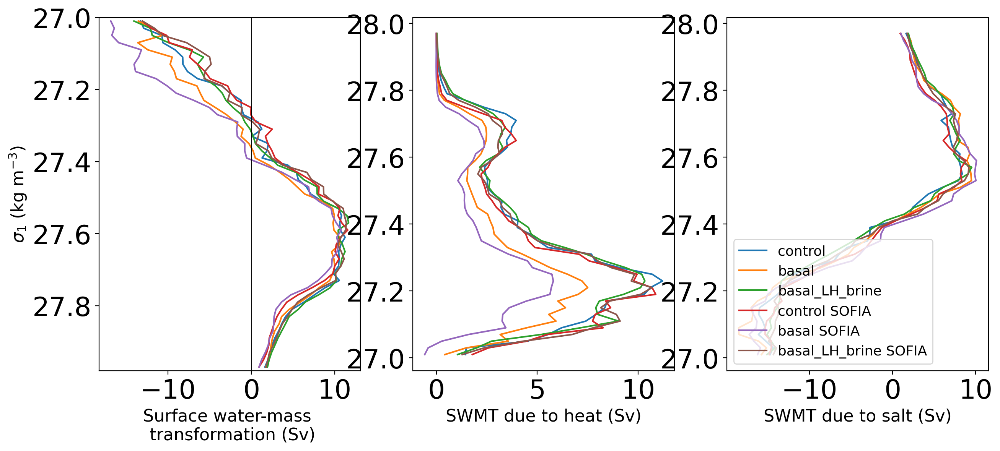

In [50]:
fig, ax  = plt.subplots(nrows=1, ncols=3, figsize = (15,6))

ax[0].plot(swmt_ctrl_sum,isopycnal_bin_mid_ctrl, label='control')
ax[0].plot(swmt_noBG_sum,isopycnal_bin_mid_noBG, label='basal')
ax[0].plot(swmt_BGB_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine')
ax[0].plot(swmt_ctrl_s_sum,isopycnal_bin_mid_ctrl_s, label='control SOFIA')
ax[0].plot(swmt_noBG_s_sum,isopycnal_bin_mid_noBG_s, label='basal SOFIA')
ax[0].plot(swmt_BGB_s_sum,isopycnal_bin_mid_BGB_s, label='basal_LH_brine SOFIA')
# ax[0].plot([0, 0],[31, 33.2], 'k', linewidth=0.5)
# ax[0].set_ylim((33.2, 31))
ax[0].plot([0, 0],[27, 27.98], 'k', linewidth=0.5)
ax[0].set_ylim((27.98, 27))
ax[0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[0].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)

ax[1].plot(heat_ctrl_sum,isopycnal_bin_mid_ctrl, label='control')
ax[1].plot(heat_noBG_sum,isopycnal_bin_mid_noBG, label='basal')
ax[1].plot(heat_BGB_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine')
ax[1].plot(heat_ctrl_s_sum,isopycnal_bin_mid_ctrl_s, label='control SOFIA')
ax[1].plot(heat_noBG_s_sum,isopycnal_bin_mid_noBG_s, label='basal SOFIA')
ax[1].plot(heat_BGB_s_sum,isopycnal_bin_mid_BGB_s, label='basal_LH_brine SOFIA')
ax[0].plot([0, 0],[27, 27.98], 'k', linewidth=0.5)
ax[0].set_ylim((27.98, 27))
ax[1].set_xlabel('SWMT due to heat (Sv)', fontsize=16)

ax[2].plot(salt_ctrl_sum,isopycnal_bin_mid_ctrl, label='control')
ax[2].plot(salt_noBG_sum,isopycnal_bin_mid_noBG, label='basal')
ax[2].plot(salt_BGB_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine')
ax[2].plot(salt_ctrl_s_sum,isopycnal_bin_mid_ctrl_s, label='control SOFIA')
ax[2].plot(salt_noBG_s_sum,isopycnal_bin_mid_noBG_s, label='basal SOFIA')
ax[2].plot(salt_BGB_s_sum,isopycnal_bin_mid_BGB_s, label='basal_LH_brine SOFIA')
ax[0].plot([0, 0],[27, 27.98], 'k', linewidth=0.5)
ax[0].set_ylim((27.98, 27))
ax[2].set_xlabel('SWMT due to salt (Sv)', fontsize=16)
ax[2].legend(loc='lower left', fontsize = 13);



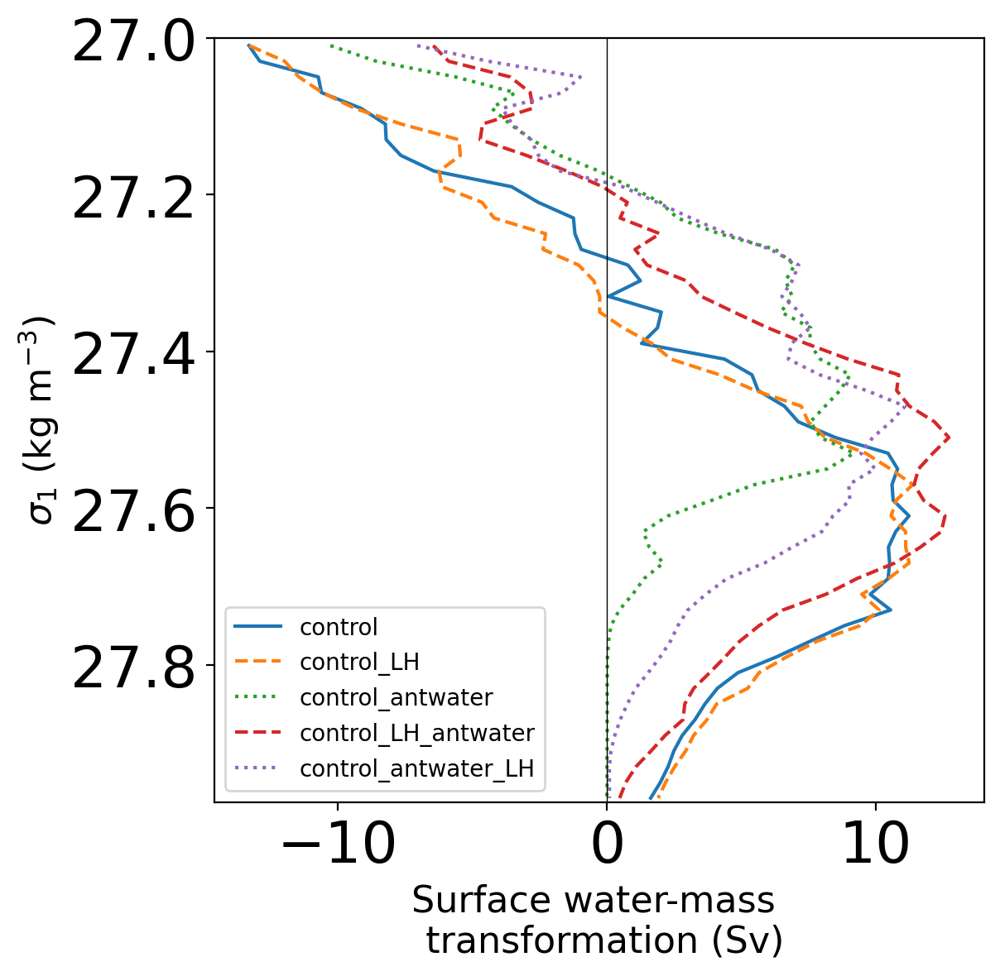

In [51]:
fig, ax  = plt.subplots(nrows=1, ncols=1, figsize = (6,6))

ax.plot(swmt_ctrl_sum,isopycnal_bin_mid_ctrl,'-', label='control')
ax.plot(swmt_ctrlBG_sum,isopycnal_bin_mid_ctrlBG,'--', label='control_LH')
ax.plot(swmt_ctrl_a_sum,isopycnal_bin_mid_ctrl_a,':', label='control_antwater')
ax.plot(swmt_ctrlBG_antwater_sum,isopycnal_bin_mid_ctrlBG_antwater,'--', label='control_LH_antwater')
ax.plot(swmt_ctrl_antwater_BG_sum,isopycnal_bin_mid_ctrl_antwater_BG,':', label='control_antwater_LH')
ax.plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax.set_ylim((27.975, 27))
ax.set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax.set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
plt.legend()

In [52]:
# fig, ax  = plt.subplots(nrows=1, ncols=3, figsize = (15,6))

# ax[0].plot(swmt_ctrl_sum,isopycnal_bin_mid_ctrl, label='control')
# ax[0].plot(swmt_SSStest_sum,isopycnal_bin_mid_SSStest, label='SSS test')
# ax[0].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
# ax[0].set_ylim((27.975, 27))
# ax[0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
# ax[0].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)

# ax[1].plot(heat_ctrl_sum,isopycnal_bin_mid_ctrl, label='control')
# ax[1].plot(heat_SSStest_sum,isopycnal_bin_mid_SSStest, label='SSS test')
# ax[1].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
# ax[1].set_ylim((27.975, 27))
# ax[1].set_xlabel('SWMT due to heat (Sv)', fontsize=16)

# ax[2].plot(salt_ctrl_sum,isopycnal_bin_mid_ctrl, label='control')
# ax[2].plot(salt_SSStest_sum,isopycnal_bin_mid_SSStest, label='SSS test')
# ax[2].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
# ax[2].set_ylim((27.975, 27))
# ax[2].set_xlabel('SWMT due to salt (Sv)', fontsize=16)
# ax[2].legend(loc='lower left', fontsize = 13);



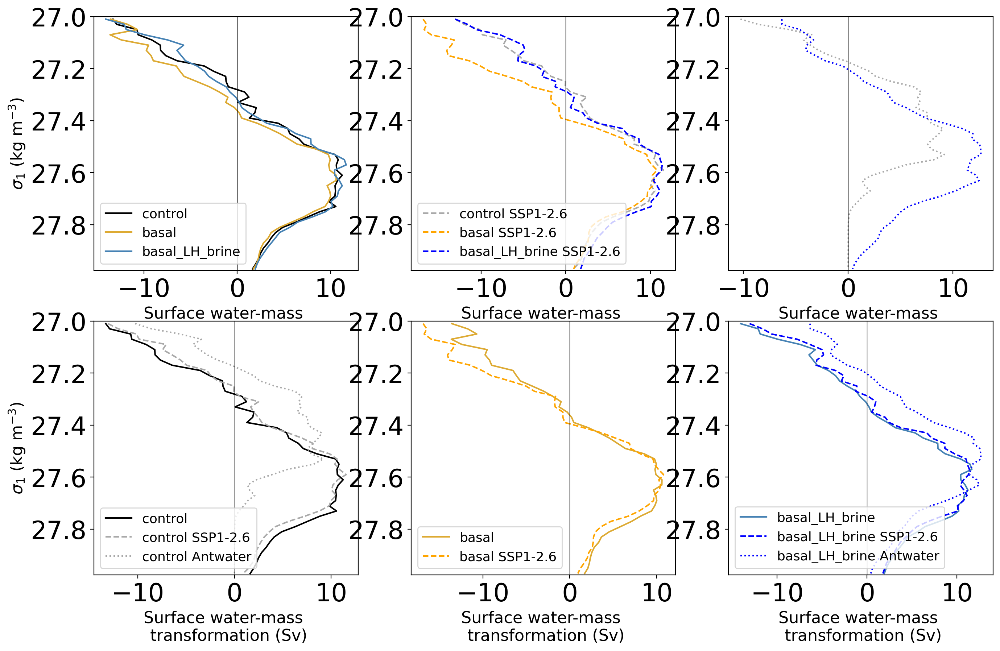

In [53]:
fig, ax  = plt.subplots(nrows=2, ncols=3, figsize = (16,10))

ax[0,0].plot(swmt_ctrl_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[0,0].plot(swmt_noBG_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[0,0].plot(swmt_BGB_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[0,0].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,0].set_ylim((27.975, 27))
ax[0,0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[0,0].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[0,0].legend(loc='lower left', fontsize = 13);

ax[0,1].plot(swmt_ctrl_s_sum,isopycnal_bin_mid_ctrl_s,'--', label='control SSP1-2.6', color='darkgray')
ax[0,1].plot(swmt_noBG_s_sum,isopycnal_bin_mid_noBG_s,'--', label='basal SSP1-2.6', color='orange')
ax[0,1].plot(swmt_BGB_s_sum,isopycnal_bin_mid_BGB_s,'--', label='basal_LH_brine SSP1-2.6', color='blue')
ax[0,1].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,1].set_ylim((27.975, 27))
# ax[0,1].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[0,1].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[0,1].legend(loc='lower left', fontsize = 13);

ax[0,2].plot(swmt_ctrl_a_sum,isopycnal_bin_mid_ctrl_a,':', label='control Antwater', color='darkgray')
ax[0,2].plot(swmt_BGB_a_sum,isopycnal_bin_mid_BGB_a,':', label='basal_LH_brine Antwater', color='blue')
ax[0,2].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,2].set_ylim((27.975, 27))
# ax[0,2].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[0,2].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)


ax[1,0].plot(swmt_ctrl_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[1,0].plot(swmt_ctrl_s_sum,isopycnal_bin_mid_ctrl_s,'--', label='control SSP1-2.6', color='darkgray')
ax[1,0].plot(swmt_ctrl_a_sum,isopycnal_bin_mid_ctrl_a,':', label='control Antwater', color='darkgray')
ax[1,0].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,0].set_ylim((27.975, 27))
ax[1,0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,0].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[1,0].legend(loc='lower left', fontsize = 13);

ax[1,1].plot(swmt_noBG_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[1,1].plot(swmt_noBG_s_sum,isopycnal_bin_mid_noBG_s,'--', label='basal SSP1-2.6', color='orange')
ax[1,1].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,1].set_ylim((27.975, 27))
# ax[1,1].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,1].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[1,1].legend(loc='lower left', fontsize = 13);

ax[1,2].plot(swmt_BGB_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[1,2].plot(swmt_BGB_s_sum,isopycnal_bin_mid_BGB_s,'--', label='basal_LH_brine SSP1-2.6', color='blue')
ax[1,2].plot(swmt_BGB_a_sum,isopycnal_bin_mid_BGB_a,':', label='basal_LH_brine Antwater', color='blue')
ax[1,2].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,2].set_ylim((27.975, 27))
# ax[1,2].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,2].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[1,2].legend(loc='lower left', fontsize = 13);

plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_ctrlxSOFIA.png',bbox_inches='tight',dpi=300)


### Masking + Plotting: On the Shelf

In [36]:
def shelf_mask_isobath(var):
    '''
    Masks ACCESS-OM2-01 variables by the region polewards of the 1000m isobath as computed using 
    a script contributed by Adele Morrison.
    Only to be used with ACCESS-OM2-0.1 output!
    '''
    contour_file = np.load('/g/data/ik11/grids/Antarctic_slope_contour_1000m.npz')
    
    shelf_mask = contour_file['contour_masked_above']
    yt_ocean = contour_file['yt_ocean']
    xt_ocean = contour_file['xt_ocean']
    
    # in this file the points along the isobath are given a positive value, the points outside (northwards) 
    # of the isobath are given a value of -100 and all the points on the continental shelf have a value of 0 
    # so we mask for the 0 values 
    shelf_mask[np.where(shelf_mask!=0)] = np.nan
    shelf_mask = shelf_mask+1
    shelf_map = np.nan_to_num(shelf_mask)
    shelf_mask = xr.DataArray(shelf_mask, coords = [('yt_ocean', yt_ocean), ('xt_ocean', xt_ocean)])
    shelf_map = xr.DataArray(shelf_map, coords = [('yt_ocean', yt_ocean), ('xt_ocean', xt_ocean)])
    
    # then we want to multiply the variable with the mask so we need to account for the shape of the mask. 
    # The mask uses a northern cutoff of 59S.
    masked_var = var.sel(yt_ocean = slice(-90, -59.03)) * shelf_mask
    return masked_var, shelf_map

In [37]:
# ht = cat.search(variable='ht').to_dask(decode_timedelta=Tr)
# ht = ht.sel(yt_ocean = slice(-90, -59))
land_mask = (ht*0).fillna(1)
yt_ocean = ht.yt_ocean.values
xt_ocean = ht.xt_ocean.values
ht_shelf , shelf_mask = shelf_mask_isobath(ht)



In [38]:
swmt_ctrl_shelf, shelf_mask = shelf_mask_isobath(swmt_ctrl)
heat_ctrl_shelf, shelf_mask = shelf_mask_isobath(heat_ctrl)
salt_ctrl_shelf, shelf_mask = shelf_mask_isobath(salt_ctrl)
area_t_shelf, shelf_mask = shelf_mask_isobath(area_t)

swmt_ctrl_shelf_sum = (swmt_ctrl_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_ctrl_shelf_sum = (heat_ctrl_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_ctrl_shelf_sum = (salt_ctrl_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

#### integrated per DSW formation region


In [39]:
isopycnal_bin_mid_ctrl[38]

<xarray.DataArray 'isopycnal_bins' ()> Size: 8B
array(27.77)
Coordinates:
    isopycnal_bins  float64 8B 27.77

7.301915244154657


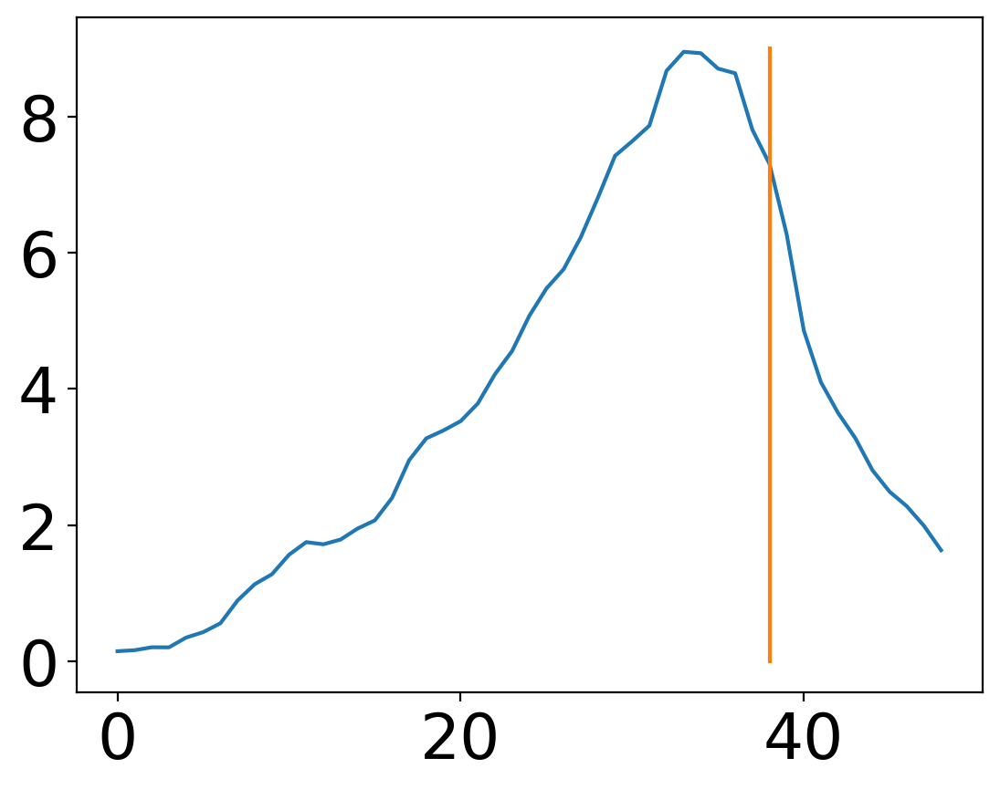

In [40]:
# for sig1:
# index=77 # isopycnal_bin_mid_ctrl = 32.55 (same as map)

# for sig0:
index=38 # isopycnal_bin_mid_ctrl = 27.65 - leveldown for Prydz (same as map)

print(swmt_ctrl_shelf_sum[index])

plt.plot(swmt_ctrl_shelf_sum)
plt.plot(index*np.ones(np.arange(0,10).shape),np.arange(0,10))  

In [41]:
## testing SWMT map:

max_transformation_index_ctrl = np.argmax(swmt_ctrl_shelf_sum)
max_transformation_density = isopycnal_bin_mid_ctrl[max_transformation_index_ctrl]
print('Shelf subduction density:',max_transformation_density.values)

shelf_diff = (swmt_ctrl_shelf.isel(isopycnal_bins = max_transformation_index_ctrl)) #- swmt_Tfreezing_min_shelf.isel(isopycnal_bins = max_transformation_index_Tfreezing_min) )
#shelf_subduction_plot = swmt_ctrl_shelf.isel(isopycnal_bins = max_transformation_index_ctrl)*1e5
shelf_subduction_plot = shelf_diff * 1e6
swmt_xt = shelf_subduction_plot.xt_ocean
swmt_yt = shelf_subduction_plot.yt_ocean

Shelf subduction density: 27.669999999999987


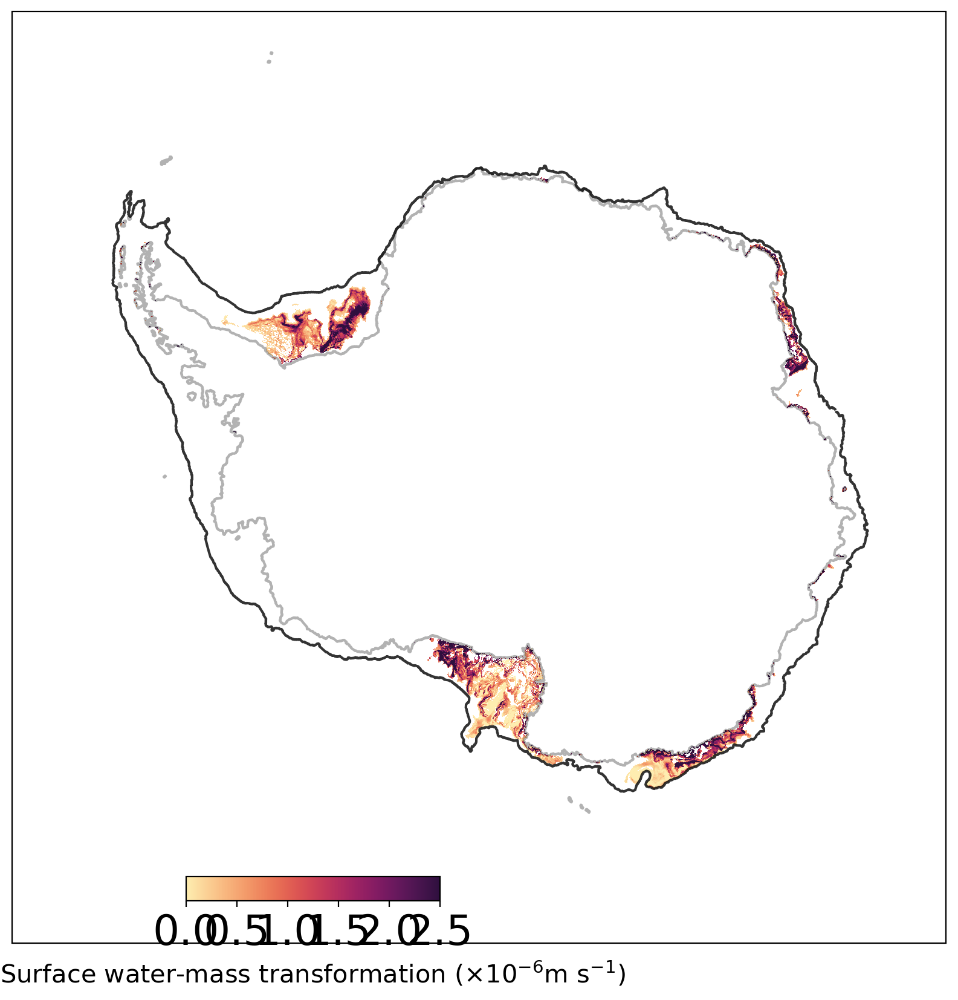

In [42]:
transformation_density = 27.77 ### sig0
shelf_subduction_plot_ctrl_test = swmt_ctrl_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5

fig  = plt.figure(1, figsize = (10, 10))
gs = gridspec.GridSpec(1,1) 
gs.update(wspace = 0.05)

ax = plt.subplot(gs[0], projection=ccrs.SouthPolarStereo())


ax.contour(xt_ocean, yt_ocean,land_mask, [0, 1],
           colors = 'k', alpha = 0.3, transform = ccrs.PlateCarree() )
ax.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],
           colors='k', alpha =0.8, transform = ccrs.PlateCarree())

# norm = col.Normalize(vmin=0, vmax=2.5)

plot_swmt = ax.pcolormesh(swmt_xt, swmt_yt, shelf_subduction_plot_ctrl_test,
                          vmin=0, vmax=2.5, cmap=cmo.matter,transform=ccrs.PlateCarree())

theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
#ax.set_boundary(circle, transform=ax.transAxes)
ax.set_extent([-180, 180, -90, -59], ccrs.PlateCarree())
# ax.outline_patch.set_visible(False)

cax = fig.add_axes([0.27, 0.145, 0.21, 0.02])
cbar=plt.colorbar(plot_swmt, cax=cax, orientation='horizontal', shrink = 0.5, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3])
cbar.set_label(r'Surface water-mass transformation ($\times 10^{-6}$m s$^{-1}$)', fontsize = 15)


#### calculate SWMT over shelf for all expts:

In [43]:
# swmt_SSStest_shelf, shelf_mask = shelf_mask_isobath(swmt_SSStest)
# heat_SSStest_shelf, shelf_mask = shelf_mask_isobath(heat_SSStest)
# salt_SSStest_shelf, shelf_mask = shelf_mask_isobath(salt_SSStest)

# swmt_SSStest_shelf_sum = (swmt_SSStest_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
# heat_SSStest_shelf_sum = (heat_SSStest_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
# salt_SSStest_shelf_sum = (salt_SSStest_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

In [44]:
swmt_noBG_shelf, shelf_mask = shelf_mask_isobath(swmt_noBG)
heat_noBG_shelf, shelf_mask = shelf_mask_isobath(heat_noBG)
salt_noBG_shelf, shelf_mask = shelf_mask_isobath(salt_noBG)

swmt_noBG_shelf_sum = (swmt_noBG_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_noBG_shelf_sum = (heat_noBG_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_noBG_shelf_sum = (salt_noBG_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [45]:
swmt_BGB_shelf, shelf_mask = shelf_mask_isobath(swmt_BGB)
heat_BGB_shelf, shelf_mask = shelf_mask_isobath(heat_BGB)
salt_BGB_shelf, shelf_mask = shelf_mask_isobath(salt_BGB)

swmt_BGB_shelf_sum = (swmt_BGB_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_BGB_shelf_sum = (heat_BGB_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_BGB_shelf_sum = (salt_BGB_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [46]:
swmt_ctrl_s_shelf, shelf_mask = shelf_mask_isobath(swmt_ctrl_s)
heat_ctrl_s_shelf, shelf_mask = shelf_mask_isobath(heat_ctrl_s)
salt_ctrl_s_shelf, shelf_mask = shelf_mask_isobath(salt_ctrl_s)

swmt_ctrl_s_shelf_sum = (swmt_ctrl_s_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_ctrl_s_shelf_sum = (heat_ctrl_s_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_ctrl_s_shelf_sum = (salt_ctrl_s_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [47]:
swmt_ctrl_a_shelf, shelf_mask = shelf_mask_isobath(swmt_ctrl_a)
heat_ctrl_a_shelf, shelf_mask = shelf_mask_isobath(heat_ctrl_a)
salt_ctrl_a_shelf, shelf_mask = shelf_mask_isobath(salt_ctrl_a)

swmt_ctrl_a_shelf_sum = (swmt_ctrl_a_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_ctrl_a_shelf_sum = (heat_ctrl_a_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_ctrl_a_shelf_sum = (salt_ctrl_a_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [48]:
swmt_noBG_s_shelf, shelf_mask = shelf_mask_isobath(swmt_noBG_s)
heat_noBG_s_shelf, shelf_mask = shelf_mask_isobath(heat_noBG_s)
salt_noBG_s_shelf, shelf_mask = shelf_mask_isobath(salt_noBG_s)

swmt_noBG_s_shelf_sum = (swmt_noBG_s_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_noBG_s_shelf_sum = (heat_noBG_s_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_noBG_s_shelf_sum = (salt_noBG_s_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [49]:
swmt_BGB_s_shelf, shelf_mask = shelf_mask_isobath(swmt_BGB_s)
heat_BGB_s_shelf, shelf_mask = shelf_mask_isobath(heat_BGB_s)
salt_BGB_s_shelf, shelf_mask = shelf_mask_isobath(salt_BGB_s)

swmt_BGB_s_shelf_sum = (swmt_BGB_s_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_BGB_s_shelf_sum = (heat_BGB_s_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_BGB_s_shelf_sum = (salt_BGB_s_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [50]:
swmt_BGB_a_shelf, shelf_mask = shelf_mask_isobath(swmt_BGB_a)
heat_BGB_a_shelf, shelf_mask = shelf_mask_isobath(heat_BGB_a)
salt_BGB_a_shelf, shelf_mask = shelf_mask_isobath(salt_BGB_a)

swmt_BGB_a_shelf_sum = (swmt_BGB_a_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_BGB_a_shelf_sum = (heat_BGB_a_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_BGB_a_shelf_sum = (salt_BGB_a_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [51]:
swmt_ctrlBG_shelf, shelf_mask = shelf_mask_isobath(swmt_ctrlBG)
heat_ctrlBG_shelf, shelf_mask = shelf_mask_isobath(heat_ctrlBG)
salt_ctrlBG_shelf, shelf_mask = shelf_mask_isobath(salt_ctrlBG)

swmt_ctrlBG_shelf_sum = (swmt_ctrlBG_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_ctrlBG_shelf_sum = (heat_ctrlBG_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_ctrlBG_shelf_sum = (salt_ctrlBG_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [52]:
swmt_ctrlBG_a_shelf, shelf_mask = shelf_mask_isobath(swmt_ctrlBG_antwater)
heat_ctrlBG_a_shelf, shelf_mask = shelf_mask_isobath(heat_ctrlBG_antwater)
salt_ctrlBG_a_shelf, shelf_mask = shelf_mask_isobath(salt_ctrlBG_antwater)

swmt_ctrlBG_a_shelf_sum = (swmt_ctrlBG_a_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_ctrlBG_a_shelf_sum = (heat_ctrlBG_a_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_ctrlBG_a_shelf_sum = (salt_ctrlBG_a_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [53]:
swmt_ctrl_a_BG_shelf, shelf_mask = shelf_mask_isobath(swmt_ctrl_antwater_BG)
heat_ctrl_a_BG_shelf, shelf_mask = shelf_mask_isobath(heat_ctrl_antwater_BG)
salt_ctrl_a_BG_shelf, shelf_mask = shelf_mask_isobath(salt_ctrl_antwater_BG)

swmt_ctrl_a_BG_shelf_sum = (swmt_ctrl_a_BG_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
heat_ctrl_a_BG_shelf_sum = (heat_ctrl_a_BG_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values
salt_ctrl_a_BG_shelf_sum = (salt_ctrl_a_BG_shelf * area_t_shelf/1e6).sum(['xt_ocean','yt_ocean']).values

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 13.03 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

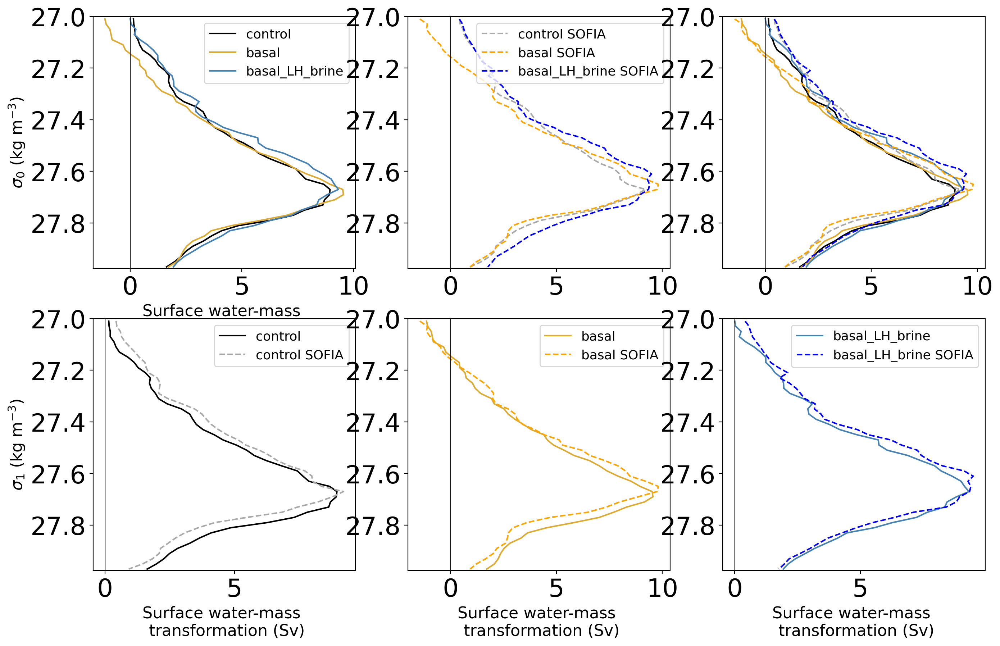

In [54]:
fig, ax  = plt.subplots(nrows=2, ncols=3, figsize = (16,10))

ax[0,0].plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[0,0].plot(swmt_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[0,0].plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[0,0].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,0].set_ylim((27.975, 27))
ax[0,0].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[0,0].set_ylabel(r'$\sigma_{0}$ (kg m$^{-3}$)', fontsize = 16)

# ax[0,0].plot([0, 0],[31, 33.2], 'k', linewidth=0.5)
# ax[0,0].set_ylim((33.2, 31))
# ax[0,0].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[0,0].legend(loc='upper right', fontsize = 13);

ax[0,1].plot(swmt_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,'--', label='control SOFIA', color='darkgray')
ax[0,1].plot(swmt_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,'--', label='basal SOFIA', color='orange')
ax[0,1].plot(swmt_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,'--', label='basal_LH_brine SOFIA', color='blue')
ax[0,1].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,1].set_ylim((27.975, 27))
# ax[0,1].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
# ax[0,1].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[0,1].legend(loc='upper right', fontsize = 13);

ax[0,2].plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[0,2].plot(swmt_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[0,2].plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[0,2].plot(swmt_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,'--', label='control SOFIA', color='darkgray')
ax[0,2].plot(swmt_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,'--', label='basal SOFIA', color='orange')
ax[0,2].plot(swmt_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,'--', label='basal_LH_brine SOFIA', color='blue')
ax[0,2].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,2].set_ylim((27.975, 27))
# ax[0,2].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
# ax[0,2].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
# ax[0,2].legend(loc='upper right', fontsize = 13);

ax[1,0].plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[1,0].plot(swmt_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,'--', label='control SOFIA', color='darkgray')
ax[1,0].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,0].set_ylim((27.975, 27))
ax[1,0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,0].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[1,0].legend(loc='upper right', fontsize = 13);

ax[1,1].plot(swmt_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[1,1].plot(swmt_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,'--', label='basal SOFIA', color='orange')
ax[1,1].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,1].set_ylim((27.975, 27))
# ax[1,1].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,1].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[1,1].legend(loc='upper right', fontsize = 13);

ax[1,2].plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[1,2].plot(swmt_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,'--', label='basal_LH_brine SOFIA', color='blue')
ax[1,2].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,2].set_ylim((27.975, 27))
# ax[1,2].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,2].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[1,2].legend(loc='upper right', fontsize = 13);

### Save fig
# plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_ctrlxSOFIA.png',bbox_inches='tight',dpi=300)
plt.savefig(figdir+'SWMT_sig0_annual_shelf_yr17-20_ctrlxSOFIA.png',bbox_inches='tight',dpi=300)


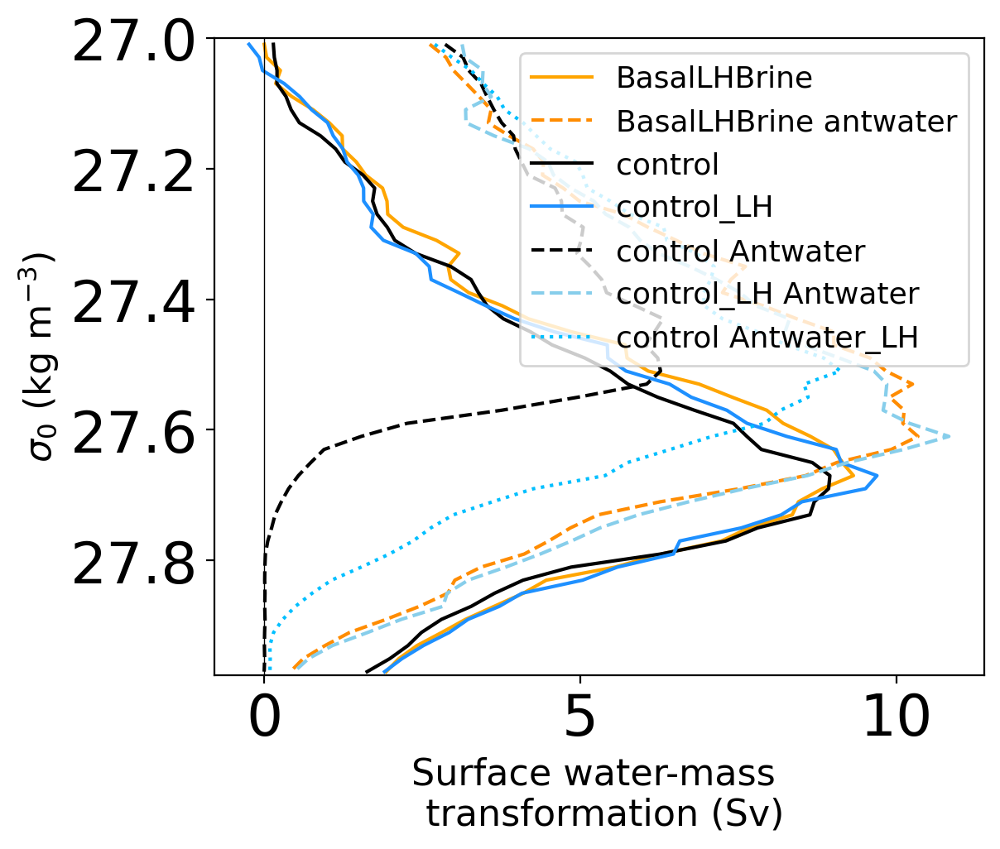

In [55]:
fig, ax  = plt.subplots(nrows=1, ncols=1, figsize = (6,5))

ax.plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='BasalLHBrine', color='orange')
ax.plot(swmt_BGB_a_shelf_sum,isopycnal_bin_mid_BGB_a,'--', label='BasalLHBrine antwater', color='darkorange')

ax.plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax.plot(swmt_ctrlBG_shelf_sum,isopycnal_bin_mid_ctrlBG, label='control_LH', color='dodgerblue')
ax.plot(swmt_ctrl_a_shelf_sum,isopycnal_bin_mid_ctrl_a,'--', label='control Antwater', color='k')
ax.plot(swmt_ctrlBG_a_shelf_sum,isopycnal_bin_mid_ctrlBG_antwater,'--', label='control_LH Antwater', color='skyblue')
ax.plot(swmt_ctrl_a_BG_shelf_sum,isopycnal_bin_mid_ctrl_antwater_BG,':', label='control Antwater_LH', color='deepskyblue')

# ax.plot([0, 0],[31, 33.2], 'k', linewidth=0.5)
# ax.set_ylim((33.2, 31))
ax.plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax.set_ylim((27.975, 27))
ax.set_ylabel(r'$\sigma_{0}$ (kg m$^{-3}$)', fontsize = 16)
ax.set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax.legend(loc='upper right', fontsize = 13);


# plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_ctrlxAntwater_LH.png',bbox_inches='tight',dpi=300)
plt.savefig(figdir+'SWMT_sig0_annual_shelf_yr17-20_ctrlxAntwater_LH.png',bbox_inches='tight',dpi=300)


In [56]:
print(figdir+'SWMT_annual_shelf_yr17-20_ctrlxSOFIA.png')

/g/data/e14/fbd581/basal_mom5-collaborative-project/figures/SWMT_annual_shelf_yr17-20_ctrlxSOFIA.png


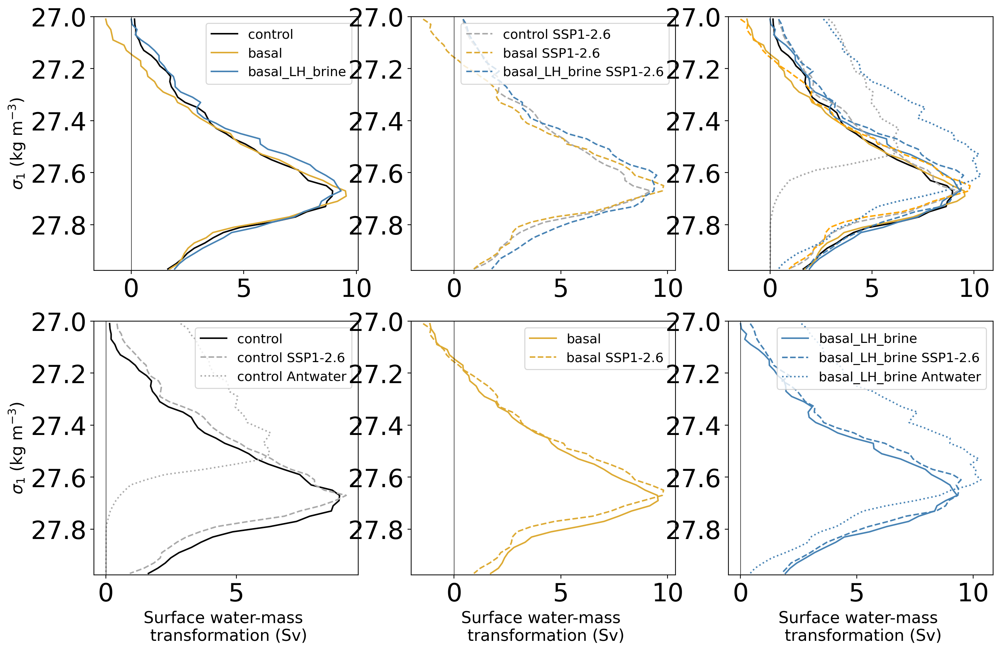

In [57]:
fig, ax  = plt.subplots(nrows=2, ncols=3, figsize = (16,10))

ax[0,0].plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[0,0].plot(swmt_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[0,0].plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[0,0].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,0].set_ylim((27.975, 27))
ax[0,0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
# ax[0,0].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[0,0].legend(loc='upper right', fontsize = 13);

ax[0,1].plot(swmt_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,'--', label='control SSP1-2.6', color='darkgray')
ax[0,1].plot(swmt_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,'--', label='basal SSP1-2.6', color='#DDAA33')
ax[0,1].plot(swmt_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,'--', label='basal_LH_brine SSP1-2.6', color='steelblue')
ax[0,2].plot(swmt_ctrl_a_shelf_sum,isopycnal_bin_mid_ctrl_a,':', label='control Antwater', color='darkgray')
ax[0,2].plot(swmt_BGB_a_shelf_sum,isopycnal_bin_mid_BGB_a,':', label='basal_LH_brine Antwater', color='steelblue')
ax[0,1].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,1].set_ylim((27.975, 27))
# ax[0,1].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
# ax[0,1].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[0,1].legend(loc='upper right', fontsize = 13);

ax[0,2].plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[0,2].plot(swmt_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[0,2].plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[0,2].plot(swmt_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,'--', label='control SSP1-2.6', color='darkgray')
ax[0,2].plot(swmt_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,'--', label='basal SSP1-2.6', color='orange')
ax[0,2].plot(swmt_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,'--', label='basal_LH_brine SSP1-2.6', color='steelblue')
ax[0,2].plot(swmt_ctrl_a_shelf_sum,isopycnal_bin_mid_ctrl_a,':', label='control Antwater', color='darkgray')
ax[0,2].plot(swmt_BGB_a_shelf_sum,isopycnal_bin_mid_BGB_a,':', label='basal_LH_brine Antwater', color='steelblue')
ax[0,2].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,2].set_ylim((27.975, 27))
# ax[0,2].legend(loc='upper right', fontsize = 13)

ax[1,0].plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[1,0].plot(swmt_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,'--', label='control SSP1-2.6', color='darkgray')
ax[1,0].plot(swmt_ctrl_a_shelf_sum,isopycnal_bin_mid_ctrl_a,':', label='control Antwater', color='darkgray')
ax[1,0].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,0].set_ylim((27.975, 27))
ax[1,0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,0].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[1,0].legend(loc='upper right', fontsize = 13);

ax[1,1].plot(swmt_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[1,1].plot(swmt_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,'--', label='basal SSP1-2.6', color='#DDAA33')
ax[1,1].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,1].set_ylim((27.975, 27))
# ax[1,1].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,1].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[1,1].legend(loc='upper right', fontsize = 13);

ax[1,2].plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[1,2].plot(swmt_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,'--', label='basal_LH_brine SSP1-2.6', color='steelblue')
ax[1,2].plot(swmt_BGB_a_shelf_sum,isopycnal_bin_mid_BGB_a,':', label='basal_LH_brine Antwater', color='steelblue')
ax[1,2].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,2].set_ylim((27.975, 27))
# ax[1,2].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,2].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax[1,2].legend(loc='upper right', fontsize = 13);

### Save fig
plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_ctrlxSOFIA.png',bbox_inches='tight',dpi=300)


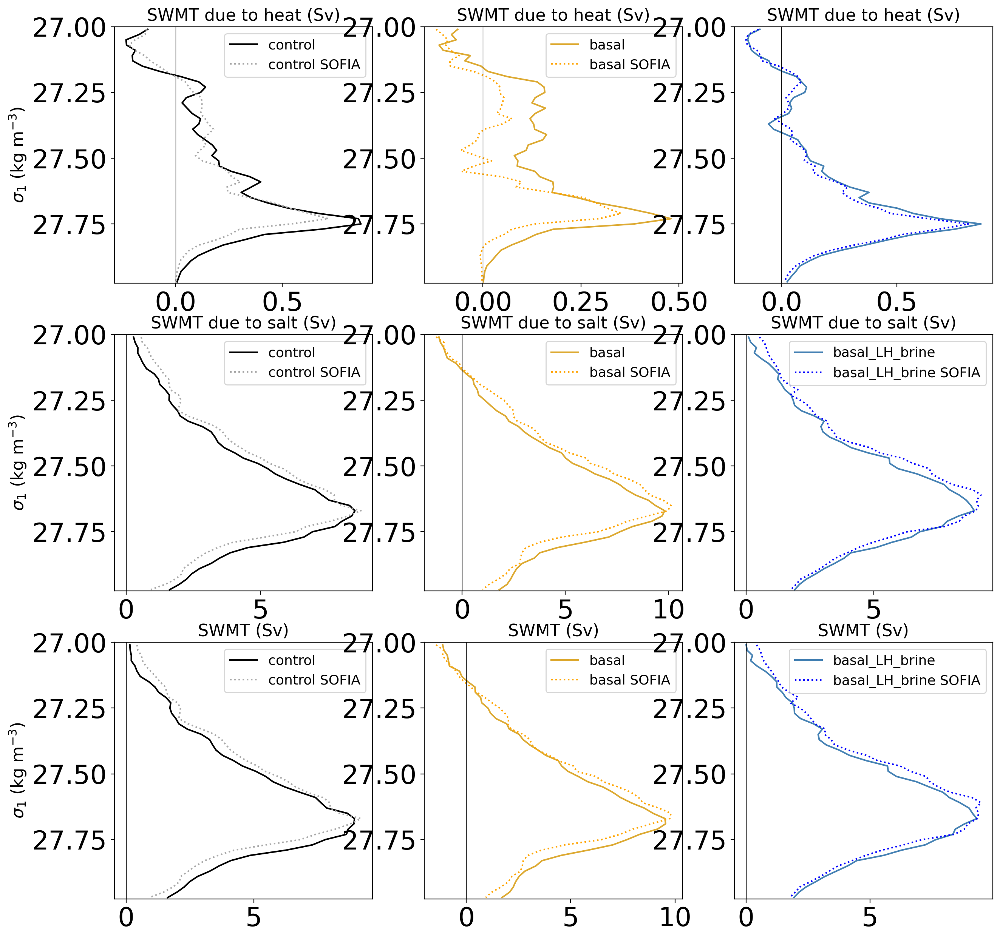

In [76]:
fig, ax  = plt.subplots(nrows=3, ncols=3, figsize = (15,15))

## SWMT
ax[2,0].plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[2,0].plot(swmt_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,':', label='control SOFIA', color='darkgray')
ax[2,0].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[2,0].set_ylim((27.975, 27))
ax[2,0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[2,0].set_title('SWMT (Sv)', fontsize=16)
ax[2,0].legend(loc='upper right', fontsize = 13)

ax[2,1].plot(swmt_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[2,1].plot(swmt_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,':', label='basal SOFIA', color='orange')
ax[2,1].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[2,1].set_ylim((27.975, 27))
# ax[0,1].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[2,1].set_title('SWMT (Sv)', fontsize=16)
ax[2,1].legend(loc='upper right', fontsize = 13)

ax[2,2].plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[2,2].plot(swmt_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,':', label='basal_LH_brine SOFIA', color='blue')
ax[2,2].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[2,2].set_ylim((27.975, 27))
# ax[0,2].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[2,2].set_title('SWMT (Sv)', fontsize=16)
ax[2,2].legend(loc='upper right', fontsize = 13)

# heat:
ax[0,0].plot(heat_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[0,0].plot(heat_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,':', label='control SOFIA', color='darkgray')
ax[0,0].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,0].set_ylim((27.975, 27))
ax[0,0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[0,0].set_title('SWMT due to heat (Sv)', fontsize=16)
ax[0,0].legend(loc='upper right', fontsize = 13);

ax[0,1].plot(heat_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[0,1].plot(heat_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,':', label='basal SOFIA', color='orange')
ax[0,1].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,1].set_ylim((27.975, 27))
# ax[1,1].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[0,1].set_title('SWMT due to heat (Sv)', fontsize=16)
ax[0,1].legend(loc='upper right', fontsize = 13);

ax[0,2].plot(heat_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[0,2].plot(heat_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,':', label='basal_LH_brine SOFIA', color='blue')
ax[0,2].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[0,2].set_ylim((27.975, 27))
# ax[0,2].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[0,2].set_title('SWMT due to heat (Sv)', fontsize=16)


ax[1,0].plot(salt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k')
ax[1,0].plot(salt_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,':', label='control SOFIA', color='darkgray')
ax[1,0].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,0].set_ylim((27.975, 27))
ax[1,0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,0].set_title('SWMT due to salt (Sv)', fontsize=16)
ax[1,0].legend(loc='upper right', fontsize = 13);

ax[1,1].plot(salt_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax[1,1].plot(salt_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,':', label='basal SOFIA', color='orange')
ax[1,1].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,1].set_ylim((27.975, 27))
# ax[1,1].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,1].set_title('SWMT due to salt (Sv)', fontsize=16)
ax[1,1].legend(loc='upper right', fontsize = 13);

ax[1,2].plot(salt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax[1,2].plot(salt_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,':', label='basal_LH_brine SOFIA', color='blue')
ax[1,2].plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax[1,2].set_ylim((27.975, 27))
# ax[1,2].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
ax[1,2].set_title('SWMT due to salt (Sv)', fontsize=16)
ax[1,2].legend(loc='upper right', fontsize = 13);

plt.savefig(figdir+'SWMT-heat-salt_annual_shelf_yr17-20_ctrlxSOFIA.png',bbox_inches='tight',dpi=300)

In [77]:
# ### plot for SSS restoring test:
# fig, ax  = plt.subplots(nrows=1, ncols=3, figsize = (15,6))

# ax[0].plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control')
# ax[0].plot(swmt_SSStest_shelf_sum,isopycnal_bin_mid_SSStest, label='SSS test')
# ax[0].plot([0, 0],[31, 33.2], 'k', linewidth=0.5)
# ax[0].set_ylim((33.2, 31))
# ax[0].set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
# ax[0].set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)

# ax[1].plot(heat_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control')
# ax[1].plot(heat_SSStest_shelf_sum,isopycnal_bin_mid_SSStest, label='SSS test')
# ax[1].plot([0, 0],[31, 33.2], 'k', linewidth=0.5)
# ax[1].set_ylim((33.2, 31))
# ax[1].set_xlabel('SWMT due to heat (Sv)', fontsize=16)

# ax[2].plot(salt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control')
# ax[2].plot(salt_SSStest_shelf_sum,isopycnal_bin_mid_SSStest, label='SSS test')
# ax[2].plot([0, 0],[31, 33.2], 'k', linewidth=0.5)
# ax[2].set_ylim((33.2, 31))
# ax[2].set_xlabel('SWMT due to salt (Sv)', fontsize=16)
# ax[2].legend(loc='lower left', fontsize = 13);





#### SWMT maps:

In [55]:
max_transformation_index_ctrl = np.argmax(swmt_ctrl_shelf_sum)
max_transformation_density = isopycnal_bin_mid_ctrl[max_transformation_index_ctrl]
print('Shelf subduction density:',max_transformation_density.values)

shelf_diff = (swmt_ctrl_shelf.isel(isopycnal_bins = max_transformation_index_ctrl)) #- swmt_Tfreezing_min_shelf.isel(isopycnal_bins = max_transformation_index_Tfreezing_min) )
#shelf_subduction_plot = swmt_ctrl_shelf.isel(isopycnal_bins = max_transformation_index_ctrl)*1e5
shelf_subduction_plot = shelf_diff * 1e6
swmt_xt = shelf_subduction_plot.xt_ocean
swmt_yt = shelf_subduction_plot.yt_ocean

Shelf subduction density: 27.669999999999987


In [56]:
# transformation_density = 32.55 ### sig1
transformation_density = 27.77 ### sig0


shelf_subduction_plot_ctrl_2777 = swmt_ctrl_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5
shelf_subduction_plot_ctrl_s_2777 = swmt_ctrl_s_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5
shelf_subduction_plot_ctrl_a_2777 = swmt_ctrl_a_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5

shelf_subduction_plot_noBG_2777 = swmt_noBG_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5
shelf_subduction_plot_noBG_s_2777 = swmt_noBG_s_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5

shelf_subduction_plot_BGB_2777 = swmt_BGB_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5
shelf_subduction_plot_BGB_s_2777 = swmt_BGB_s_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5
shelf_subduction_plot_BGB_a_2777 = swmt_BGB_a_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5

# shelf_subduction_plot_SSStest_2777 = swmt_SSStest_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5

shelf_subduction_plot_ctrlBG_2777 = swmt_ctrlBG_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5
shelf_subduction_plot_ctrlBG_a_2777 = swmt_ctrlBG_a_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5
shelf_subduction_plot_ctrl_a_BG_2777 = swmt_ctrl_a_BG_shelf.sel(isopycnal_bins = transformation_density, method = 'nearest') * 1e5


In [57]:
# Calculate maps of SWMT summing density classes from 32.55 
# transformation_density = slice(32.55,33.47)
transformation_density = slice(27.77,27.975)

shelf_subduction_plot_ctrl_2777Sum = swmt_ctrl_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5
shelf_subduction_plot_ctrl_s_2777Sum = swmt_ctrl_s_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5
shelf_subduction_plot_ctrl_a_2777Sum = swmt_ctrl_a_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5

shelf_subduction_plot_noBG_2777Sum = swmt_noBG_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5
shelf_subduction_plot_noBG_s_2777Sum = swmt_noBG_s_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5

shelf_subduction_plot_BGB_2777Sum = swmt_BGB_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5
shelf_subduction_plot_BGB_s_2777Sum = swmt_BGB_s_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5
shelf_subduction_plot_BGB_a_2777Sum = swmt_BGB_a_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5

# shelf_subduction_plot_SSStest_2777Sum = swmt_SSStest_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5

shelf_subduction_plot_ctrlBG_2777Sum = swmt_ctrlBG_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5
shelf_subduction_plot_ctrlBG_a_2777Sum = swmt_ctrlBG_a_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5
shelf_subduction_plot_ctrl_a_BG_2777Sum = swmt_ctrl_a_BG_shelf.sel(isopycnal_bins = transformation_density).sum('isopycnal_bins') * 1e5


In [58]:
## Average, at each gridcell, the SWMT for all density classes >= 32.50

def get_mean_SWMT(swmt):

    # 1. Select density classes >= 32.55
    # subset = swmt.sel(isopycnal_bins=swmt.isopycnal_bins >= 32.55)
    subset = swmt.sel(isopycnal_bins=swmt.isopycnal_bins >= 27.77)
    # 2. Compute the mean across the isopycnal_bins dimension
    mean_wmt = subset.mean(dim='isopycnal_bins', skipna=True)

    return mean_wmt*1e5



In [59]:
swmt_avg_ctrl_shelf =get_mean_SWMT(swmt_ctrl_shelf)
swmt_avg_ctrl_s_shelf =get_mean_SWMT(swmt_ctrl_s_shelf)
swmt_avg_ctrl_a_shelf = get_mean_SWMT(swmt_ctrl_a_shelf)
swmt_avg_noBG_shelf =get_mean_SWMT(swmt_noBG_shelf)
swmt_avg_noBG_s_shelf =get_mean_SWMT(swmt_noBG_s_shelf)
swmt_avg_BGB_shelf =get_mean_SWMT(swmt_BGB_shelf)
swmt_avg_BGB_s_shelf =get_mean_SWMT(swmt_BGB_s_shelf)
swmt_avg_BGB_a_shelf =get_mean_SWMT(swmt_BGB_a_shelf)

swmt_avg_ctrlBG_shelf =get_mean_SWMT(swmt_ctrlBG_shelf)
swmt_avg_ctrlBG_a_shelf =get_mean_SWMT(swmt_ctrlBG_a_shelf)
swmt_avg_ctrl_a_BG_shelf =get_mean_SWMT(swmt_ctrl_a_BG_shelf)


In [60]:
# to compute anomalies, use the SWMTmask from the RYF scenario, so we can show also the reduction where the SOFIA runs have zero transformation

# CONTROL:

# Assume contrl and SOFIA are xarray.DataArray objects with dims ('yt_ocean', 'xt_ocean')
# Create a copy of ctrl's mask
mask_ctrl = swmt_avg_ctrl_shelf.isnull()  # or use ctrl.notnull() depending on your data
# Initialize anomaly with -ctrl (default case where sofia is masked)
swmt_anom_ctrl_s = -swmt_avg_ctrl_shelf.copy()
# Where perturbation is not null, compute perturbation - ctrl
swmt_anom_ctrl_s = swmt_anom_ctrl_s.where(swmt_avg_ctrl_s_shelf.isnull(), swmt_avg_ctrl_s_shelf - swmt_avg_ctrl_shelf)
# Keep ctrl's mask (so anomaly is masked where ctrl is masked)
swmt_anom_ctrl_s = swmt_anom_ctrl_s.where(~mask_ctrl)
# Optional: add attributes
swmt_anom_ctrl_s.attrs['description'] = 'SWMT anomaly (SOFIA-CONTROL where SOFIA exists, else -CONTROL)'

# repeat for antwater:
swmt_anom_ctrl_a = -swmt_avg_ctrl_shelf.copy()
swmt_anom_ctrl_a = swmt_anom_ctrl_a.where(swmt_avg_ctrl_a_shelf.isnull(), swmt_avg_ctrl_a_shelf - swmt_avg_ctrl_shelf)
swmt_anom_ctrl_a = swmt_anom_ctrl_a.where(~mask_ctrl)# Optional: add attributes
swmt_anom_ctrl_a.attrs['description'] = 'SWMT anomaly (SOFIA-CONTROL where SOFIA exists, else -CONTROL)'


In [61]:
# repeat for ctrlBG:
swmt_anom_ctrlBG = -swmt_avg_ctrl_shelf.copy()
swmt_anom_ctrlBG = swmt_anom_ctrlBG.where(swmt_avg_ctrlBG_shelf.isnull(), swmt_avg_ctrlBG_shelf - swmt_avg_ctrl_shelf)
swmt_anom_ctrlBG = swmt_anom_ctrlBG.where(~mask_ctrl)# Optional: add attributes
swmt_anom_ctrlBG.attrs['description'] = 'SWMT anomaly (SOFIA-CONTROL where SOFIA exists, else -CONTROL)'


In [62]:
# repeat for ctrlBG_antwater:
swmt_anom_ctrlBG_a = -swmt_avg_ctrl_shelf.copy()
swmt_anom_ctrlBG_a = swmt_anom_ctrlBG_a.where(swmt_avg_ctrlBG_a_shelf.isnull(), swmt_avg_ctrlBG_a_shelf - swmt_avg_ctrl_shelf)
swmt_anom_ctrlBG_a = swmt_anom_ctrlBG_a.where(~mask_ctrl)# Optional: add attributes
swmt_anom_ctrlBG_a.attrs['description'] = 'SWMT anomaly (SOFIA-CONTROL where SOFIA exists, else -CONTROL)'


In [63]:
# repeat for ctrl_antwater_BG:
swmt_anom_ctrl_a_BG = -swmt_avg_ctrl_shelf.copy()
swmt_anom_ctrl_a_BG = swmt_anom_ctrl_a_BG.where(swmt_avg_ctrl_a_BG_shelf.isnull(), swmt_avg_ctrl_a_BG_shelf - swmt_avg_ctrl_shelf)
swmt_anom_ctrl_a_BG = swmt_anom_ctrl_a_BG.where(~mask_ctrl)# Optional: add attributes
swmt_anom_ctrl_a_BG.attrs['description'] = 'SWMT anomaly (SOFIA-CONTROL where SOFIA exists, else -CONTROL)'


In [64]:
# BasalNoGade:

# Assume contrl and SOFIA are xarray.DataArray objects with dims ('yt_ocean', 'xt_ocean')
# Create a copy of ctrl's mask
mask_ctrl = swmt_avg_noBG_shelf.isnull()  # or use ctrl.notnull() depending on your data
# Initialize anomaly with -ctrl (default case where sofia is masked)
swmt_anom_noBG_s = -swmt_avg_noBG_shelf.copy()
# Where perturbation is not null, compute perturbation - ctrl
swmt_anom_noBG_s = swmt_anom_noBG_s.where(swmt_avg_noBG_s_shelf.isnull(), swmt_avg_noBG_s_shelf - swmt_avg_noBG_shelf)
# Keep ctrl's mask (so anomaly is masked where ctrl is masked)
swmt_anom_noBG_s = swmt_anom_noBG_s.where(~mask_ctrl)
# Optional: add attributes
swmt_anom_noBG_s.attrs['description'] = 'SWMT anomaly (SOFIA-CONTROL where SOFIA exists, else -CONTROL)'


In [65]:
# BasalGadeBrine:

# Assume contrl and SOFIA are xarray.DataArray objects with dims ('yt_ocean', 'xt_ocean')
# Create a copy of ctrl's mask
mask_ctrl = swmt_avg_BGB_shelf.isnull()  # or use ctrl.notnull() depending on your data
# Initialize anomaly with -ctrl (default case where sofia is masked)
swmt_anom_BGB_s = -swmt_avg_BGB_shelf.copy()
# Where perturbation is not null, compute perturbation - ctrl
swmt_anom_BGB_s = swmt_anom_BGB_s.where(swmt_avg_BGB_s_shelf.isnull(), swmt_avg_BGB_s_shelf - swmt_avg_BGB_shelf)
# Keep ctrl's mask (so anomaly is masked where ctrl is masked)
swmt_anom_BGB_s = swmt_anom_BGB_s.where(~mask_ctrl)
# Optional: add attributes
swmt_anom_BGB_s.attrs['description'] = 'SWMT anomaly (SOFIA-CONTROL where SOFIA exists, else -CONTROL)'

# repeat for antwater:
swmt_anom_BGB_a = -swmt_avg_BGB_shelf.copy()
swmt_anom_BGB_a = swmt_anom_BGB_a.where(swmt_avg_BGB_a_shelf.isnull(), swmt_avg_BGB_a_shelf - swmt_avg_BGB_shelf)
swmt_anom_BGB_a = swmt_anom_BGB_a.where(~mask_ctrl)# Optional: add attributes
swmt_anom_BGB_a.attrs['description'] = 'SWMT anomaly (SOFIA-CONTROL where SOFIA exists, else -CONTROL)'


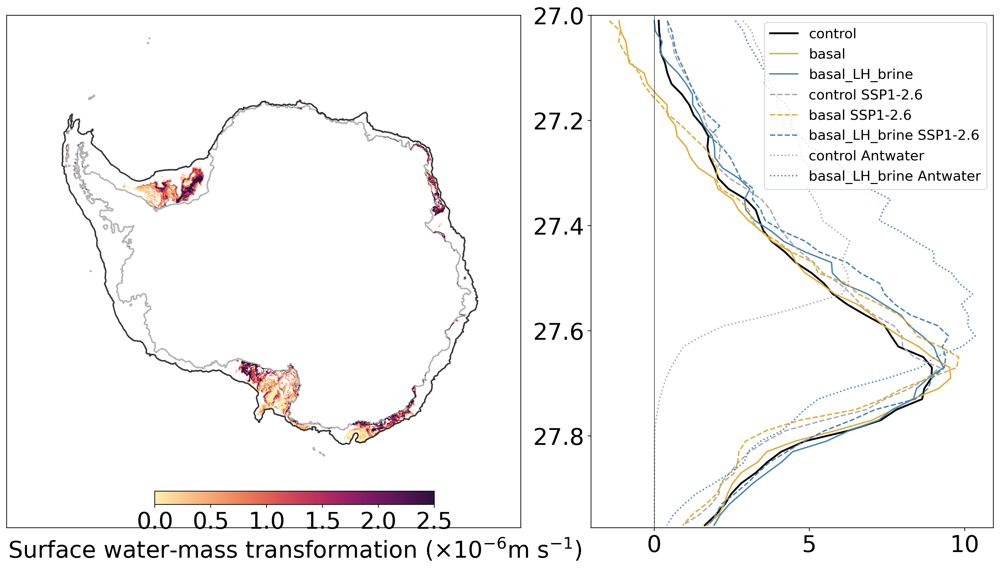

In [69]:
fig  = plt.figure(1, figsize = (20, 10))
gs = gridspec.GridSpec(1,2, width_ratios = [3, 2]) 
gs.update(wspace = 0.05)

ax, ax1 = plt.subplot(gs[0], projection=ccrs.SouthPolarStereo()), plt.subplot(gs[1])

ax.contour(xt_ocean, yt_ocean,land_mask, [0, 1],
           colors = 'k', alpha = 0.3, transform = ccrs.PlateCarree() )
ax.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],
           colors='k', alpha =0.8, transform = ccrs.PlateCarree())

# norm = col.Normalize(vmin=0, vmax=2.5)

# plot_swmt = ax.pcolormesh(swmt_xt, swmt_yt, shelf_subduction_plot,
plot_swmt = ax.pcolormesh(swmt_xt, swmt_yt, shelf_subduction_plot_ctrl_2777,
                          vmin=0, vmax=2.5, cmap=cmo.matter,transform=ccrs.PlateCarree())

theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
#ax.set_boundary(circle, transform=ax.transAxes)
ax.set_extent([-180, 180, -90, -59], ccrs.PlateCarree())
# ax.outline_patch.set_visible(False)

cax = fig.add_axes([0.27, 0.145, 0.21, 0.02])
cbar=plt.colorbar(plot_swmt, cax=cax, orientation='horizontal', shrink = 0.5, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3])
cbar.set_label(r'Surface water-mass transformation ($\times 10^{-6}$m s$^{-1}$)', fontsize = 25)

# ax, ax2 = plt.subplot(gs[1])

ax1.plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k',linewidth=2)
ax1.plot(swmt_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
ax1.plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue')
ax1.plot(swmt_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,'--', label='control SSP1-2.6', color='darkgray')
ax1.plot(swmt_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,'--', label='basal SSP1-2.6', color='#DDAA33')
ax1.plot(swmt_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,'--', label='basal_LH_brine SSP1-2.6', color='steelblue')
ax1.plot(swmt_ctrl_a_shelf_sum,isopycnal_bin_mid_ctrl_a,':', label='control Antwater', color='darkgray')
ax1.plot(swmt_BGB_a_shelf_sum,isopycnal_bin_mid_BGB_a,':', label='basal_LH_brine Antwater', color='steelblue')
ax1.plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax1.set_ylim((27.975, 27))
# ax2.set_ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
# ax2.set_xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
ax1.legend(loc='upper right', fontsize = 15);

### Save fig
# plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_allexpts+Map-ctrl.png',bbox_inches='tight',dpi=300)
plt.savefig(figdir+'SWMT_sig0_annual_shelf_yr17-20_allexpts+Map-ctrl.png',bbox_inches='tight',dpi=300)


In [70]:

# fig = plt.figure(1, figsize=(20, 10)) 
# gs = gridspec.GridSpec(1, 2, width_ratios=[2, 2])  # 2 columns now
# gs.update(wspace=0.05)

# ax1 = plt.subplot(gs[0], projection=ccrs.SouthPolarStereo())  # First map

# ax1.contour(xt_ocean, yt_ocean,land_mask, [0, 1],
#            colors = 'k', alpha = 0.3, transform = ccrs.PlateCarree() )
# ax1.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],
#            colors='k', alpha =0.8, transform = ccrs.PlateCarree())

# # norm = col.Normalize(vmin=0, vmax=2.5)

# plot_swmt = ax1.pcolormesh(swmt_xt, swmt_yt, shelf_subduction_plot_ctrl_2777,
#                           vmin=0, vmax=2.5, cmap=cmo.matter,transform=ccrs.PlateCarree())

# theta = np.linspace(0, 2*np.pi, 100)
# center, radius = [0.5, 0.5], 0.5
# verts = np.vstack([np.sin(theta), np.cos(theta)]).T
# circle = mpath.Path(verts * radius + center)
# #ax.set_boundary(circle, transform=ax.transAxes)
# ax1.set_extent([-180, 180, -90, -59], ccrs.PlateCarree())
# # ax.outline_patch.set_visible(False)

# cax = fig.add_axes([0.17, 0.155, 0.21, 0.02])
# cbar=plt.colorbar(plot_swmt, cax=cax, orientation='horizontal', shrink = 0.5, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3])
# cbar.set_label(r'Surface water-mass transformation ($\times 10^{-6}$m s$^{-1}$)', fontsize = 22)

# ax2 = plt.subplot(gs[1], projection=ccrs.SouthPolarStereo())

# ax2.contour(xt_ocean, yt_ocean,land_mask, [0, 1],
#            colors = 'k', alpha = 0.3, transform = ccrs.PlateCarree() )
# ax2.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],
#            colors='k', alpha =0.8, transform = ccrs.PlateCarree())

# # norm = col.Normalize(vmin=0, vmax=2.5)

# plot_swmt = ax2.pcolormesh(swmt_xt, swmt_yt, shelf_subduction_plot_SSStest_2777,
#                           vmin=0, vmax=2.5, cmap=cmo.matter,transform=ccrs.PlateCarree())

# theta = np.linspace(0, 2*np.pi, 100)
# center, radius = [0.5, 0.5], 0.5
# verts = np.vstack([np.sin(theta), np.cos(theta)]).T
# circle = mpath.Path(verts * radius + center)
# #ax.set_boundary(circle, transform=ax.transAxes)
# ax2.set_extent([-180, 180, -90, -59], ccrs.PlateCarree())
# # ax.outline_patch.set_visible(False)

# cax = fig.add_axes([0.57, 0.155, 0.21, 0.02])
# cbar=plt.colorbar(plot_swmt, cax=cax, orientation='horizontal', shrink = 0.5, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3])
# cbar.set_label(r'Surface water-mass transformation ($\times 10^{-6}$m s$^{-1}$)', fontsize = 22)



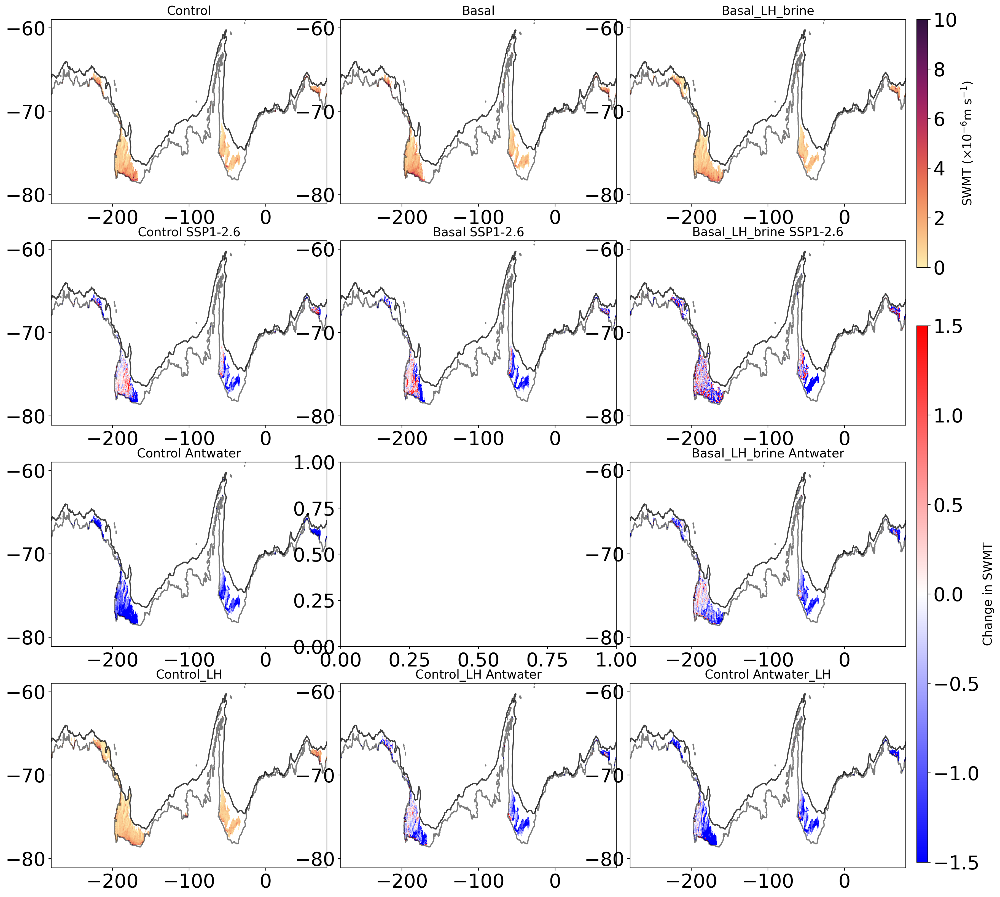

In [91]:
fig  = plt.figure(1, figsize = (20, 20))
gs = gridspec.GridSpec(4, 3, width_ratios=[2, 2, 2], height_ratios=[2, 2, 2, 2])
gs.update(wspace = 0.05)

ax, ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11  = plt.subplot(gs[0]), plt.subplot(gs[1]), plt.subplot(gs[2]),plt.subplot(gs[3]), plt.subplot(gs[4]),plt.subplot(gs[5]),plt.subplot(gs[6]),plt.subplot(gs[7]),plt.subplot(gs[8]),plt.subplot(gs[9]),plt.subplot(gs[10]),plt.subplot(gs[11])

    ## 1:
ax.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
plot_swmt = ax.pcolormesh(swmt_xt, swmt_yt, swmt_avg_ctrl_shelf,vmin=0, vmax=10, cmap=cmo.matter)
ax.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

        ## 2:
ax1.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax1.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
plot_swmt = ax1.pcolormesh(swmt_xt, swmt_yt, swmt_avg_noBG_shelf,vmin=0, vmax=10, cmap=cmo.matter)
ax1.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax1.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

       ## 3:
ax2.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax2.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
plot_swmt = ax2.pcolormesh(swmt_xt, swmt_yt, swmt_avg_BGB_shelf,vmin=0, vmax=10, cmap=cmo.matter)
ax2.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax2.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

## 4:
ax3.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax3.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
# plot_swmt = ax3.pcolormesh(swmt_xt, swmt_yt, shelf_subduction_plot_ctrl_s_2777Sum,vmin=0, vmax=10, cmap=cmo.matter)
plot_swmtA = ax3.pcolormesh(swmt_xt, swmt_yt, swmt_anom_ctrl_s,vmin=-1.5, vmax=1.5, cmap='bwr')
ax3.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax3.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

## 5:
ax4.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax4.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
# plot_swmt = ax4.pcolormesh(swmt_xt, swmt_yt, shelf_subduction_plot_noBG_s_2777Sum,vmin=0, vmax=10, cmap=cmo.matter)
plot_swmtA = ax4.pcolormesh(swmt_xt, swmt_yt, swmt_anom_noBG_s,vmin=-1.5, vmax=1.5, cmap='bwr')
ax4.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax4.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

## 6:
ax5.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax5.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
# plot_swmt = ax5.pcolormesh(swmt_xt, swmt_yt, shelf_subduction_plot_BGB_s_2777Sum, vmin=0, vmax=5, cmap=cmo.matter)
plot_swmtA = ax5.pcolormesh(swmt_xt, swmt_yt, swmt_anom_BGB_s, vmin=-0.5, vmax=0.5, cmap='bwr')
ax5.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax5.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

## 7:
ax6.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax6.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
plot_swmtA = ax6.pcolormesh(swmt_xt, swmt_yt, swmt_anom_ctrl_a,vmin=-1.5, vmax=1.5, cmap='bwr')
ax6.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax6.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

# ## 8:
# ax7.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
# ax7.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
# 
# plot_swmtA = ax7.pcolormesh(swmt_xt, swmt_yt, 0*shelf_subduction_plot_ctrl_a_2777Sum, vmin=-2.5, vmax=5, cmap='bwr')
# verts = np.vstack([np.sin(theta), np.cos(theta)]).T
# circle = mpath.Path(verts * radius + center)
# #ax.set_boundary(circle, transform=ax.transAxes)
# ax7.set_extent([-180, 180, -90, -59], ccrs.PlateCarree())
# ax7.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
# ax7.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

## 9:
ax8.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax8.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
plot_swmtA = ax8.pcolormesh(swmt_xt, swmt_yt, swmt_anom_BGB_a,vmin=-1.5, vmax=1.5, cmap='bwr')
ax8.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax8.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

## 10:
ax9.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax9.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
plot_swmt = ax9.pcolormesh(swmt_xt, swmt_yt, swmt_avg_ctrlBG_shelf,vmin=0, vmax=10, cmap=cmo.matter)
ax9.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax9.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

## 11:
ax10.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax10.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
plot_swmtA = ax10.pcolormesh(swmt_xt, swmt_yt, swmt_anom_ctrlBG_a,vmin=-1.5, vmax=1.5, cmap='bwr')
ax10.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax10.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

## 12:
ax11.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax11.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)
plot_swmtA = ax11.pcolormesh(swmt_xt, swmt_yt, swmt_anom_ctrl_a_BG,vmin=-1.5, vmax=1.5, cmap='bwr')
ax11.contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.3 )
ax11.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha =0.5)

ax.set_title('Control', fontsize = 16)
ax1.set_title('Basal', fontsize = 16)
ax2.set_title('Basal_LH_brine', fontsize = 16)
ax3.set_title('Control SSP1-2.6', fontsize = 16)
ax4.set_title('Basal SSP1-2.6', fontsize = 16)
ax5.set_title('Basal_LH_brine SSP1-2.6', fontsize = 16)
ax6.set_title('Control Antwater', fontsize = 16)
ax8.set_title('Basal_LH_brine Antwater', fontsize = 16)
ax9.set_title('Control_LH', fontsize = 16)
ax10.set_title('Control_LH Antwater', fontsize = 16)
ax11.set_title('Control Antwater_LH', fontsize = 16)

cax = fig.add_axes([0.91, 0.655, 0.01, 0.225])
cbar=plt.colorbar(plot_swmt, cax=cax, orientation='vertical', shrink = 0.5)#, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3])
cbar.set_label(r'SWMT ($\times 10^{-6}$m s$^{-1}$)', fontsize = 16)

cax = fig.add_axes([0.91, 0.115, 0.01, 0.487])
cbar=plt.colorbar(plot_swmtA, cax=cax, orientation='vertical', shrink = 0.5)#, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3])
cbar.set_label(r'Change in SWMT', fontsize = 16)

### Save fig
# plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_Maps_ctrlxSOFIA.png',bbox_inches='tight',dpi=300)
plt.savefig(figdir+'SWMT_sig0_annual_shelf_yr17-20_Maps_ctrlxSOFIA.png',bbox_inches='tight',dpi=300)


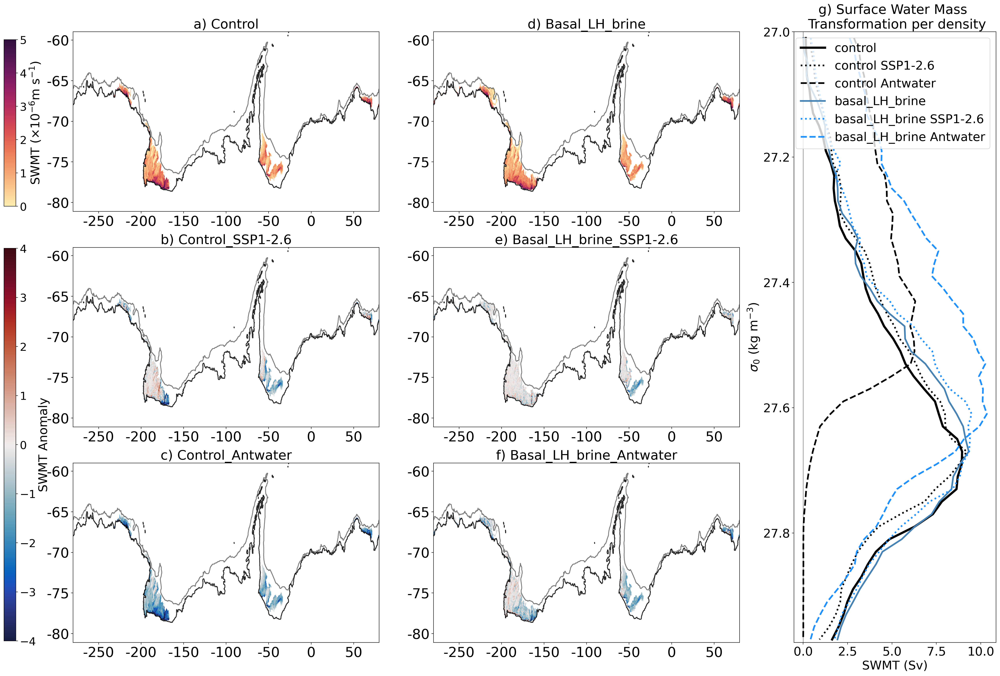

In [92]:
### Figure paper GRL:


fig = plt.figure(figsize=(30, 20))

# Define a GridSpec with 3 rows and 3 columns (extra column for the tall panel)
gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 0.66], height_ratios=[1, 1, 1], figure=fig)

# Create the 6 main panels (3 rows × 2 columns)
axes_main = []
for row in range(3):
    for col in range(2):
        ax = fig.add_subplot(gs[row, col])
        axes_main.append(ax)

# Create the extra tall panel spanning all rows in the last column
ax_extra = fig.add_subplot(gs[:, 2])  # spans all rows
# ax_extra.plot(swmt_noBG_shelf_sum,isopycnal_bin_mid_noBG, label='basal', color='#DDAA33')
# ax_extra.plot(swmt_noBG_s_shelf_sum,isopycnal_bin_mid_noBG_s,'--', label='basal SSP1-2.6', color='#DDAA33')
ax_extra.plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k',linewidth=4)
ax_extra.plot(swmt_ctrl_s_shelf_sum,isopycnal_bin_mid_ctrl_s,':', label='control SSP1-2.6', color='k',linewidth=3)
ax_extra.plot(swmt_ctrl_a_shelf_sum,isopycnal_bin_mid_ctrl_a,'--', label='control Antwater', color='k',linewidth=3)
ax_extra.plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='steelblue',linewidth=3)
ax_extra.plot(swmt_BGB_s_shelf_sum,isopycnal_bin_mid_BGB_s,':', label='basal_LH_brine SSP1-2.6', color='dodgerblue',linewidth=3)
ax_extra.plot(swmt_BGB_a_shelf_sum,isopycnal_bin_mid_BGB_a,'--', label='basal_LH_brine Antwater', color='dodgerblue',linewidth=3)
# ax_extra.plot([0, 0],[31, 33.2], 'k', linewidth=0.5)
# ax_extra.set_ylim((33.2, 31))
ax_extra.plot([0, 0],[27, 27.975], 'k', linewidth=0.5)
ax_extra.set_ylim((27.975, 27))
ax_extra.set_ylabel(r'$\sigma_{0}$ (kg m$^{-3}$)', fontsize = 22)
ax_extra.set_xlabel('SWMT (Sv)', fontsize=22)
ax_extra.legend(loc='upper right', fontsize = 22);
ax_extra.tick_params(axis='x', labelsize=22)
ax_extra.tick_params(axis='y', labelsize=22)
ax_extra.set_title('g) Surface Water Mass \n Transformation per density', fontsize = 24)


for i, ax in enumerate(axes_main, start=1):
    ax.set_title(f"Panel {i}")

axes_main[0].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[0].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmt = axes_main[0].pcolormesh(swmt_xt, swmt_yt, swmt_avg_ctrl_shelf,vmin=0, vmax=5, cmap=cmo.matter)
axes_main[0].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[0].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
axes_main[0].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[0].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[0].set_yticks([-80,-75,-70,-65,-60])
axes_main[0].set_yticklabels(['-80','-75','-70','-65','-60'])

   ## 2:
axes_main[1].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[1].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmt = axes_main[1].pcolormesh(swmt_xt, swmt_yt, swmt_avg_BGB_shelf,vmin=0, vmax=5, cmap=cmo.matter)
axes_main[1].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[1].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
axes_main[1].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[1].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[1].set_yticks([-80,-75,-70,-65,-60])
axes_main[1].set_yticklabels(['-80','-75','-70','-65','-60'])

## 3:
axes_main[2].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[2].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmtA = axes_main[2].pcolormesh(swmt_xt, swmt_yt, swmt_anom_ctrl_s, vmin=-4, vmax=4, cmap=cmo.balance)
axes_main[2].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[2].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
axes_main[2].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[2].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[2].set_yticks([-80,-75,-70,-65,-60])
axes_main[2].set_yticklabels(['-80','-75','-70','-65','-60'])

## 4:
axes_main[3].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[3].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmtA = axes_main[3].pcolormesh(swmt_xt, swmt_yt, swmt_anom_BGB_s, vmin=-4, vmax=4, cmap=cmo.balance)
axes_main[3].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[3].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
axes_main[3].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[3].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[3].set_yticks([-80,-75,-70,-65,-60])
axes_main[3].set_yticklabels(['-80','-75','-70','-65','-60'])

## 5:
axes_main[4].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[4].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmtA = axes_main[4].pcolormesh(swmt_xt, swmt_yt, swmt_anom_ctrl_a, vmin=-4, vmax=4, cmap=cmo.balance)
axes_main[4].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[4].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
axes_main[4].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[4].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[4].set_yticks([-80,-75,-70,-65,-60])
axes_main[4].set_yticklabels(['-80','-75','-70','-65','-60'])

## 6:
axes_main[5].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[5].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmtA = axes_main[5].pcolormesh(swmt_xt, swmt_yt, swmt_anom_BGB_a, vmin=-4, vmax=4, cmap=cmo.balance)
axes_main[5].contour(xt_ocean, yt_ocean,land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[5].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
axes_main[5].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[5].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[5].set_yticks([-80,-75,-70,-65,-60])
axes_main[5].set_yticklabels(['-80','-75','-70','-65','-60'])

axes_main[0].set_title('a) Control', fontsize = 24)
axes_main[2].set_title('b) Control_SSP1-2.6', fontsize = 24)
axes_main[4].set_title('c) Control_Antwater', fontsize = 24)
axes_main[1].set_title('d) Basal_LH_brine', fontsize = 24)
axes_main[3].set_title('e) Basal_LH_brine_SSP1-2.6', fontsize = 24)
axes_main[5].set_title('f) Basal_LH_brine_Antwater', fontsize = 24)

cax = fig.add_axes([0.067, 0.66, 0.01, 0.21])
cbar=plt.colorbar(plot_swmt, cax=cax, orientation='vertical', shrink = 0.5)#, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3])
cbar.set_label(r'SWMT ($\times 10^{-6}$m s$^{-1}$)', fontsize = 22)
cbar.ax.tick_params(labelsize=20)
cax = fig.add_axes([0.067, 0.112, 0.01, 0.495])
cbar=plt.colorbar(plot_swmtA, cax=cax, orientation='vertical', shrink = 0.5)#, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3])
cbar.set_label(r'SWMT Anomaly', fontsize = 22)
cbar.ax.tick_params(labelsize=20)

### Save fig
# plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_Maps_ctrlxSOFIA_Fig1v0.png',bbox_inches='tight',dpi=300)
plt.savefig(figdir+'SWMT_sig0_annual_shelf_yr17-20_Maps_ctrlxSOFIA_Fig1v0.png',bbox_inches='tight',dpi=300)


In [66]:
## get values of DSW formation 

## regional SWMT:
# Adelie Land: 400:800
# Ross: 800:1200
# Weddell: 2100:2500
# Prydz: 3300:3550

print(shelf_mask.shape)

# ctrl
swmt_ctrl_mertz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_2777Sum.isel(xt_ocean=slice(0,800)))
swmt_ctrl_ross, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_2777Sum.isel(xt_ocean=slice(801,1800)))
swmt_ctrl_weddell, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_2777Sum.isel(xt_ocean=slice(1801,2500)))
swmt_ctrl_prydz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_2777Sum.isel(xt_ocean=slice(2501,3600)))
swmt_ctrl_total, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_2777Sum.isel(xt_ocean=slice(0,3600)))
# ctrl_LH
swmt_ctrlBG_mertz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrlBG_2777Sum.isel(xt_ocean=slice(0,800)))
swmt_ctrlBG_ross, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrlBG_2777Sum.isel(xt_ocean=slice(801,1800)))
swmt_ctrlBG_weddell, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrlBG_2777Sum.isel(xt_ocean=slice(1801,2500)))
swmt_ctrlBG_prydz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrlBG_2777Sum.isel(xt_ocean=slice(2501,3600)))
swmt_ctrlBG_total, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrlBG_2777Sum.isel(xt_ocean=slice(0,3600)))
# ctrl SSP126
swmt_ctrl_s_mertz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_s_2777Sum.isel(xt_ocean=slice(0,800)))
swmt_ctrl_s_ross, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_s_2777Sum.isel(xt_ocean=slice(801,1800)))
swmt_ctrl_s_weddell, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_s_2777Sum.isel(xt_ocean=slice(1801,2500)))
swmt_ctrl_s_prydz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_s_2777Sum.isel(xt_ocean=slice(2501,3600)))
swmt_ctrl_s_total, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_s_2777Sum.isel(xt_ocean=slice(0,3600)))
# ctrl antwater
swmt_ctrl_a_mertz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_a_2777Sum.isel(xt_ocean=slice(0,800)))
swmt_ctrl_a_ross, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_a_2777Sum.isel(xt_ocean=slice(801,1800)))
swmt_ctrl_a_weddell, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_a_2777Sum.isel(xt_ocean=slice(1801,2500)))
swmt_ctrl_a_prydz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_a_2777Sum.isel(xt_ocean=slice(2501,3600)))
swmt_ctrl_a_total, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_a_2777Sum.isel(xt_ocean=slice(0,3600)))
# ctrl_LH_antwater
swmt_ctrlBG_a_mertz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrlBG_a_2777Sum.isel(xt_ocean=slice(0,800)))
swmt_ctrlBG_a_ross, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrlBG_a_2777Sum.isel(xt_ocean=slice(801,1800)))
swmt_ctrlBG_a_weddell, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrlBG_a_2777Sum.isel(xt_ocean=slice(1801,2500)))
swmt_ctrlBG_a_prydz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrlBG_a_2777Sum.isel(xt_ocean=slice(2501,3600)))
swmt_ctrlBG_a_total, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrlBG_a_2777Sum.isel(xt_ocean=slice(0,3600)))
# ctrl_antwater_LH
swmt_ctrl_a_BG_mertz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_a_BG_2777Sum.isel(xt_ocean=slice(0,800)))
swmt_ctrl_a_BG_ross, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_a_BG_2777Sum.isel(xt_ocean=slice(801,1800)))
swmt_ctrl_a_BG_weddell, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_a_BG_2777Sum.isel(xt_ocean=slice(1801,2500)))
swmt_ctrl_a_BG_prydz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_a_BG_2777Sum.isel(xt_ocean=slice(2501,3600)))
swmt_ctrl_a_BG_total, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_ctrl_a_BG_2777Sum.isel(xt_ocean=slice(0,3600)))
# BGB
swmt_BGB_mertz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_2777Sum.isel(xt_ocean=slice(0,800)))
swmt_BGB_ross, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_2777Sum.isel(xt_ocean=slice(801,1800)))
swmt_BGB_weddell, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_2777Sum.isel(xt_ocean=slice(1801,2500)))
swmt_BGB_prydz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_2777Sum.isel(xt_ocean=slice(2501,3600)))
swmt_BGB_total, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_2777Sum.isel(xt_ocean=slice(0,3600)))
# BGB SSP126
swmt_BGB_s_mertz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_s_2777Sum.isel(xt_ocean=slice(0,800)))
swmt_BGB_s_ross, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_s_2777Sum.isel(xt_ocean=slice(801,1800)))
swmt_BGB_s_weddell, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_s_2777Sum.isel(xt_ocean=slice(1801,2500)))
swmt_BGB_s_prydz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_s_2777Sum.isel(xt_ocean=slice(2501,3600)))
swmt_BGB_s_total, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_s_2777Sum.isel(xt_ocean=slice(0,3600)))
# BGB antwater
swmt_BGB_a_mertz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_a_2777Sum.isel(xt_ocean=slice(0,800)))
swmt_BGB_a_ross, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_a_2777Sum.isel(xt_ocean=slice(801,1800)))
swmt_BGB_a_weddell, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_a_2777Sum.isel(xt_ocean=slice(1801,2500)))
swmt_BGB_a_prydz, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_a_2777Sum.isel(xt_ocean=slice(2501,3600)))
swmt_BGB_a_total, shelf_mask = shelf_mask_isobath(shelf_subduction_plot_BGB_a_2777Sum.isel(xt_ocean=slice(0,3600)))

area_t_mertz, shelf_mask = shelf_mask_isobath(area_t.isel(xt_ocean=slice(0,800)))
area_t_ross, shelf_mask = shelf_mask_isobath(area_t.isel(xt_ocean=slice(801,1800)))
area_t_weddell, shelf_mask = shelf_mask_isobath(area_t.isel(xt_ocean=slice(1801,2500)))
area_t_prydz, shelf_mask = shelf_mask_isobath(area_t.isel(xt_ocean=slice(2501,3600)))
area_t_total, shelf_mask = shelf_mask_isobath(area_t.isel(xt_ocean=slice(0,3600)))


(510, 3600)


In [67]:
swmt_ctrl_mertz_sum = (swmt_ctrl_mertz * area_t_mertz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_ross_sum = (swmt_ctrl_ross * area_t_ross/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_weddell_sum = (swmt_ctrl_weddell * area_t_weddell/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_prydz_sum = (swmt_ctrl_prydz * area_t_prydz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_total_sum = (swmt_ctrl_total * area_t_total/1e6).sum(['xt_ocean','yt_ocean']).values

swmt_ctrl_s_mertz_sum = (swmt_ctrl_s_mertz * area_t_mertz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_s_ross_sum = (swmt_ctrl_s_ross * area_t_ross/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_s_weddell_sum = (swmt_ctrl_s_weddell * area_t_weddell/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_s_prydz_sum = (swmt_ctrl_s_prydz * area_t_prydz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_s_total_sum = (swmt_ctrl_s_total * area_t_total/1e6).sum(['xt_ocean','yt_ocean']).values

swmt_ctrl_a_mertz_sum = (swmt_ctrl_a_mertz * area_t_mertz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_a_ross_sum = (swmt_ctrl_a_ross * area_t_ross/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_a_weddell_sum = (swmt_ctrl_a_weddell * area_t_weddell/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_a_prydz_sum = (swmt_ctrl_a_prydz * area_t_prydz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_a_total_sum = (swmt_ctrl_a_total * area_t_total/1e6).sum(['xt_ocean','yt_ocean']).values


/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 10.14 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 10.50 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [68]:
swmt_ctrlBG_mertz_sum = (swmt_ctrlBG_mertz * area_t_mertz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrlBG_ross_sum = (swmt_ctrlBG_ross * area_t_ross/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrlBG_weddell_sum = (swmt_ctrlBG_weddell * area_t_weddell/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrlBG_prydz_sum = (swmt_ctrlBG_prydz * area_t_prydz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrlBG_total_sum = (swmt_ctrlBG_total * area_t_total/1e6).sum(['xt_ocean','yt_ocean']).values


/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 10.14 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 10.50 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [69]:
swmt_ctrlBG_a_mertz_sum = (swmt_ctrlBG_a_mertz * area_t_mertz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrlBG_a_ross_sum = (swmt_ctrlBG_a_ross * area_t_ross/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrlBG_a_weddell_sum = (swmt_ctrlBG_a_weddell * area_t_weddell/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrlBG_a_prydz_sum = (swmt_ctrlBG_a_prydz * area_t_prydz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrlBG_a_total_sum = (swmt_ctrlBG_a_total * area_t_total/1e6).sum(['xt_ocean','yt_ocean']).values


/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 10.14 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 10.50 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [70]:
swmt_ctrl_a_BG_mertz_sum = (swmt_ctrl_a_BG_mertz * area_t_mertz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_a_BG_ross_sum = (swmt_ctrl_a_BG_ross * area_t_ross/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_a_BG_weddell_sum = (swmt_ctrl_a_BG_weddell * area_t_weddell/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_a_BG_prydz_sum = (swmt_ctrl_a_BG_prydz * area_t_prydz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_ctrl_a_BG_total_sum = (swmt_ctrl_a_BG_total * area_t_total/1e6).sum(['xt_ocean','yt_ocean']).values


/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 10.14 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 10.50 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [71]:
swmt_BGB_mertz_sum = (swmt_BGB_mertz * area_t_mertz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_ross_sum = (swmt_BGB_ross * area_t_ross/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_weddell_sum = (swmt_BGB_weddell * area_t_weddell/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_prydz_sum = (swmt_BGB_prydz * area_t_prydz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_total_sum = (swmt_BGB_total * area_t_total/1e6).sum(['xt_ocean','yt_ocean']).values

swmt_BGB_s_mertz_sum = (swmt_BGB_s_mertz * area_t_mertz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_s_ross_sum = (swmt_BGB_s_ross * area_t_ross/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_s_weddell_sum = (swmt_BGB_s_weddell * area_t_weddell/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_s_prydz_sum = (swmt_BGB_s_prydz * area_t_prydz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_s_total_sum = (swmt_BGB_s_total * area_t_total/1e6).sum(['xt_ocean','yt_ocean']).values

swmt_BGB_a_mertz_sum = (swmt_BGB_a_mertz * area_t_mertz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_a_ross_sum = (swmt_BGB_a_ross * area_t_ross/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_a_weddell_sum = (swmt_BGB_a_weddell * area_t_weddell/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_a_prydz_sum = (swmt_BGB_a_prydz * area_t_prydz/1e6).sum(['xt_ocean','yt_ocean']).values
swmt_BGB_a_total_sum = (swmt_BGB_a_total * area_t_total/1e6).sum(['xt_ocean','yt_ocean']).values


/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 10.14 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 10.50 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [72]:
[swmt_ctrl_prydz_sum*1e-6, swmt_BGB_prydz_sum*1e-6,
 swmt_ctrl_s_prydz_sum*1e-6, swmt_BGB_s_prydz_sum*1e-6,
 swmt_ctrl_s_prydz_sum*1e-6, swmt_BGB_s_prydz_sum*1e-6]


[np.float64(0.3979601227207825),
 np.float64(0.4523707262634907),
 np.float64(0.29099357500256595),
 np.float64(0.4032574649599482),
 np.float64(0.29099357500256595),
 np.float64(0.4032574649599482)]

In [73]:
## adding bar plots;


# import matplotlib.pyplot as plt
# import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# import cartopy.crs as ccrs
# import numpy as np

# Dummy data for 4 regions (each with 3 experiments)
regions = ['Weddell', 'Ross', 'Mertz', 'Prydz']
data = {
    'Weddell': [swmt_ctrl_weddell_sum*1e-6, swmt_BGB_weddell_sum*1e-6,
                 swmt_ctrl_s_weddell_sum*1e-6, swmt_BGB_s_weddell_sum*1e-6,
                 swmt_ctrl_a_weddell_sum*1e-6, swmt_BGB_a_weddell_sum*1e-6],
    'Ross': [swmt_ctrl_ross_sum*1e-6, swmt_BGB_ross_sum*1e-6,
                 swmt_ctrl_s_ross_sum*1e-6, swmt_BGB_s_ross_sum*1e-6,
                 swmt_ctrl_a_ross_sum*1e-6, swmt_BGB_a_ross_sum*1e-6],
    'Mertz': [swmt_ctrl_mertz_sum*1e-6, swmt_BGB_mertz_sum*1e-6,
                 swmt_ctrl_s_mertz_sum*1e-6, swmt_BGB_s_mertz_sum*1e-6,
                 swmt_ctrl_a_mertz_sum*1e-6, swmt_BGB_a_mertz_sum*1e-6],
    'Prydz': [swmt_ctrl_prydz_sum*1e-6, swmt_BGB_prydz_sum*1e-6,
                 swmt_ctrl_s_prydz_sum*1e-6, swmt_BGB_s_prydz_sum*1e-6,
                 swmt_ctrl_a_prydz_sum*1e-6, swmt_BGB_a_prydz_sum*1e-6]
}
experiments = ['Control','BasalLH', 'Control-SSP126','BasalLH-SSP126', 'Control-Antw.', 'BasalLH-Antw.']


#### Load cross-1000m transport for plots:

In [74]:
%%time

## 1 = control
## 2 = control antwater
## 8 = control ssp126
## 3 - control_gade
## 4 - control_gade antwater
## 5 - control antwater_gade
## 6 - BGB
## 7 - BGB antwater
## 9 - BGB ssp126

# save_dir = '/g/data/e14/fbd581/Basal_Pedro_project/updated_git_basal_mom5-collaborative/basal_mom5-collaborative-project/notebooks/cross_contour/'
save_dir = '/g/data/e14/fbd581/Basal_Pedro_project/updating_github_repo/basal_mom5-collaborative-project/notebooks/cross_contour/'

array1 = xr.open_dataset(save_dir+'control_vol_trans_across_contour_binned_last_3yr.nc').vol_trans_across_contour_binned_last_3yr
array2 = xr.open_dataset(save_dir+'control_antwater_vol_trans_across_contour_binned_last_3yr.nc').vol_trans_across_contour_binned_last_3yr
array3 = xr.open_dataset(save_dir+'control_gade_vol_trans_across_contour_binned_last_3yr.nc').vol_trans_across_contour_binned_last_3yr
array4 = xr.open_dataset(save_dir+'control_gade_antwater_vol_trans_across_contour_binned_last_3yr.nc').vol_trans_across_contour_binned_last_3yr
array5 = xr.open_dataset(save_dir+'control_antwater_gade_vol_trans_across_contour_binned_last_3yr.nc').vol_trans_across_contour_binned_last_3yr
array6 = xr.open_dataset(save_dir+'basal_gade_brine_vol_trans_across_contour_binned_last_3yr.nc').vol_trans_across_contour_binned_last_3yr
array7 = xr.open_dataset(save_dir+'basal_gade_brine_antwater_vol_trans_across_contour_binned_last_3yr.nc').vol_trans_across_contour_binned_last_3yr

array8 = xr.open_dataset(save_dir+'control_ssp126_vol_trans_across_contour_binned_last_3yr.nc').vol_trans_across_contour_binned_last_3yr
array9 = xr.open_dataset(save_dir+'basal_gade_brine_ssp126_vol_trans_across_contour_binned_last_3yr.nc').vol_trans_across_contour_binned_last_3yr




CPU times: user 196 ms, sys: 123 ms, total: 318 ms
Wall time: 279 ms


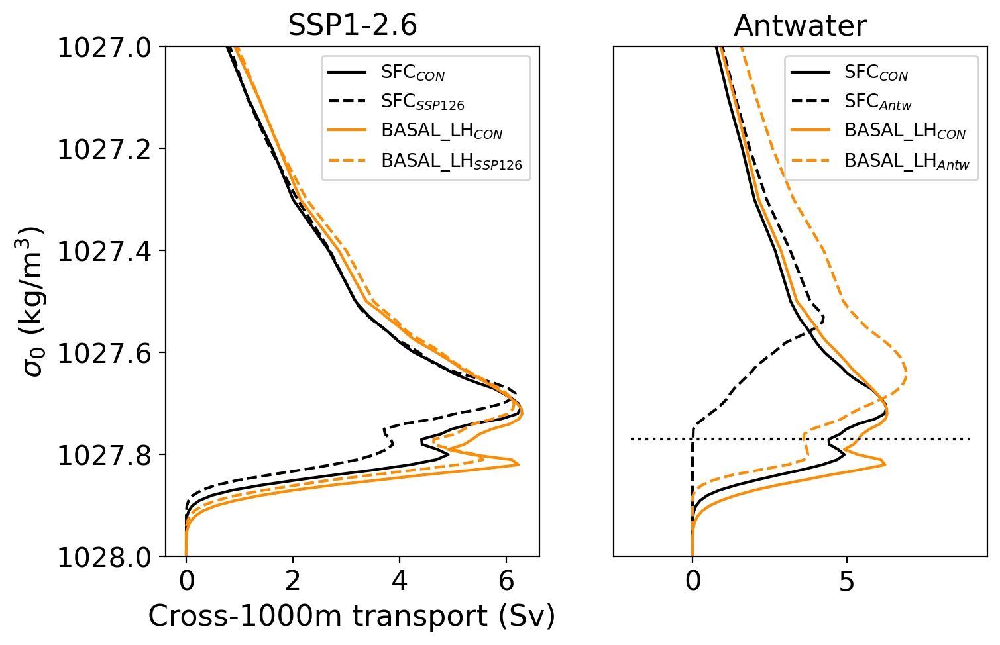

In [80]:

fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8, 5))

# OPEN FROM SAVED ARRAY
b = (array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[0], y = 'isopycnal_bins',label=r'SFC$_{CON}$',color='#000000')
b = (array8.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[0], y = 'isopycnal_bins',linestyle='--',label=r'SFC$_{SSP126}$',color='#000000')
b = (array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[0], y = 'isopycnal_bins',linestyle='-',label=r'BASAL_LH$_{CON}$',color='darkorange')
b = (array9.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')  
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[0], y = 'isopycnal_bins',linestyle='--',label=r'BASAL_LH$_{SSP126}$',color='darkorange')

ax[0].set_ylim(1028.0,1027)
ax[0].set_ylabel('$\sigma_0$ (kg/m$^3$)', fontsize = 16)
ax[0].set_xlabel('Cross-1000m transport (Sv)', fontsize = 16)
ax[0].set_title('SSP1-2.6', fontsize = 16)
ax[0].tick_params(axis='x', labelsize=15)  # Set x-tick font size
ax[0].tick_params(axis='y', labelsize=15)  # Set y-tick font size
ax[0].legend(loc = 'upper right')#, bbox_to_anchor = (+1.35,1))


b = (array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[1], y = 'isopycnal_bins',label=r'SFC$_{CON}$',color='#000000')
b = (array2.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[1], y = 'isopycnal_bins',linestyle='--',label=r'SFC$_{Antw}$',color='#000000')
b = (array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
# (b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[0], y = 'isopycnal_bins',linestyle='-',label=r'SFC-LH_{CON}',color='dodgerblue')
# b = (array4.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
# (b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[0], y = 'isopycnal_bins',linestyle='--',label=r'SFC-LH_{Antw}',color='dodgerblue')
# b = (array5.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
# (b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[0], y = 'isopycnal_bins',linestyle=':',label=r'SFC_{Antw-LH}',color='lightblue')
# b = (array6.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[1], y = 'isopycnal_bins',linestyle='-',label=r'BASAL_LH$_{CON}$',color='darkorange')
b = (array7.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')  
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax[1], y = 'isopycnal_bins',linestyle='--',label=r'BASAL_LH$_{Antw}$',color='darkorange')

ax[1].plot(np.arange(-2,10),1027.77*np.ones(np.arange(-2,10).size),':k')#, bbox_to_anchor = (+1.35,1))


ax[1 ].legend(loc = 'upper right')#, bbox_to_anchor = (+1.35,1))
ax[1].set_ylim(1028.0,1027)
ax[1].set_ylabel('', fontsize = 16)
ax[1].set_xlabel('', fontsize = 16)
ax[1].set_title('Antwater', fontsize = 16)
ax[1].tick_params(axis='x', labelsize=15)  # Set x-tick font size
ax[1].tick_params(axis='y', labelsize=15)  # Set y-tick font size
ax[1].set_yticks([])  # Set y-tick font size

# plt.savefig(figdir+'Cross-1000m_annual_shelf_yr17-20_ctrl_LH.png',bbox_inches='tight',dpi=300)
plt.show()


#### read contours and calculate other metrics for the cross-slope transport:

In [75]:
### Load Adele's isobath contour
lat_range  = slice(-90,-59)
isobath_depth = 1000
outfile = '/g/data/e14/fbd581/basal_mom5-collaborative-project/Antarctic_slope_contour_'+str(isobath_depth)+'m.npz'
data = np.load(outfile)
mask_y_transport = data['mask_y_transport']
mask_x_transport = data['mask_x_transport']


In [76]:
xt_ocean = cat.search(variable='xt_ocean', file_id='ocean.fx.xt_ocean:3600.xu_ocean:3600.yt_ocean:2700.yu_ocean:2700').to_dask()
xt_ocean = xt_ocean['xt_ocean']

In [77]:
yt_ocean = cat.search(variable='yt_ocean', file_id='ocean.fx.xt_ocean:3600.xu_ocean:3600.yt_ocean:2700.yu_ocean:2700').to_dask(xarray_open_kwargs={'decode_timedelta':True})
yt_ocean = yt_ocean['yt_ocean']
yt_ocean = yt_ocean.sel(yt_ocean=lat_range)


In [78]:
land_mask = (ht*0).fillna(1)
ht_shelf , shelf_mask = shelf_mask_isobath(ht)



In [79]:
yu_ocean = cat.search(variable='yu_ocean', file_id='ocean.fx.xt_ocean:3600.xu_ocean:3600.yt_ocean:2700.yu_ocean:2700').to_dask(xarray_open_kwargs={'decode_timedelta':True})
yu_ocean = yu_ocean.sel(yu_ocean=lat_range)

xu_ocean = cat.search(variable='xu_ocean', file_id='ocean.fx.xt_ocean:3600.xu_ocean:3600.yt_ocean:2700.yu_ocean:2700').to_dask(xarray_open_kwargs={'decode_timedelta':True})


In [80]:
mask_y_transport = data['mask_y_transport']
mask_x_transport = data['mask_x_transport']
mask_y_transport_numbered = data['mask_y_transport_numbered']
mask_x_transport_numbered = data['mask_x_transport_numbered']

mask_x_transport = xr.DataArray(mask_x_transport, coords = [yt_ocean['yt_ocean'], xu_ocean['xu_ocean']], dims=['y_ocean', 'x_ocean'])
mask_y_transport = xr.DataArray(mask_y_transport, coords = [yu_ocean['yu_ocean'], xt_ocean['xt_ocean']], dims=['y_ocean', 'x_ocean'])
mask_x_transport_numbered = xr.DataArray(mask_x_transport_numbered, coords = [yt_ocean['yt_ocean'], xu_ocean['xu_ocean']], dims=['y_ocean', 'x_ocean'])
mask_y_transport_numbered = xr.DataArray(mask_y_transport_numbered, coords = [yu_ocean['yu_ocean'], xt_ocean['xt_ocean']], dims=['y_ocean', 'x_ocean'])

# stack contour data into 1d:
mask_x_numbered_1d = mask_x_transport_numbered.stack(contour_index = ['y_ocean', 'x_ocean'])
mask_x_numbered_1d = mask_x_numbered_1d.where(mask_x_numbered_1d > 0, drop = True)
mask_y_numbered_1d = mask_y_transport_numbered.stack(contour_index = ['y_ocean', 'x_ocean'])
mask_y_numbered_1d = mask_y_numbered_1d.where(mask_y_numbered_1d > 0, drop = True)
contour_ordering = xr.concat((mask_x_numbered_1d,mask_y_numbered_1d), dim = 'contour_index')
contour_ordering = contour_ordering.sortby(contour_ordering)
contour_index_array = np.arange(1,len(contour_ordering)+1)

# get lat and lon along contour, useful for plotting later:
lat_along_contour = contour_ordering.y_ocean
lon_along_contour = contour_ordering.x_ocean
# don't need the multi-index anymore, replace with contour count
lat_along_contour.coords['contour_index'] = contour_index_array
lon_along_contour.coords['contour_index'] = contour_index_array



/jobfs/178340751.gadi-pbs/ipykernel_2060879/2042992571.py:24: FutureWarning: updating coordinate 'contour_index', which is a PandasMultiIndex, would leave the multi-index level coordinates ['y_ocean', 'x_ocean'] in an inconsistent state. This will raise an error in the future. Use `.drop_vars(['contour_index', 'y_ocean', 'x_ocean'])` to drop the coordinates' values before assigning new coordinate values.
  lat_along_contour.coords['contour_index'] = contour_index_array
/jobfs/178340751.gadi-pbs/ipykernel_2060879/2042992571.py:25: FutureWarning: updating coordinate 'contour_index', which is a PandasMultiIndex, would leave the multi-index level coordinates ['y_ocean', 'x_ocean'] in an inconsistent state. This will raise an error in the future. Use `.drop_vars(['contour_index', 'y_ocean', 'x_ocean'])` to drop the coordinates' values before assigning new coordinate values.
  lon_along_contour.coords['contour_index'] = contour_index_array


In [81]:
AdelieW = -280
AdelieE = -200
RossW = -200
RossE = -150
# WAW = -150
# WAE = -65
AmW = -150
AmE = -100
BeW = -100
BeE = -65

WeddellW = -65
WeddellE = 0
PrydzW = 0
PrydzE = 80

basin_indices = np.zeros(7)
for i in np.arange(100,len(lon_along_contour.values)):
    if (basin_indices[1]==0):
        if (lon_along_contour.values[i]>AdelieE):
            basin_indices[1] = lon_along_contour.contour_index.values[i]
    if (basin_indices[2]==0):
        if (lon_along_contour.values[i]>RossE):
            basin_indices[2] = lon_along_contour.contour_index.values[i]
    if (basin_indices[3]==0):
        if (lon_along_contour.values[i]>AmE):
            basin_indices[3] = lon_along_contour.contour_index.values[i]
    if (basin_indices[4]==0):
        if (lon_along_contour.values[i]>BeE):
            basin_indices[4] = lon_along_contour.contour_index.values[i]
    if (basin_indices[5]==0):
        if lon_along_contour.values[i]>WeddellE:
            basin_indices[5] = lon_along_contour.contour_index.values[i]
    if (basin_indices[6]==0):
        if (lon_along_contour.values[i]>PrydzE):
            basin_indices[6] = lon_along_contour.contour_index.values[i]
# basin_indices

Adelie = slice(basin_indices[0],basin_indices[1])
Ross = slice(basin_indices[1],basin_indices[2])
Am = slice(basin_indices[2],basin_indices[3])
Be = slice(basin_indices[3],basin_indices[4])
Weddell = slice(basin_indices[4], basin_indices[5])
Prydz = slice(basin_indices[5],6002)

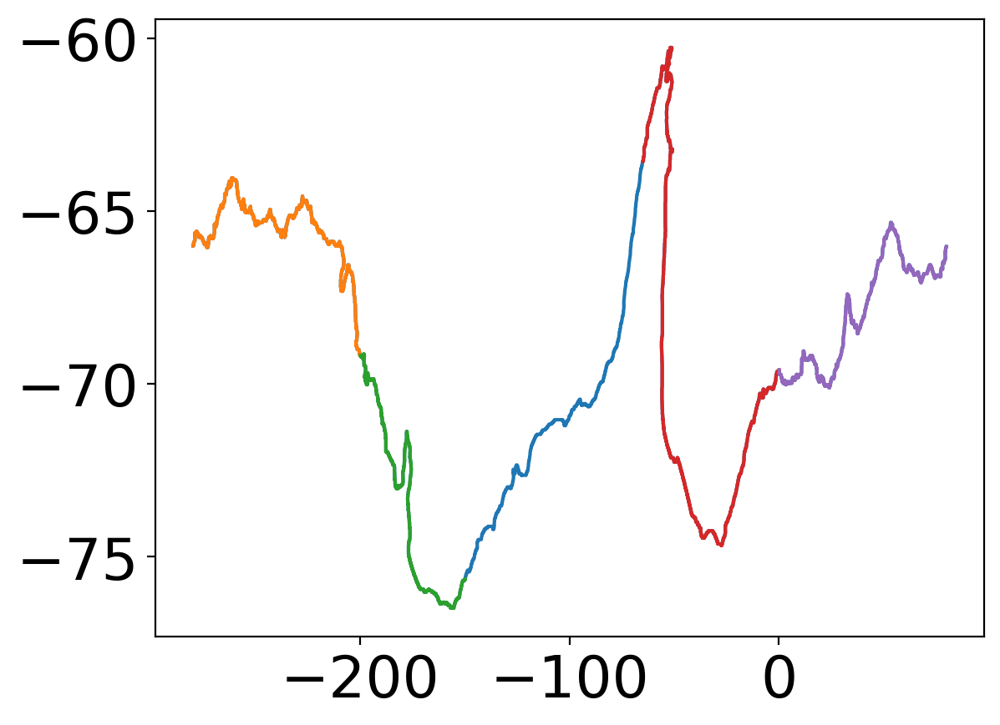

In [90]:
plt.plot(lon_along_contour,lat_along_contour)
plt.plot(lon_along_contour.sel(contour_index=Adelie),lat_along_contour.sel(contour_index=Adelie))
plt.plot(lon_along_contour.sel(contour_index=Ross),lat_along_contour.sel(contour_index=Ross))
plt.plot(lon_along_contour.sel(contour_index=Weddell),lat_along_contour.sel(contour_index=Weddell))
plt.plot(lon_along_contour.sel(contour_index=Prydz),lat_along_contour.sel(contour_index=Prydz))


In [82]:
## 1 = control
## 2 = control antwater
## 8 = control ssp126
## 3 - control_gade
## 4 - control_gade antwater
## 5 - control antwater_gade
## 6 - BGB
## 7 - BGB antwater
## 9 - BGB ssp126

# Define your arrays and their names
arrays = {
    "control": array1,
    "control_antwater": array2,
    "control_gade": array3,
    "control_gade_antwater": array4,
    "control_antwater_gade": array5,
    "BGB": array6,
    "BGB_antwater": array7,
    "control_ssp126": array8,
    "BGB_ssp126": array9,
}

# Define regions and readable names
regions = {
    "Adelie": Adelie,
    "Ross": Ross,
    "Weddell": Weddell,
    "Prydz": Prydz,
}

# Dictionary to store all results
results = {}

for name, arr in arrays.items():

    # Create sub-dictionary for this array
    results[name] = {}

    # ---- TOTAL (no region selection) ----
    b = (arr.isel(variable=0)/1e6).sum("contour_index")
    bb = b.sum("isopycnal_bins") - b.cumsum("isopycnal_bins")

    results[name]["total"] = {"bb": bb}

    # ---- REGION-SPECIFIC ----
    for region_name, region_idx in regions.items():

        b_reg = (arr.isel(variable=0)/1e6).sel(contour_index=region_idx).sum("contour_index")
        bb_reg = b_reg.sum("isopycnal_bins") - b_reg.cumsum("isopycnal_bins")

        results[name][region_name] = {"bb": bb_reg}


In [83]:
print('isopycnal threshold for each DSW region: ',
    results['control']['Weddell']["bb"].isopycnal_bins[58].values,
      results['control']['Weddell']["bb"].isopycnal_bins[68].values,
      results['control']['Weddell']["bb"].isopycnal_bins[63].values,
      results['control']['Weddell']["bb"].isopycnal_bins[55].values)

isopycnal threshold for each DSW region:  1027.7199999999998 1027.8199999999997 1027.7699999999998 1027.6899999999998


In [84]:
## reconfiguring bar plots with cross-slope transport field:

## adding bar plots;

# Dummy data for 4 regions (each with 3 experiments)
regions = ['a) Weddell Sea', 'd) Ross Sea', 'e) Adélie Land', 'b) Prydz Bay']
data = {
    'Weddell': [swmt_ctrl_weddell_sum*1e-6, swmt_BGB_weddell_sum*1e-6,
                 swmt_ctrl_s_weddell_sum*1e-6, swmt_BGB_s_weddell_sum*1e-6,
                 swmt_ctrl_a_weddell_sum*1e-6, swmt_BGB_a_weddell_sum*1e-6],
    'Ross': [swmt_ctrl_ross_sum*1e-6, swmt_BGB_ross_sum*1e-6,
                 swmt_ctrl_s_ross_sum*1e-6, swmt_BGB_s_ross_sum*1e-6,
                 swmt_ctrl_a_ross_sum*1e-6, swmt_BGB_a_ross_sum*1e-6],
    'Adelie': [swmt_ctrl_mertz_sum*1e-6, swmt_BGB_mertz_sum*1e-6,
                 swmt_ctrl_s_mertz_sum*1e-6, swmt_BGB_s_mertz_sum*1e-6,
                 swmt_ctrl_a_mertz_sum*1e-6, swmt_BGB_a_mertz_sum*1e-6],
    'Prydz': [swmt_ctrl_prydz_sum*1e-6, swmt_BGB_prydz_sum*1e-6,
                 swmt_ctrl_s_prydz_sum*1e-6, swmt_BGB_s_prydz_sum*1e-6,
                 swmt_ctrl_a_prydz_sum*1e-6, swmt_BGB_a_prydz_sum*1e-6]
}

data_CST = {
    'Weddell': [results['control']['Weddell']["bb"].isel(isopycnal_bins=slice(58,-1))[0].values, results['control_ssp126']['Weddell']["bb"].isel(isopycnal_bins=slice(58,-1))[0].values,
                 results['control_antwater']['Weddell']["bb"].isel(isopycnal_bins=slice(58,-1))[0].values, results['BGB']['Weddell']["bb"].isel(isopycnal_bins=slice(58,-1))[0].values,
                 results['BGB_ssp126']['Weddell']["bb"].isel(isopycnal_bins=slice(58,-1))[0].values, results['BGB_antwater']['Weddell']["bb"].isel(isopycnal_bins=slice(58,-1))[0].values],    
    'Ross': [results['control']['Ross']["bb"].isel(isopycnal_bins=slice(68,-1))[0].values, results['control_ssp126']['Ross']["bb"].isel(isopycnal_bins=slice(68,-1))[0].values,
                 results['control_antwater']['Ross']["bb"].isel(isopycnal_bins=slice(68,-1))[0].values, results['BGB']['Ross']["bb"].isel(isopycnal_bins=slice(68,-1))[0].values,
                 results['BGB_ssp126']['Ross']["bb"].isel(isopycnal_bins=slice(68,-1))[0].values, results['BGB_antwater']['Ross']["bb"].isel(isopycnal_bins=slice(68,-1))[0].values],
    'Adelie': [results['control']['Adelie']["bb"].isel(isopycnal_bins=slice(55,-1))[0].values, results['control_ssp126']['Adelie']["bb"].isel(isopycnal_bins=slice(63,-1))[0].values,
                 results['control_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(55,-1))[0].values, results['BGB']['Adelie']["bb"].isel(isopycnal_bins=slice(63,-1))[0].values,
                 results['BGB_ssp126']['Adelie']["bb"].isel(isopycnal_bins=slice(55,-1))[0].values, results['BGB_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(63,-1))[0].values],    
    'Prydz': [results['control']['Prydz']["bb"].isel(isopycnal_bins=slice(51,-1))[0].values, results['control_ssp126']['Prydz']["bb"].isel(isopycnal_bins=slice(55,-1))[0].values,
                 results['control_antwater']['Prydz']["bb"].isel(isopycnal_bins=slice(51,-1))[0].values, results['BGB']['Prydz']["bb"].isel(isopycnal_bins=slice(55,-1))[0].values,
                 results['BGB_ssp126']['Prydz']["bb"].isel(isopycnal_bins=slice(51,-1))[0].values, results['BGB_antwater']['Prydz']["bb"].isel(isopycnal_bins=slice(55,-1))[0].values],
}
experiments = [r'SFC$_{CON}$','SFC$_{SSP126}$','SFC$_{Antw}$',r'BASAL_LH$_{CON}$_$_{LH}$','BASAL_LH$_{SSP126}$_$_{LH}$', 'BASAL_LH$_{Ant}$_$_{LH}$']


# SFC$_{Antw}$_$_{LH}$

[]

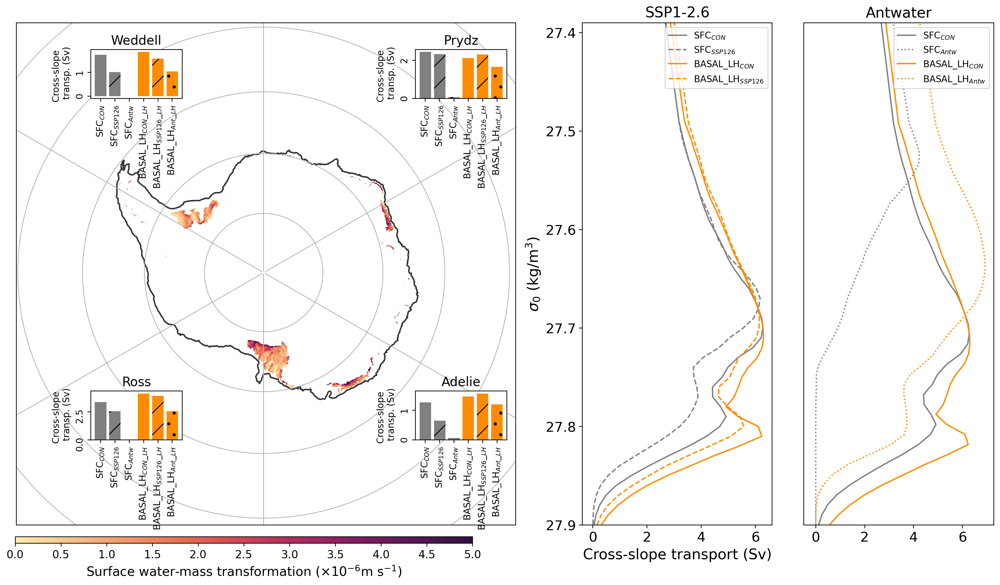

In [94]:



fig  = plt.figure(1, figsize = (20, 10))
gs = gridspec.GridSpec(1,3, width_ratios = [4.5, 1.5, 1.5]) 
gs.update(wspace = 0.1)

ax_map, ax1, ax2 = plt.subplot(gs[0], projection=ccrs.SouthPolarStereo()), plt.subplot(gs[1]), plt.subplot(gs[2])

# Main South Pole map
# ax_map = fig.add_subplot(gs[:, :3], projection=ccrs.SouthPolarStereo())

# 1st plot
# ax_map.contour(xt_ocean, yt_ocean,land_mask.values, [0, 1],
#            colors = 'k', alpha = 0.3, transform = ccrs.PlateCarree() )
ax_map.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],
           colors='k', alpha =0.8, transform = ccrs.PlateCarree())

plot_swmt = ax_map.pcolormesh(swmt_xt, swmt_yt, swmt_avg_ctrl_shelf,
                          vmin=0, vmax=5, cmap=cmo.matter,transform=ccrs.PlateCarree())

ax_map.set_extent([-180, 180, -90, -49], ccrs.PlateCarree())
ax_map.gridlines()
# ax_map.set_title('Antarctic SWMT for $ \sigma_{1} \gec $ 32.55 (kg m$^{-3}$)', fontsize=14)

# Positions for inset axes (relative to map)
positions = {
    'Weddell': [0.14, 0.84, 1.4, 0.75],  # top-left
    'Ross': [0.14, 0.16, 1.4, 0.75],     # bottom-left
    'Adelie': [0.79, 0.16, 1.4, 0.75],    # bottom-right
    'Prydz': [0.79, 0.84, 1.4, 0.75]     # top-right
}

# Add inset bar plots
for region, pos in positions.items():
    ax_inset = inset_axes(ax_map, width=pos[2], height=pos[3],
                          loc='lower left', bbox_to_anchor=(pos[0], pos[1], pos[2], pos[3]),
                          bbox_transform=ax_map.transAxes)
    ax_inset.bar(experiments, data_CST[region], color=['gray','gray', 'gray','darkorange', 'darkorange', 'darkorange'],
                hatch=['','/','.','','/','.'])

    ax_inset.set_title(region, fontsize=14)
    ax_inset.set_ylabel('Cross-slope \n transp. (Sv)', fontsize=10)
    ax_inset.tick_params(axis='x', labelsize=10, rotation=90)
    ax_inset.tick_params(axis='y', labelsize=10, rotation=90)
    # ax_inset.set_xticks(rotation=45, ha="right")


cax = fig.add_axes([0.151, 0.082, 0.35, 0.01])
cbar=plt.colorbar(plot_swmt, cax=cax, orientation='horizontal', shrink = 0.5, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5])
cbar.set_label(r'Surface water-mass transformation ($\times 10^{-6}$m s$^{-1}$)', fontsize = 14)
cbar.ax.tick_params(labelsize=12)

# 2nd plot

b = (array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',label=r'SFC$_{CON}$',color='gray')
b = (array8.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',linestyle='--',label=r'SFC$_{SSP126}$',color='gray')
b = (array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',linestyle='-',label=r'BASAL_LH$_{CON}$',color='darkorange')
b = (array9.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')  
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',linestyle='--',label=r'BASAL_LH$_{SSP126}$',color='darkorange')

ax1.set_ylim(1027.9,1027.4) #1028.0,1027)
ax1.set_ylabel('$\sigma_0$ (kg/m$^3$)', fontsize = 16)
ax1.set_xlabel('Cross-slope transport (Sv)', fontsize = 16)
ax1.set_title('SSP1-2.6', fontsize = 16)
ax1.tick_params(axis='x', labelsize=15)  # Set x-tick font size
ax1.tick_params(axis='y', labelsize=15)  # Set y-tick font size
ax1.legend(loc = 'upper right')#, bbox_to_anchor = (+1.35,1))
ax1.set_yticks(np.arange(1027.91,1027.4,-.1),['27.9','27.8','27.7','27.6','27.5','27.4'])

b = (array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',label=r'SFC$_{CON}$',color='gray')
b = (array2.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',linestyle=':',label=r'SFC$_{Antw}$',color='gray')
b = (array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',linestyle='-',label=r'BASAL_LH$_{CON}$',color='darkorange')
b = (array7.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')  
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',linestyle=':',label=r'BASAL_LH$_{Antw}$',color='darkorange')

ax2.legend(loc = 'upper right')#, bbox_to_anchor = (+1.35,1))
ax2.set_ylim(1027.9,1027.4)
ax2.set_ylabel('', fontsize = 16)
ax2.set_xlabel('', fontsize = 16)
ax2.set_title('Antwater', fontsize = 16)
ax2.tick_params(axis='x', labelsize=15)  # Set x-tick font size
ax2.tick_params(axis='y', labelsize=15)  # Set y-tick font size
ax2.set_yticks([])  # Set y-tick font size


### Save fig
# plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_Maps_ctrlxSOFIA_Fig1v2.png',bbox_inches='tight',dpi=300)
# plt.show()



In [85]:
# Original coordinates
lat = yt_ocean.yt_ocean.values   # (Ny,)
lon = xt_ocean.xt_ocean.values   # (Nx,)

# open ht again just to fill up Antarctica land mask (w/o a whole!)
ds = xr.open_dataset('/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091_21mbath/output000/ocean/ocean_grid.nc')
ht2 = ds.sel(yt_ocean=slice(-90,-59)).ht
ds.close()
land_mask2= (ht2*0).fillna(1)


# Ensure latitude is descending (north -> south)
if lat[0] < lat[-1]:
    lat = lat[::-1]
    land_mask_values = land_mask2.values[::-1, :]

# Extend grid southward to the pole
lat_min = lat[-1]   # most southern point (~ -81.1)

extra_lats = np.linspace(lat_min, -90, 20, endpoint=True)[1:]

# Land everywhere south of last ocean row
extra_land = np.ones((extra_lats.size, lon.size), dtype=np.int8)

# Concatenate
new_lat  = np.concatenate([lat, extra_lats])
new_land = np.vstack([land_mask_values, extra_land])

# Build mask explicitly
land = np.ma.array(new_land, mask=(new_land == 0))


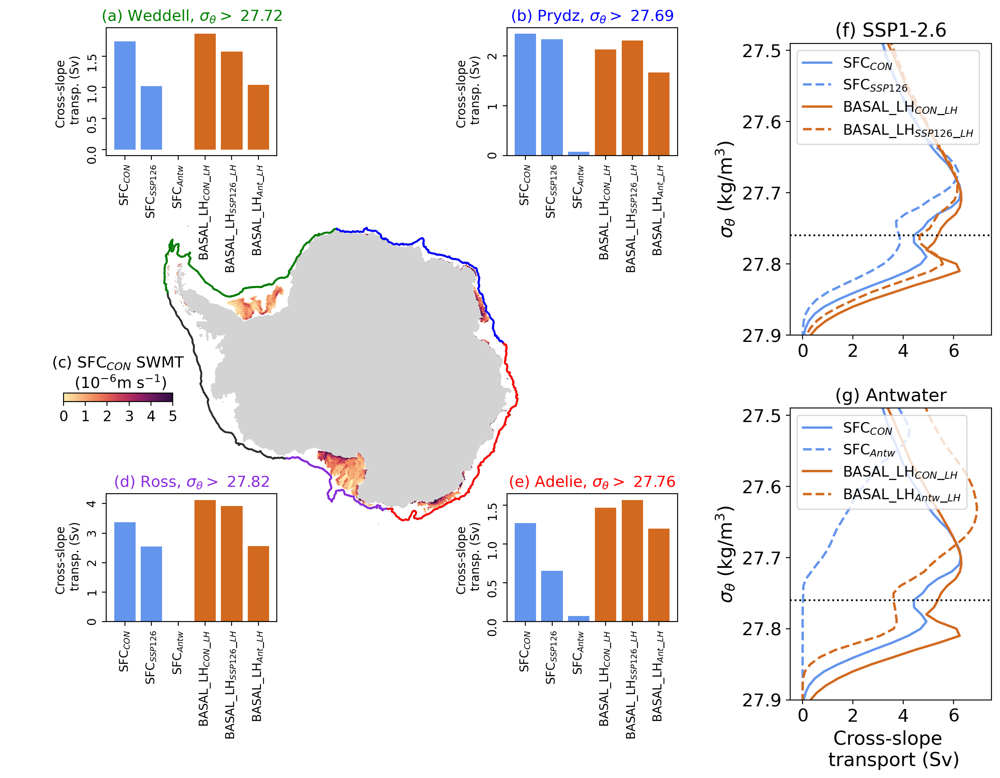

In [96]:
fig  = plt.figure(1, figsize = (16, 10))

# ---- MODIFIED GRID ----
gs = gridspec.GridSpec(1, 2, width_ratios = [4, 1.0]) 
gs.update(wspace = 0.1)

# Map stays the same
ax_map = plt.subplot(gs[0], projection=ccrs.SouthPolarStereo())

# Right side split vertically (this is the only structural change)
gs_right = gridspec.GridSpecFromSubplotSpec(
    2, 1,
    subplot_spec=gs[1],
    hspace=0.25
)

ax1 = plt.subplot(gs_right[0])
ax2 = plt.subplot(gs_right[1])

# Main South Pole map
ax_map.contourf(
    xt_ocean.xt_ocean, new_lat, land,
    levels=[0.5, 1.5],
    colors=['lightgray'],
    transform=ccrs.PlateCarree(),
    zorder=1
)

ax_map.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],
           colors='lightgray', alpha =0.8, transform = ccrs.PlateCarree())
ax_map.plot(lon_along_contour,lat_along_contour,color='k', alpha =0.8, transform = ccrs.PlateCarree())
ax_map.plot(lon_along_contour.sel(contour_index=Adelie),lat_along_contour.sel(contour_index=Adelie),'-',color='red', alpha =1, transform = ccrs.PlateCarree())
ax_map.plot(lon_along_contour.sel(contour_index=Ross),lat_along_contour.sel(contour_index=Ross),'-',color='blueviolet', alpha =1, transform = ccrs.PlateCarree())
ax_map.plot(lon_along_contour.sel(contour_index=Weddell),lat_along_contour.sel(contour_index=Weddell),'-',color='green', alpha =1, transform = ccrs.PlateCarree())
ax_map.plot(lon_along_contour.sel(contour_index=Prydz),lat_along_contour.sel(contour_index=Prydz),'-',color='blue', alpha =1, transform = ccrs.PlateCarree())
ax_map.axis('off')

plot_swmt = ax_map.pcolormesh(swmt_xt, swmt_yt, swmt_avg_ctrl_shelf,
                          vmin=0, vmax=5, cmap=cmo.matter,transform=ccrs.PlateCarree())

ax_map.set_extent([-180, 180, -90, -45], ccrs.PlateCarree())

# Positions for inset axes (relative to map)
positions = {
    'Weddell': [0.14, 0.82, 2., 1.5],
    'Ross': [0.14, 0.11, 2., 1.5],
    'Adelie': [0.75, 0.11, 2., 1.5],
    'Prydz': [0.75, 0.82, 2., 1.5]
}

# Add inset bar plots
for region, pos in positions.items():
    ax_inset = inset_axes(ax_map, width=pos[2], height=pos[3],
                          loc='lower left', bbox_to_anchor=(pos[0], pos[1], pos[2], pos[3]),
                          bbox_transform=ax_map.transAxes)
    ax_inset.bar(experiments, data_CST[region],
                 color=['cornflowerblue','cornflowerblue','cornflowerblue',
                        'chocolate','chocolate','chocolate'])

    if region=='Weddell':
        ax_inset.set_title('(a) '+region+r', $\sigma_{\theta} >$ 27.72', color='green', fontsize=13)
    elif region=='Prydz':
        ax_inset.set_title('(b) '+region+r', $\sigma_{\theta} >$ 27.69', color='blue', fontsize=13)
    elif region=='Adelie':
        ax_inset.set_title('(e) '+region+r', $\sigma_{\theta} >$ 27.76', color='red', fontsize=13)
    elif region=='Ross':
        ax_inset.set_title('(d) '+region+r', $\sigma_{\theta} >$ 27.82', color='blueviolet', fontsize=13)

    ax_inset.set_ylabel('Cross-slope \n transp. (Sv)', fontsize=10)
    ax_inset.tick_params(axis='x', labelsize=10, rotation=90)
    ax_inset.tick_params(axis='y', labelsize=10, rotation=90)


# cax = fig.add_axes([0.25, 0.41, 0., 0.18])
# cbar=plt.colorbar(plot_swmt, cax=cax, orientation='vertical',
#                   shrink = 0.5, ticks = [0, 1, 2, 3, 4, 5])
# cbar.set_label(r'SFC$_{CON}$ SWMT ($\times 10^{-6}$m s$^{-1}$)', fontsize = 12)
cax = fig.add_axes([0.22, 0.46, 0.08, 0.01])
cbar=plt.colorbar(plot_swmt, cax=cax, orientation='horizontal',
                  shrink = 0.5, ticks = [0, 1, 2, 3, 4, 5])
cbar.set_label('(c) SFC$_{CON}$ SWMT \n (10$^{-6}$m s$^{-1}$)', fontsize = 13)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=12)

# 2nd plot

b = (array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',label=r'SFC$_{CON}$',color='cornflowerblue',linewidth=2)
b = (array8.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',linestyle='--',label=r'SFC$_{SSP126}$',color='cornflowerblue',linewidth=2)
b = (array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',linestyle='-',label=r'BASAL_LH$_{CON}$_$_{LH}$',color='chocolate',linewidth=2)
b = (array9.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')  
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',linestyle='--',label=r'BASAL_LH$_{SSP126}$_$_{LH}$',color='chocolate',linewidth=2)

ax1.plot(np.arange(-2,10),1027.77*np.ones(np.arange(-2,10).size),':k')
ax1.legend(loc = 'upper left',fontsize=12)
ax1.set_ylim(1027.9,1027.5)
ax1.set_ylabel(r'$\sigma_{\theta}$ (kg/m$^3$)', fontsize = 16)
ax1.set_title('(f) SSP1-2.6', fontsize = 16)
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax1.set_yticks(np.arange(1027.91,1027.5,-.1),['27.9','27.8','27.7','27.6','27.5'])
ax1.set_xlim(-.5,7.5)
ax1.set_xticks(np.arange(0,7.5,2))
ax1.set_xlabel('')

b = (array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',label=r'SFC$_{CON}$',color='cornflowerblue',linewidth=2)
b = (array2.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',linestyle='--',label=r'SFC$_{Antw}$',color='cornflowerblue',linewidth=2)
b = (array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',linestyle='-',label=r'BASAL_LH$_{CON}$_$_{LH}$',color='chocolate',linewidth=2)
b = (array7.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')  
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',linestyle='--',label=r'BASAL_LH$_{Antw}$_$_{LH}$',color='chocolate',linewidth=2)

ax2.plot(np.arange(-2,10),1027.77*np.ones(np.arange(-2,10).size),':k')
ax2.legend(loc = 'upper left',fontsize=12)
ax2.set_ylim(1027.9,1027.5)
ax2.set_title('(g) Antwater', fontsize = 15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
ax2.set_xlabel('Cross-slope \n transport (Sv)', fontsize = 16)
ax2.set_ylabel(r'$\sigma_{\theta}$ (kg/m$^3$)', fontsize = 16)
ax2.set_yticks(np.arange(1027.91,1027.5,-.1),['27.9','27.8','27.7','27.6','27.5'])
ax2.set_xlim(-.5,7.5)
ax2.set_xticks(np.arange(0,7.5,2))

### Save fig
plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_Maps_ctrlxSOFIA_Fig1v3.png',
            bbox_inches='tight',dpi=300)
plt.show()

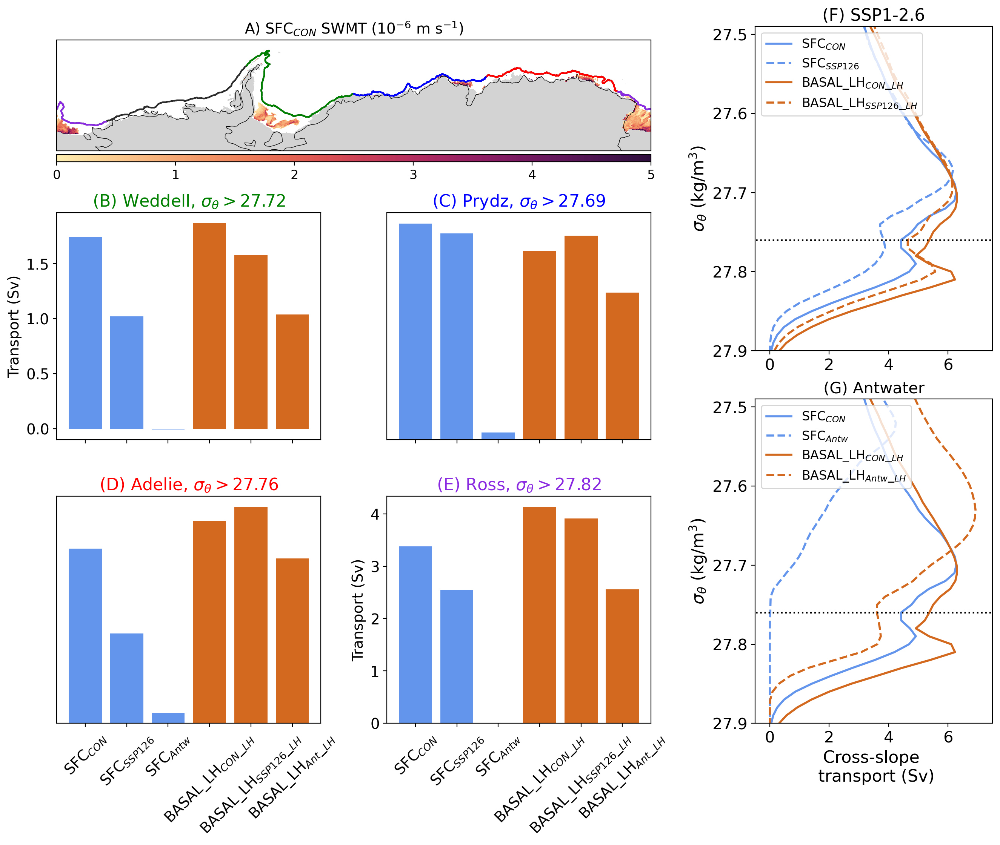

In [103]:
fig = plt.figure(figsize=(16,12))

gs = gridspec.GridSpec(
    4, 2,
    width_ratios=[3.5,1.4],
    height_ratios=[1,1,1,1],
    hspace=0.35,
    wspace=0.25
)

# Right column
ax1 = plt.subplot(gs[0:2,1])
ax2 = plt.subplot(gs[2:4,1])


# --------------------------------------------------------   Map
ax_map = plt.subplot(gs[0,0], projection=ccrs.PlateCarree())
ax_map.set_title('A) SFC$_{CON}$ SWMT (10$^{-6}$ m s$^{-1}$)',fontsize=14)



# Main South Pole map
ax_map.contourf(
    xt_ocean.xt_ocean, new_lat, land,
    levels=[0.5, 1.5],
    colors=['lightgray'],
    transform=ccrs.PlateCarree(),
    zorder=1
)

ax_map.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],
           colors='lightgray', alpha =0.8, transform = ccrs.PlateCarree())
ax_map.plot(lon_along_contour,lat_along_contour,color='k', alpha =0.8, transform = ccrs.PlateCarree())
ax_map.plot(lon_along_contour.sel(contour_index=Adelie),lat_along_contour.sel(contour_index=Adelie),'-',color='red', alpha =1, transform = ccrs.PlateCarree())
ax_map.plot(lon_along_contour.sel(contour_index=Ross),lat_along_contour.sel(contour_index=Ross),'-',color='blueviolet', alpha =1, transform = ccrs.PlateCarree())
ax_map.plot(lon_along_contour.sel(contour_index=Weddell),lat_along_contour.sel(contour_index=Weddell),'-',color='green', alpha =1, transform = ccrs.PlateCarree())
ax_map.plot(lon_along_contour.sel(contour_index=Prydz),lat_along_contour.sel(contour_index=Prydz),'-',color='blue', alpha =1, transform = ccrs.PlateCarree())
# ax_map.axis('off 

plot_swmt = ax_map.pcolormesh(swmt_xt, swmt_yt, swmt_avg_ctrl_shelf,
                          vmin=0, vmax=5, cmap=cmo.matter,transform=ccrs.PlateCarree())

ax_map.set_extent([-180, 180, -82, -58],ccrs.PlateCarree())
ax_map.coastlines(resolution='110m',color='k', linewidth=0.5)

ax_map.set_aspect(2.8)
# Position relative to map
pos = ax_map.get_position()

cax = fig.add_axes([
    pos.x0 ,           # same left edge as map
    pos.y0 - 0.012,   # slightly below map
    pos.width,        # same width as map
    0.008             # height of colorbar
])

cbar = plt.colorbar(
    plot_swmt,
    cax=cax,
    orientation='horizontal'
)
# cbar.ax.xaxis.set_label_position('top')

cbar.ax.tick_params(labelsize=12)
# cbar.set_label('(10$^{-6}$ m s$^{-1}$)',fontsize=12)


## --------------------------------------------------------- bar plots:
gs_bars = gridspec.GridSpecFromSubplotSpec(
    2, 2,
    subplot_spec=gs[1:4,0],
    hspace=0.25,
    wspace=0.25
)

bar_axes = {
    'Weddell': plt.subplot(gs_bars[0,0]),
    'Prydz'  : plt.subplot(gs_bars[0,1]),
    'Ross'   : plt.subplot(gs_bars[1,1]),
    'Adelie' : plt.subplot(gs_bars[1,0]),
}

for region, ax in bar_axes.items():

    ax.bar(
        experiments,
        data_CST[region],
        color=['cornflowerblue','cornflowerblue','cornflowerblue',
               'chocolate','chocolate','chocolate']
    )

    if region == 'Weddell':
        ax.set_title('(B) Weddell, $\sigma_\\theta > 27.72$',
                     color='green', fontsize=16)

    elif region == 'Prydz':
        ax.set_title('(C) Prydz, $\sigma_\\theta > 27.69$',
                     color='blue', fontsize=16)

    elif region == 'Adelie':
        ax.set_title('(D) Adelie, $\sigma_\\theta > 27.76$',
                     color='red', fontsize=16)

    elif region == 'Ross':
        ax.set_title('(E) Ross, $\sigma_\\theta > 27.82$',
                     color='blueviolet', fontsize=16)

    ax.set_ylabel('Transport (Sv)', fontsize=14)
    ax.tick_params(axis='y', labelsize=14)
    
    # Only bottom row gets x labels
    if region in ['Ross','Adelie']:
        ax.tick_params(axis='x', rotation=45, labelsize=14)
    else:
        ax.set_xticklabels([])

    if region in ['Prydz', 'Adelie']:
        ax.set_yticks([])
        ax.set_ylabel('')
    
# 2nd plot

b = (array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',label=r'SFC$_{CON}$',color='cornflowerblue',linewidth=2)
b = (array8.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',linestyle='--',label=r'SFC$_{SSP126}$',color='cornflowerblue',linewidth=2)
b = (array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',linestyle='-',label=r'BASAL_LH$_{CON}$_$_{LH}$',color='chocolate',linewidth=2)
b = (array9.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')  
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax1, y = 'isopycnal_bins',linestyle='--',label=r'BASAL_LH$_{SSP126}$_$_{LH}$',color='chocolate',linewidth=2)

ax1.plot(np.arange(-2,10),1027.77*np.ones(np.arange(-2,10).size),':k')
ax1.legend(loc = 'upper left',fontsize=12)
ax1.set_ylim(1027.9,1027.5)
ax1.set_ylabel(r'$\sigma_{\theta}$ (kg/m$^3$)', fontsize = 16)
ax1.set_title('(F) SSP1-2.6', fontsize = 16)
ax1.tick_params(axis='x', labelsize=15)
ax1.tick_params(axis='y', labelsize=15)
ax1.set_yticks(np.arange(1027.91,1027.5,-.1),['27.9','27.8','27.7','27.6','27.5'])
ax1.set_xlim(-.5,7.5)
ax1.set_xticks(np.arange(0,7.5,2))
ax1.set_xlabel('')

b = (array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',label=r'SFC$_{CON}$',color='cornflowerblue',linewidth=2)
b = (array2.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',linestyle='--',label=r'SFC$_{Antw}$',color='cornflowerblue',linewidth=2)
b = (array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',linestyle='-',label=r'BASAL_LH$_{CON}$_$_{LH}$',color='chocolate',linewidth=2)
b = (array7.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')  
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(ax=ax2, y = 'isopycnal_bins',linestyle='--',label=r'BASAL_LH$_{Antw}$_$_{LH}$',color='chocolate',linewidth=2)

ax2.plot(np.arange(-2,10),1027.77*np.ones(np.arange(-2,10).size),':k')
ax2.legend(loc = 'upper left',fontsize=12)
ax2.set_ylim(1027.9,1027.5)
ax2.set_title('(G) Antwater', fontsize = 15)
ax2.tick_params(axis='x', labelsize=15)
ax2.tick_params(axis='y', labelsize=15)
ax2.set_xlabel('Cross-slope \n transport (Sv)', fontsize = 16)
ax2.set_ylabel(r'$\sigma_{\theta}$ (kg/m$^3$)', fontsize = 16)
ax2.set_yticks(np.arange(1027.91,1027.5,-.1),['27.9','27.8','27.7','27.6','27.5'])
ax2.set_xlim(-.5,7.5)
ax2.set_xticks(np.arange(0,7.5,2))

### Save fig
plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_Maps_ctrlxSOFIA_Fig1v4.png',
            bbox_inches='tight',dpi=300)
plt.show()

Extracting values of DSW export:

In [118]:
data_CST['Weddell']

[array(1.74474196),
 array(1.02024462),
 array(-0.0053999),
 array(1.86848222),
 array(1.5782283),
 array(1.03995787)]

In [119]:
array1.isopycnal_bins.isel(isopycnal_bins=67)

<xarray.DataArray 'isopycnal_bins' ()> Size: 8B
array(1027.81)
Coordinates:
    isopycnal_bins  float64 8B 1.028e+03

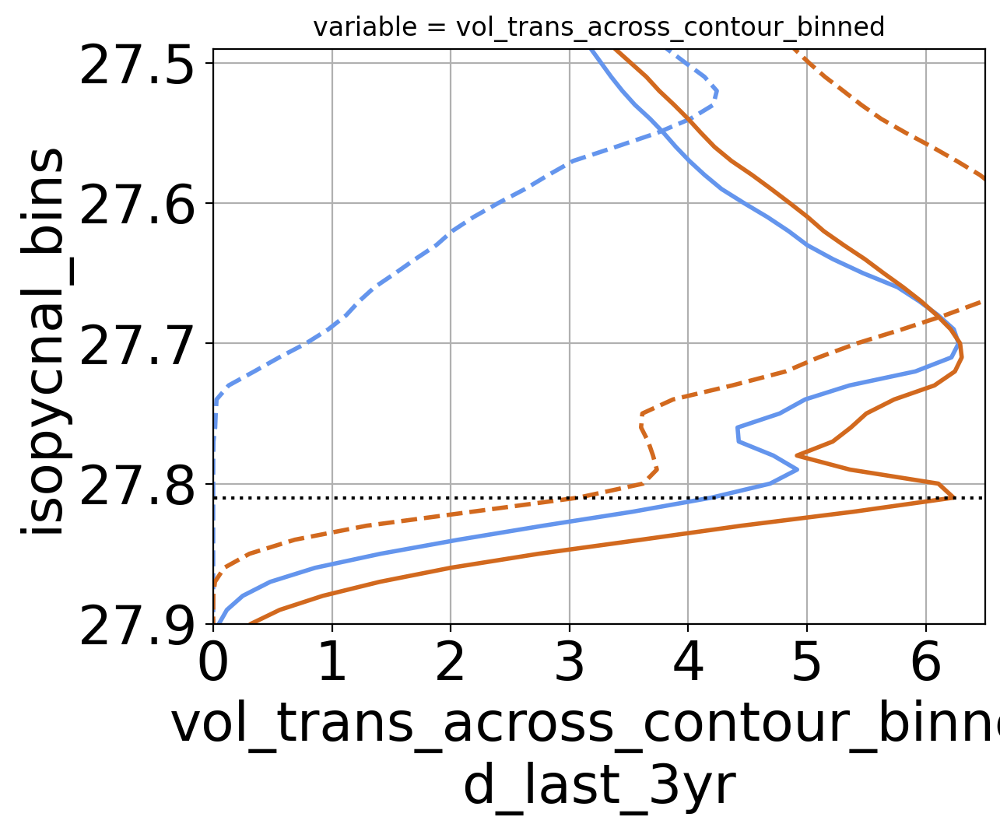

In [120]:
### SSP126:
# b = (array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
# (b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot( y = 'isopycnal_bins',label=r'SFC$_{CON}$',color='cornflowerblue',linewidth=2)
# b = (array8.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
# (b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot( y = 'isopycnal_bins',linestyle='--',label=r'SFC$_{SSP126}$',color='cornflowerblue',linewidth=2)
# b = (array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
# (b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot( y = 'isopycnal_bins',linestyle='-',label=r'BASAL_LH$_{CON}$_$_{LH}$',color='chocolate',linewidth=2)
# b = (array9.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')  
# (b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot( y = 'isopycnal_bins',linestyle='--',label=r'BASAL_LH$_{SSP126}$_$_{LH}$',color='chocolate',linewidth=2)

### Antwater:
b = (array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(y = 'isopycnal_bins',label=r'SFC$_{CON}$',color='cornflowerblue',linewidth=2)
b = (array2.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(y = 'isopycnal_bins',linestyle='--',label=r'SFC$_{Antw}$',color='cornflowerblue',linewidth=2)
b = (array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(y = 'isopycnal_bins',linestyle='-',label=r'BASAL_LH$_{CON}$_$_{LH}$',color='chocolate',linewidth=2)
b = (array7.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')  
(b.sum('isopycnal_bins') -b.cumsum('isopycnal_bins')).plot(y = 'isopycnal_bins',linestyle='--',label=r'BASAL_LH$_{Antw}$_$_{LH}$',color='chocolate',linewidth=2)

plt.plot(np.arange(-2,10),1027.82*np.ones(np.arange(-2,10).size),':k')
plt.ylim(1027.9,1027.5)
plt.yticks(np.arange(1027.91,1027.5,-.1),['27.9','27.8','27.7','27.6','27.5'])
plt.xticks(np.arange(-2,10))
plt.xlim(0,6.5)
plt.grid('on')

In [121]:
array1.isopycnal_bins.isel(isopycnal_bins=slice(63,70))

<xarray.DataArray 'isopycnal_bins' (isopycnal_bins: 7)> Size: 56B
array([1027.77, 1027.78, 1027.79, 1027.8 , 1027.81, 1027.82, 1027.83])
Coordinates:
  * isopycnal_bins  (isopycnal_bins) float64 56B 1.028e+03 ... 1.028e+03

In [122]:
#SFC_CON
aa=(array1.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
bb=(aa.sum('isopycnal_bins') -aa.cumsum('isopycnal_bins'))
bb[63:70]

<xarray.DataArray 'vol_trans_across_contour_binned_last_3yr' (isopycnal_bins: 7)> Size: 56B
array([4.41506504, 4.4254321 , 4.71645411, 4.91659889, 4.68923993,
       4.19503862, 3.53318929])
Coordinates:
  * isopycnal_bins  (isopycnal_bins) float64 56B 1.028e+03 ... 1.028e+03
    variable        <U31 124B 'vol_trans_across_contour_binned'

In [123]:
#SFC_ssp
aa=(array8.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
bb=(aa.sum('isopycnal_bins') -aa.cumsum('isopycnal_bins'))
bb[63:70]

<xarray.DataArray 'vol_trans_across_contour_binned_last_3yr' (isopycnal_bins: 7)> Size: 56B
array([3.83943965, 3.88054359, 3.75245837, 3.54038777, 3.20799535,
       2.72620092, 2.16238483])
Coordinates:
  * isopycnal_bins  (isopycnal_bins) float64 56B 1.028e+03 ... 1.028e+03
    variable        <U31 124B 'vol_trans_across_contour_binned'

In [124]:
#SFC_Antw
aa=(array2.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
bb=(aa.sum('isopycnal_bins') -aa.cumsum('isopycnal_bins'))
bb[63:70]

<xarray.DataArray 'vol_trans_across_contour_binned_last_3yr' (isopycnal_bins: 7)> Size: 56B
array([ 1.67210747e-02,  2.20475533e-03,  6.46793242e-04, -2.20602245e-05,
       -3.08514321e-07,  1.80411242e-16,  1.80411242e-16])
Coordinates:
  * isopycnal_bins  (isopycnal_bins) float64 56B 1.028e+03 ... 1.028e+03
    variable        <U31 124B 'vol_trans_across_contour_binned'

In [125]:
#BASAL_LH_CON_LH
aa=(array3.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
bb=(aa.sum('isopycnal_bins') -aa.cumsum('isopycnal_bins'))
bb[63:70]

<xarray.DataArray 'vol_trans_across_contour_binned_last_3yr' (isopycnal_bins: 7)> Size: 56B
array([5.36899455, 5.21650414, 4.91502339, 5.36072508, 6.10595992,
       6.23394689, 5.39389082])
Coordinates:
  * isopycnal_bins  (isopycnal_bins) float64 56B 1.028e+03 ... 1.028e+03
    variable        <U31 124B 'vol_trans_across_contour_binned'

In [126]:
#BASAL_LH_ssp_LH
aa=(array9.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
bb=(aa.sum('isopycnal_bins') -aa.cumsum('isopycnal_bins'))
bb[63:70]

<xarray.DataArray 'vol_trans_across_contour_binned_last_3yr' (isopycnal_bins: 7)> Size: 56B
array([4.64294855, 4.64187884, 4.98108483, 5.43211939, 5.56926651,
       5.08596706, 4.3045045 ])
Coordinates:
  * isopycnal_bins  (isopycnal_bins) float64 56B 1.028e+03 ... 1.028e+03
    variable        <U31 124B 'vol_trans_across_contour_binned'

In [127]:
#BASAL_LH_Antw_LH
aa=(array7.isel(variable=0)/1e6).sel(contour_index = slice(0,6002)).sum('contour_index')
bb=(aa.sum('isopycnal_bins') -aa.cumsum('isopycnal_bins'))
bb[63:70]

<xarray.DataArray 'vol_trans_across_contour_binned_last_3yr' (isopycnal_bins: 7)> Size: 56B
array([3.60280291, 3.66260144, 3.70338504, 3.73572494, 3.61974491,
       3.07401006, 2.18157219])
Coordinates:
  * isopycnal_bins  (isopycnal_bins) float64 56B 1.028e+03 ... 1.028e+03
    variable        <U31 124B 'vol_trans_across_contour_binned'

#### Figure 2: bar plots with all LH antwater experiments:

In [128]:
print('isopycnal threshold for each DSW region: ',
    results['control']['Weddell']["bb"].isopycnal_bins[58].values,
      results['control']['Weddell']["bb"].isopycnal_bins[68].values,
      results['control']['Weddell']["bb"].isopycnal_bins[63].values,
      results['control']['Weddell']["bb"].isopycnal_bins[55].values)

isopycnal threshold for each DSW region:  1027.7199999999998 1027.8199999999997 1027.7699999999998 1027.6899999999998


In [129]:
## getting results for bar plot with LH runs:

#adelie
results['BGB_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(63,-1))[0].values
iadelie=63 #55
#ross
results['BGB_antwater']['Ross']["bb"].isel(isopycnal_bins=slice(68,-1))[0].values
iross=68
#weddell
results['BGB_antwater']['Weddell']["bb"].isel(isopycnal_bins=slice(58,-1))[0].values
iweddell=58
#prydz
results['BGB_antwater']['Prydz']["bb"].isel(isopycnal_bins=slice(55,-1))[0].values
iprydz=55 #51


In [130]:
# define temporary variables to facilitate plotting:

# 1st per region
adelie_sfc_antw_anom = results['control_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values - results['control']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values
adelie_sfc_lh_antw_anom = results['control_gade_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values - results['control_gade']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values
adelie_sfc_antw_lh_anom = results['control_antwater_gade']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values - results['control']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values
adelie_basal_lh_antw_anom = results['BGB_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values - results['BGB']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values

ross_sfc_antw_anom = results['control_antwater']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values - results['control']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values
ross_sfc_lh_antw_anom = results['control_gade_antwater']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values - results['control_gade']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values
ross_sfc_antw_lh_anom = results['control_antwater_gade']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values - results['control']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values
ross_basal_lh_antw_anom = results['BGB_antwater']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values - results['BGB']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values

weddell_sfc_antw_anom = results['control_antwater']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values - results['control']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values
weddell_sfc_lh_antw_anom = results['control_gade_antwater']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values - results['control_gade']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values
weddell_sfc_antw_lh_anom = results['control_antwater_gade']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values - results['control']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values
weddell_basal_lh_antw_anom = results['BGB_antwater']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values - results['BGB']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values

prydz_sfc_antw_anom = results['control_antwater']['Prydz']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values - results['control']['Prydz']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values
prydz_sfc_lh_antw_anom = results['control_gade_antwater']['Prydz']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values - results['control_gade']['Prydz']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values
prydz_sfc_antw_lh_anom = results['control_antwater_gade']['Prydz']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values - results['control']['Prydz']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values
prydz_basal_lh_antw_anom = results['BGB_antwater']['Prydz']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values - results['BGB']['Prydz']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values



In [131]:
print(weddell_sfc_antw_anom, weddell_sfc_antw_lh_anom, weddell_sfc_lh_antw_anom, weddell_basal_lh_antw_anom)

-1.750141856972319 -1.7602673779903244 -0.9329031336998987 -0.8285243481320979


In [132]:
print(prydz_sfc_antw_anom, prydz_sfc_antw_lh_anom, prydz_sfc_lh_antw_anom, prydz_basal_lh_antw_anom)

-2.4501666031483365 -2.176163460241745 -0.282287549366953 -0.46674062597404165


In [133]:
print(ross_sfc_antw_anom, ross_sfc_antw_lh_anom, ross_sfc_lh_antw_anom, ross_basal_lh_antw_anom)

-3.3754677895923146 -3.1934467230322428 -0.9823975236656635 -1.568272737980152


In [134]:
print(adelie_sfc_antw_anom, adelie_sfc_antw_lh_anom, adelie_sfc_lh_antw_anom, adelie_basal_lh_antw_anom)

-1.020582068550942 -0.8194754580402406 -0.2433317289568262 -0.26956282761944017


In [135]:
# 2nd calculate the total (sum of each DSW formation region) and estimate the total anomaly:

total_control = results['control']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values + \
                results['control']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values + \
                results['control']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values + \
                results['control']['Adelie']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values

total_control_gade = results['control_gade']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values + \
                results['control_gade']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values + \
                results['control_gade']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values + \
                results['control_gade']['Adelie']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values

total_BGB = results['BGB']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values + \
                results['BGB']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values + \
                results['BGB']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values + \
                results['BGB']['Adelie']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values

total_control_antwater = results['control_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values + \
                            results['control_antwater']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values + \
                            results['control_antwater']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values + \
                            results['control_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values


total_control_gade_antwater = results['control_gade_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values + \
                                results['control_gade_antwater']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values + \
                                results['control_gade_antwater']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values + \
                                results['control_gade_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values

total_control_antwater_gade = results['control_antwater_gade']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values + \
                                results['control_antwater_gade']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values + \
                                results['control_antwater_gade']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values + \
                                results['control_antwater_gade']['Adelie']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values


total_BGB = results['BGB']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values + \
                results['BGB']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values + \
                results['BGB']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values + \
                results['BGB']['Adelie']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values

total_BGB_antwater = results['BGB_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(iadelie,-1))[0].values + \
                        results['BGB_antwater']['Ross']["bb"].isel(isopycnal_bins=slice(iross,-1))[0].values + \
                        results['BGB_antwater']['Weddell']["bb"].isel(isopycnal_bins=slice(iweddell,-1))[0].values + \
                        results['BGB_antwater']['Adelie']["bb"].isel(isopycnal_bins=slice(iprydz,-1))[0].values

total_sfc_antw_anom = total_control_antwater - total_control
total_sfc_lh_antw_anom = total_control_gade_antwater - total_control_gade
total_sfc_antw_lh_anom = total_control_antwater_gade - total_control
total_basal_lh_antw_anom = total_BGB_antwater - total_BGB

In [136]:
print(total_sfc_antw_anom, total_sfc_antw_lh_anom, total_sfc_lh_antw_anom, total_basal_lh_antw_anom)

-7.342582963017267 -6.204151636285426 -2.4075638344249075 -2.6172629843687343


In [137]:
np.arange(0,7.5,2.5)

array([0. , 2.5, 5. ])

/jobfs/178316562.gadi-pbs/ipykernel_2058100/274131429.py:48: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_yticklabels(ax1.get_yticks(), fontsize=16)


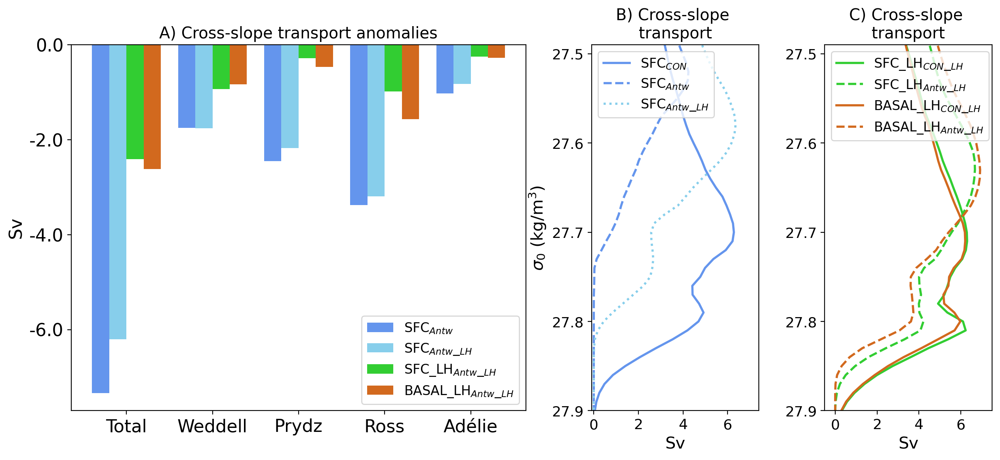

In [139]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['font.size'] = 12

fig = plt.figure(figsize=(15,6))
gs = fig.add_gridspec(1, 3, width_ratios=[1.9, .7, .7], wspace=0.25)

ax1 = fig.add_subplot(gs[0, 0])   
ax2 = fig.add_subplot(gs[0, 1])   
ax3 = fig.add_subplot(gs[0, 2])   

# Data
total = [total_sfc_antw_anom, total_sfc_antw_lh_anom, total_sfc_lh_antw_anom, total_basal_lh_antw_anom]
adelie = [adelie_sfc_antw_anom, adelie_sfc_antw_lh_anom, adelie_sfc_lh_antw_anom, adelie_basal_lh_antw_anom]
ross = [ross_sfc_antw_anom, ross_sfc_antw_lh_anom, ross_sfc_lh_antw_anom, ross_basal_lh_antw_anom]
weddell = [weddell_sfc_antw_anom, weddell_sfc_antw_lh_anom, weddell_sfc_lh_antw_anom, weddell_basal_lh_antw_anom]
prydz = [prydz_sfc_antw_anom, prydz_sfc_antw_lh_anom, prydz_sfc_lh_antw_anom, prydz_basal_lh_antw_anom]

colornames = ['cornflowerblue','skyblue','limegreen','chocolate']
labelnames = [r'SFC$_{Antw}$', r'SFC$_{Antw}$_$_{LH}$', r'SFC_LH$_{Antw}$_$_{LH}$', r'BASAL_LH$_{Antw}$_$_{LH}$']

regions = [total, weddell, prydz, ross, adelie]
region_names = ["Total","Weddell", "Prydz", "Ross", "Adélie"]

# Bar settings
n_groups = 5
n_bars = 4
group_positions = np.arange(n_groups)
bar_width = 0.2
offsets = np.linspace(-1.5*bar_width, 1.5*bar_width, n_bars)

# Plot bars
for i, region in enumerate(regions):
    for j in range(n_bars):
        ax1.bar(group_positions[i] + offsets[j],
                region[j],
                width=bar_width,
                color=colornames[j],
                label=labelnames[j] if i == 0 else None)

# Legend
ax1.legend(fontsize=12)

# Axis labels
ax1.set_xticks(group_positions)
ax1.set_xticklabels(region_names, fontsize=16)
ax1.set_yticklabels(ax1.get_yticks(), fontsize=16)

ax1.set_ylabel("Sv", fontsize=16)
# ax1.set_title("Anomalies by Region and Experiments", fontsize=18)
ax1.set_title('A) Cross-slope transport anomalies')

# OPEN FROM SAVED ARRAY
b = (array1.isel(variable=0)/1e6).sum('contour_index')
(ax2.plot((b.sum('isopycnal_bins') - b.cumsum('isopycnal_bins')), 
          b['isopycnal_bins'], label=r'SFC$_{CON}$', color='cornflowerblue',linewidth=2))

b = (array2.isel(variable=0)/1e6).sum('contour_index')
ax2.plot((b.sum('isopycnal_bins') - b.cumsum('isopycnal_bins')),
         b['isopycnal_bins'], linestyle='--', label=r'SFC$_{Antw}$', color='cornflowerblue',linewidth=2)

b = (array3.isel(variable=0)/1e6).sum('contour_index')
ax3.plot((b.sum('isopycnal_bins') - b.cumsum('isopycnal_bins')),
         b['isopycnal_bins'], linestyle='-', label=r'SFC_LH$_{CON}$_$_{LH}$', color='limegreen',linewidth=2)

b = (array4.isel(variable=0)/1e6).sum('contour_index')
ax3.plot((b.sum('isopycnal_bins') - b.cumsum('isopycnal_bins')),
         b['isopycnal_bins'], linestyle='--', label=r'SFC_LH$_{Antw}$_$_{LH}$', color='limegreen',linewidth=2)

b = (array5.isel(variable=0)/1e6).sum('contour_index')
ax2.plot((b.sum('isopycnal_bins') - b.cumsum('isopycnal_bins')),
         b['isopycnal_bins'], linestyle=':', label=r'SFC$_{Antw}$_$_{LH}$', color='skyblue',linewidth=2)

b = (array6.isel(variable=0)/1e6).sum('contour_index')
ax3.plot((b.sum('isopycnal_bins') - b.cumsum('isopycnal_bins')),
         b['isopycnal_bins'], linestyle='-', label=r'BASAL_LH$_{CON}$_$_{LH}$', color='chocolate',linewidth=2)

b = (array7.isel(variable=0)/1e6).sum('contour_index')
ax3.plot((b.sum('isopycnal_bins') - b.cumsum('isopycnal_bins')),
         b['isopycnal_bins'], linestyle='--', label=r'BASAL_LH$_{Antw}$_$_{LH}$', color='chocolate',linewidth=2)


# Axis formatting
ax2.set_ylim(1027.9, 1027.5)
ax2.set_yticks(np.arange(1027.91,1027.5,-.1),['27.9','27.8','27.7','27.6','27.5'])
ax2.set_xlim(-.1,7.4)
ax2.set_xticks(np.arange(0,7.5,2))
ax2.set_ylabel(r'$\sigma_0$ (kg/m$^3$)', fontsize=15)
ax2.set_xlabel('Sv', fontsize=15)
ax2.tick_params(axis='x', labelsize=13)
ax2.tick_params(axis='y', labelsize=13)
ax2.legend(loc='upper left', fontsize=12)
ax2.set_title('B) Cross-slope \n transport ')

ax3.set_ylim(1027.9, 1027.5)
ax3.set_yticks(np.arange(1027.91,1027.5,-.1),['27.9','27.8','27.7','27.6','27.5'])
ax3.set_xlim(-.5,7.5)
ax3.set_xticks(np.arange(0,7.5,2))
ax3.set_xlabel('Sv', fontsize=15)
ax3.tick_params(axis='x', labelsize=13)
ax3.tick_params(axis='y', labelsize=13)
ax3.legend(loc='upper left', fontsize=12)
ax3.set_title('C) Cross-slope \n transport ')

### Save fig
plt.savefig(figdir+'Cross-slope_annual_yr17-20_BarPLots_SOFIA-Antwater_Fig2.png',bbox_inches='tight',dpi=300)

In [138]:
figdir

'/g/data/e14/fbd581/basal_mom5-collaborative-project/figures/'

In [139]:
## print values
# OPEN FROM SAVED ARRAY
b1= (array1.isel(variable=0)/1e6).sum('contour_index')
a1=(b1.sum('isopycnal_bins') - b1.cumsum('isopycnal_bins')) #'SFC$_{CON}$
a1

b2 = (array2.isel(variable=0)/1e6).sum('contour_index')
a2=(b2.sum('isopycnal_bins') - b2.cumsum('isopycnal_bins')) #SFC$_{Antw}$
a2

b3 = (array3.isel(variable=0)/1e6).sum('contour_index')
a3=(b3.sum('isopycnal_bins') - b3.cumsum('isopycnal_bins')) #SFC_LH$_{CON}$_$_{LH}$
a3

b4 = (array4.isel(variable=0)/1e6).sum('contour_index')
a4=(b4.sum('isopycnal_bins') - b4.cumsum('isopycnal_bins')) #SFC_LH$_{Antw}$_$_{LH}$
a4

b5 = (array5.isel(variable=0)/1e6).sum('contour_index')
a5=(b5.sum('isopycnal_bins') - b5.cumsum('isopycnal_bins')) #SFC$_{Antw}$_$_{LH}$
a5

b6 = (array6.isel(variable=0)/1e6).sum('contour_index')
a6=(b6.sum('isopycnal_bins') - b6.cumsum('isopycnal_bins')) #BASAL_LH$_{CON}$_$_{LH}$
a6

b7 = (array7.isel(variable=0)/1e6).sum('contour_index')
a7=(b7.sum('isopycnal_bins') - b7.cumsum('isopycnal_bins')) #BASAL_LH$_{Antw}$_$_{LH}$
a7

<xarray.DataArray 'vol_trans_across_contour_binned_last_3yr' (
                                                              isopycnal_bins: 128)> Size: 1kB
array([-1.35129240e-01, -1.34451521e-01, -1.34565929e-01, -1.34922184e-01,
       -1.35533205e-01, -1.35334821e-01, -1.33940295e-01, -1.33229624e-01,
       -1.32750506e-01, -1.32027842e-01, -1.31069040e-01, -1.28744774e-01,
       -1.26824037e-01, -1.24635187e-01, -1.21972323e-01, -1.15187494e-01,
       -1.03200711e-01, -8.66704479e-02, -6.81784861e-02, -4.28357496e-02,
       -1.12581944e-02,  2.43524273e-02,  7.14242603e-02,  1.23543660e-01,
        1.97900729e-01,  2.92635384e-01,  4.08918085e-01,  5.54823231e-01,
        6.87031327e-01,  8.75587954e-01,  1.18662014e+00,  1.58340691e+00,
        2.06011966e+00,  2.59625079e+00,  3.27897108e+00,  4.25141226e+00,
        4.89263233e+00,  5.01638696e+00,  5.15101509e+00,  5.30501068e+00,
        5.45712001e+00,  5.62473259e+00,  5.83265262e+00,  6.05308048e+00,
        6.26040561e+00,  6.45607646e+00,  6.60780494e+00,  6.74000598e+00,
        6.82149908e+00,  6.88836696e+00,  6.92392685e+00,  6.90649773e+00,
        6.83529386e+00,  6.69916184e+00,  6.48186039e+00,  6.16095659e+00,
        5.80162577e+00,  5.42067863e+00,  5.09839292e+00,  4.82124042e+00,
        4.37040792e+00,  3.87195900e+00,  3.61339425e+00,  3.60280291e+00,
        3.66260144e+00,  3.70338504e+00,  3.73572494e+00,  3.61974491e+00,
        3.07401006e+00,  2.18157219e+00,  1.29227566e+00,  6.86774930e-01,
        3.05381284e-01,  9.27629024e-02,  1.49318952e-02,  1.01242659e-03,
        8.21285050e-05, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16,
       -1.38777878e-16, -1.38777878e-16, -1.38777878e-16, -1.38777878e-16])
Coordinates:
  * isopycnal_bins  (isopycnal_bins) float64 1kB 1e+03 1.024e+03 ... 1.04e+03
    variable        <U31 124B 'vol_trans_across_contour_binned'

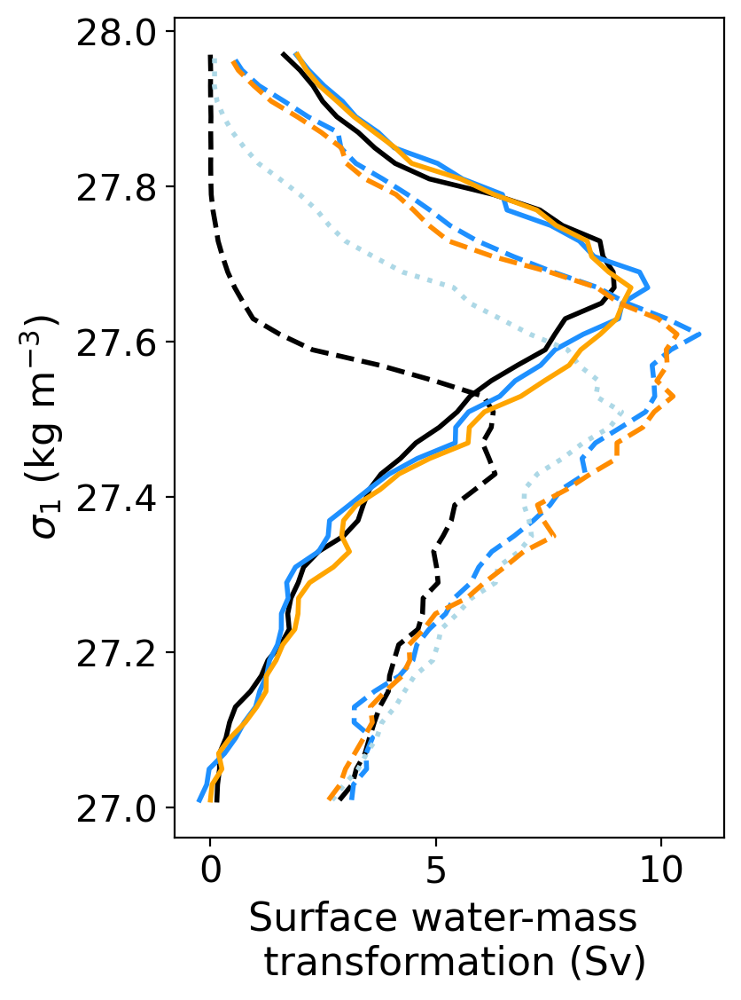

In [142]:
fig = plt.figure(figsize = (4,6))

# 2nd plot
plt.plot(swmt_ctrl_shelf_sum,isopycnal_bin_mid_ctrl, label='control', color='k',linewidth=2)
plt.plot(swmt_ctrl_a_shelf_sum,isopycnal_bin_mid_ctrl_a,'--', label='control Antwater', color='k',linewidth=2)
plt.plot(swmt_ctrlBG_shelf_sum,isopycnal_bin_mid_ctrl_a,'-', label='control LH', color='dodgerblue',linewidth=2)
plt.plot(swmt_ctrlBG_a_shelf_sum,isopycnal_bin_mid_ctrl_a,'--', label='control LH Antwater', color='dodgerblue',linewidth=2)
plt.plot(swmt_ctrl_a_BG_shelf_sum,isopycnal_bin_mid_ctrl_a,':', label='control Antwater LH', color='lightblue',linewidth=2)
plt.plot(swmt_BGB_shelf_sum,isopycnal_bin_mid_BGB, label='basal_LH_brine', color='orange',linewidth=2)
plt.plot(swmt_BGB_a_shelf_sum,isopycnal_bin_mid_BGB_a,'--', label='basal LH Antwater', color='darkorange',linewidth=2)
# plt.ylim(1027.9, 1027.5)
# plt.yticks(np.arange(1027.91,1027.5,-.1),['27.9','27.8','27.7','27.6','27.5'])

plt.ylabel(r'$\sigma_{1}$ (kg m$^{-3}$)', fontsize = 16)
plt.xlabel('Surface water-mass \n transformation (Sv)', fontsize=16)
# plt.legend(loc='upper right', fontsize = 15);
plt.tick_params(axis='x', labelsize=15)  # Set x-tick font size
plt.tick_params(axis='y', labelsize=15)  # Set y-tick font size


plt.savefig(figdir+'SWMT_annual_shelf_yr17-20_ctrl_LH.png',bbox_inches='tight',dpi=200)
plt.show()

#### Work mask for SWMT>0 to obtain Delta salinity values for various experiments

In [109]:
# Create mask: True where WMT > 0
dsw_mask = swmt_avg_ctrl_shelf > 0

# Get indices (useful for looping or diagnostics)
dsw_indices = np.where(dsw_mask.values)

# Masked SWMT field (NaN elsewhere)
swmt_dsw_only = swmt_avg_ctrl_shelf.where(dsw_mask)

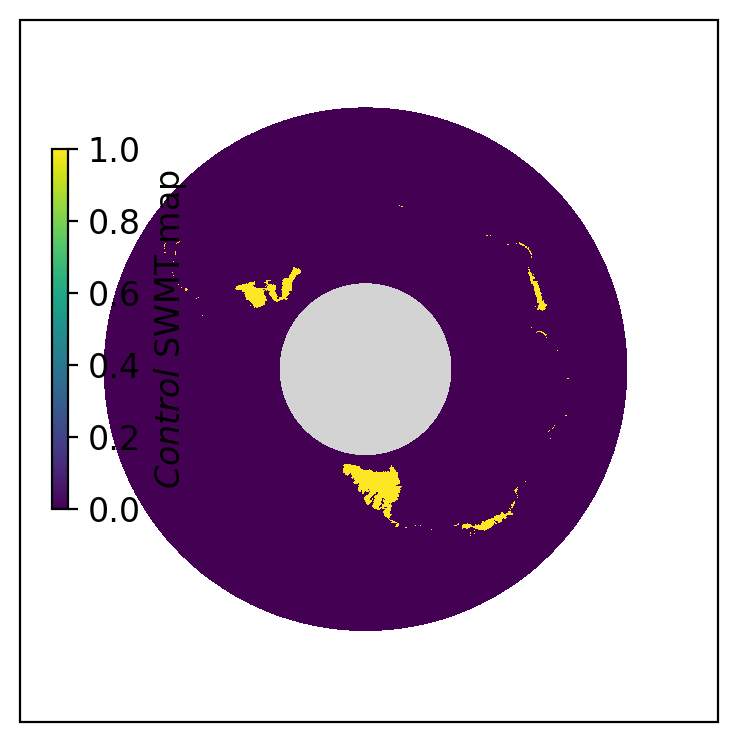

In [110]:
fig  = plt.figure(1, figsize = (8, 6))
gs = gridspec.GridSpec(1,3, width_ratios = [4.5, 1.5, 1.5]) 
gs.update(wspace = 0.1)

ax_map = plt.subplot(gs[0], projection=ccrs.SouthPolarStereo())

# Main South Pole map
ax_map.contourf(
    xt_ocean.xt_ocean, new_lat, land,
    levels=[0.5, 1.5],
    colors=['lightgray'],
    transform=ccrs.PlateCarree(),
    zorder=1
)
plot_swmt = ax_map.pcolormesh(swmt_xt, swmt_yt, dsw_mask,transform=ccrs.PlateCarree())
ax_map.set_extent([-180, 180, -90, -49], ccrs.PlateCarree())

cax = fig.add_axes([0.145, 0.38, 0.01, 0.3])
cbar=plt.colorbar(plot_swmt, cax=cax, orientation='vertical', shrink = 0.5)#, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5])
cbar.set_label(r'$\it{Control}$ SWMT map', fontsize = 12)
cbar.ax.tick_params(labelsize=12)


Save SWMT masks

In [111]:
ds_masks = xr.Dataset({
    "dsw_mask": dsw_mask,
    "swmt_dsw_only": swmt_dsw_only
})

ds_masks.to_netcdf("/g/data/e14/fbd581/basal_mom5-collaborative-project/dsw_masks.nc")

also save the DSW export values for each expts:

### Load Age tracer:


In [112]:
tmp = cat.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_ctrl = tmp.sel(time=slice(start_time, end_time))


In [113]:

tmp = cat_noBG.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_noBG = tmp.sel(time=slice(start_time, end_time))

In [114]:
tmp = cat_BGB.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_BGB = tmp.sel(time=slice(start_time, end_time))

# cat_BGB.search(variable='age_global', frequency='1mon').keys()

In [115]:
tmp = cat_sofia.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_ctrl_s = tmp.sel(time=slice(start_time, end_time))

tmp = cat_noBG_sofia.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_noBG_s = tmp.sel(time=slice(start_time, end_time))

tmp = cat_BGB_sofia.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_BGB_s = tmp.sel(time=slice(start_time, end_time))

In [116]:
tmp = cat_antwater.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_ctrl_a = tmp.sel(time=slice(start_time, end_time))

tmp = cat_BGB_antwater.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_BGB_a = tmp.sel(time=slice(start_time, end_time))

In [117]:
tmp = cat_ctrlBG.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_ctrlBG = tmp.sel(time=slice(start_time, end_time))

tmp = cat_ctrlBG_antwater.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_ctrlBG_a = tmp.sel(time=slice(start_time, end_time))

tmp = cat_ctrl_antwater_BG.search(variable='age_global', frequency='1mon').to_dask(decode_timedelta=True)
age_ctrl_a_BG = tmp.sel(time=slice(start_time, end_time))

In [118]:
day_in_month = age_BGB.time.dt.days_in_month
age_ctrl_mean = (age_ctrl*day_in_month).sum('time')/day_in_month.sum('time')
age_BGB_mean = (age_BGB*day_in_month).sum('time')/day_in_month.sum('time')
age_noBG_mean = (age_noBG*day_in_month).sum('time')/day_in_month.sum('time')

age_ctrl_s_mean = (age_ctrl_s*day_in_month).sum('time')/day_in_month.sum('time')
age_BGB_s_mean = (age_BGB_s*day_in_month).sum('time')/day_in_month.sum('time')
age_noBG_s_mean = (age_noBG_s*day_in_month).sum('time')/day_in_month.sum('time')


In [119]:
age_ctrl_a_mean = (age_ctrl_a*day_in_month).sum('time')/day_in_month.sum('time')
age_BGB_a_mean = (age_BGB_a*day_in_month).sum('time')/day_in_month.sum('time')


In [120]:
age_ctrlBG_mean = (age_ctrlBG*day_in_month).sum('time')/day_in_month.sum('time')
age_ctrlBG_a_mean = (age_ctrlBG_a*day_in_month).sum('time')/day_in_month.sum('time')
age_ctrl_a_BG_mean = (age_ctrl_a_BG*day_in_month).sum('time')/day_in_month.sum('time')


In [121]:
age_ctrl_mean = age_ctrl_mean.load()
age_BGB_mean = age_BGB_mean.load()
age_noBG_mean = age_noBG_mean.load()

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 11.75 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 11.11 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/cli

In [122]:
age_ctrl_s_mean = age_ctrl_s_mean.load()
age_noBG_s_mean = age_noBG_s_mean.load()
age_BGB_s_mean = age_BGB_s_mean.load()


In [123]:
age_ctrl_a_mean = age_ctrl_a_mean.load()
age_BGB_a_mean = age_BGB_a_mean.load()


In [124]:
age_ctrlBG_mean = age_ctrlBG_mean.load()
age_ctrlBG_a_mean = age_ctrlBG_a_mean.load()
age_ctrl_a_BG_mean = age_ctrl_a_BG_mean.load()


/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 11.59 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


In [125]:
depth_array = age_ctrl.isel(time =0) * 0 + age_ctrl.st_ocean
max_depth = depth_array.max(dim = 'st_ocean', skipna= True)

bottom_age_ctrl = age_ctrl_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_ctrl = bottom_age_ctrl.sum(dim = 'st_ocean')
bottom_age_ctrl = bottom_age_ctrl.load()


/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 5.44 GiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/dask/array/reductions.py:325: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/dask/array/reductions.py:325: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/dask/array/reductions.py:325: Runtim

In [126]:

bottom_age_noBG = age_noBG_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_noBG = bottom_age_noBG.sum(dim = 'st_ocean')
bottom_age_noBG = bottom_age_noBG.load()

bottom_age_BGB = age_BGB_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_BGB = bottom_age_BGB.sum(dim = 'st_ocean')
bottom_age_BGB = bottom_age_BGB.load()

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 5.44 GiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 5.44 GiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


In [127]:
bottom_age_ctrl_s = age_ctrl_s_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_ctrl_s = bottom_age_ctrl_s.sum(dim = 'st_ocean')
bottom_age_ctrl_s = bottom_age_ctrl_s.load()

bottom_age_noBG_s = age_noBG_s_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_noBG_s = bottom_age_noBG_s.sum(dim = 'st_ocean')
bottom_age_noBG_s = bottom_age_noBG_s.load()

bottom_age_BGB_s = age_BGB_s_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_BGB_s = bottom_age_BGB_s.sum(dim = 'st_ocean')
bottom_age_BGB_s = bottom_age_BGB_s.load()

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 5.44 GiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 5.44 GiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/clien

In [128]:
bottom_age_ctrl_a = age_ctrl_a_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_ctrl_a = bottom_age_ctrl_a.sum(dim = 'st_ocean')
bottom_age_ctrl_a = bottom_age_ctrl_a.load()

bottom_age_BGB_a = age_BGB_a_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_BGB_a = bottom_age_BGB_a.sum(dim = 'st_ocean')
bottom_age_BGB_a = bottom_age_BGB_a.load()

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 5.44 GiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 5.44 GiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


In [129]:
bottom_age_ctrlBG = age_ctrlBG_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_ctrlBG = bottom_age_ctrlBG.sum(dim = 'st_ocean')
bottom_age_ctrlBG = bottom_age_ctrlBG.load()

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 5.44 GiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


In [130]:
bottom_age_ctrlBG_a = age_ctrlBG_a_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_ctrlBG_a = bottom_age_ctrlBG_a.sum(dim = 'st_ocean')
bottom_age_ctrlBG_a = bottom_age_ctrlBG_a.load()

bottom_age_ctrl_a_BG = age_ctrl_a_BG_mean.where(depth_array.st_ocean >= max_depth)
bottom_age_ctrl_a_BG = bottom_age_ctrl_a_BG.sum(dim = 'st_ocean')
bottom_age_ctrl_a_BG = bottom_age_ctrl_a_BG.load()

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 5.44 GiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.05/lib/python3.12/site-packages/distributed/client.py:3387: UserWarning: Sending large graph of size 5.44 GiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


In [131]:
ht = cat.search(variable='ht').to_dask(decode_timedelta=True)
ht = ht.sel(yt_ocean = slice(-90, -59))
land_mask = (ht*0).fillna(1)
yt_ocean = ht.yt_ocean.values
xt_ocean = ht.xt_ocean.values
ht_shelf , shelf_mask = shelf_mask_isobath(ht)



ESMDataSourceError: Failed to load dataset with key='ocean.fx.xt_ocean:3600.xu_ocean:3600.yt_ocean:2700.yu_ocean:2700.point'
                 You can use `cat['ocean.fx.xt_ocean:3600.xu_ocean:3600.yt_ocean:2700.yu_ocean:2700.point'].df` to inspect the assets/files for this key.
                 

In [ ]:
# lat_slice = slice(-80,-57.6)
# lat_slice = slice(-90, -60)
lat_slice  = slice(0,510)

bottom_age_ctrl['age_global'].isel(yt_ocean=lat_slice)


In [ ]:
fig = plt.figure(figsize=(15, 10))
# plt.pcolormesh(xt_ocean, yt_ocean, land_mask, alpha = 0.6 )
plt.contourf(xt_ocean, yt_ocean, land_mask, [0.9, 1],colors = 'k', alpha = 0.6 )
plt.colorbar()

In [ ]:

fig = plt.figure(figsize=(30, 20))

plt.contour(xt_ocean, yt_ocean, land_mask, [0, 1],colors = 'k', alpha = 0.6 )
plt.contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmt = plt.pcolormesh(xt_ocean, yt_ocean, bottom_age_ctrl['age_global'].isel(yt_ocean=lat_slice),vmin=0, vmax=20, cmap=cmo.matter_r)
plt.contourf(xt_ocean, yt_ocean, land_mask, [0.9, 1],colors = 'k', alpha = 0.6 )

plt.xticks([-250,-200,-150,-100,-50,0,50])
plt.xticklabels(['-250','-200','-150','-100','-50','0','50'])
plt.yticks([-80,-75,-70,-65,-60])
plt.yticklabels(['-80','-75','-70','-65','-60'])
plt.ylim([-80,-60])

In [ ]:
### Figure Age tracer anomalies:

lat_slice  = slice(-90,-59)

fig = plt.figure(figsize=(30, 20))

# Define a GridSpec with 3 rows and 3 columns (extra column for the tall panel)
gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1, 1], height_ratios=[1, 1, 1], figure=fig)

# Create the 6 main panels (3 rows × 2 columns)
axes_main = []
for row in range(3):
    for col in range(3):
        ax = fig.add_subplot(gs[row, col])
        axes_main.append(ax)

for i, ax in enumerate(axes_main, start=1):
    ax.set_title(f"Panel {i}")

axes_main[0].contour(xt_ocean, yt_ocean, land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[0].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmt = axes_main[0].pcolormesh(xt_ocean, yt_ocean, bottom_age_ctrl['age_global'].sel(yt_ocean=lat_slice),vmin=0, vmax=20, cmap=cmo.matter_r)
axes_main[0].contourf(xt_ocean, yt_ocean, land_mask, [0.9, 1],colors = 'k', alpha = 0.6 )
axes_main[0].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[0].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[0].set_yticks([-80,-75,-70,-65,-60])
axes_main[0].set_yticklabels(['-80','-75','-70','-65','-60'])
axes_main[0].set_ylim([-80,-60])

   ## 2:
axes_main[1].contour(xt_ocean, yt_ocean, land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[1].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmt = axes_main[1].pcolormesh(xt_ocean, yt_ocean, bottom_age_ctrlBG['age_global'].sel(yt_ocean=lat_slice),vmin=0, vmax=20, cmap=cmo.matter_r)
axes_main[1].contourf(xt_ocean, yt_ocean, land_mask, [0.9, 1],colors = 'k', alpha = 0.6 )
axes_main[1].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[1].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[1].set_yticks([-80,-75,-70,-65,-60])
axes_main[1].set_yticklabels(['-80','-75','-70','-65','-60'])
axes_main[1].set_ylim([-80,-60])

## 2:
axes_main[2].contour(xt_ocean, yt_ocean, land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[2].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmt = axes_main[2].pcolormesh(xt_ocean, yt_ocean, bottom_age_BGB['age_global'].sel(yt_ocean=lat_slice),vmin=0, vmax=20, cmap=cmo.matter_r)
axes_main[2].contourf(xt_ocean, yt_ocean, land_mask, [0.9, 1],colors = 'k', alpha = 0.6 )
axes_main[2].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[2].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[2].set_yticks([-80,-75,-70,-65,-60])
axes_main[2].set_yticklabels(['-80','-75','-70','-65','-60'])
axes_main[2].set_ylim([-80,-60])

## 3:
axes_main[3].contour(xt_ocean, yt_ocean, land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[3].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmtA = axes_main[3].pcolormesh(xt_ocean, yt_ocean, bottom_age_ctrl_a['age_global'].sel(yt_ocean=lat_slice) - 
                                     bottom_age_ctrl['age_global'].sel(yt_ocean=lat_slice),vmin=-16, vmax=16, cmap=cmo.balance)
axes_main[3].contourf(xt_ocean, yt_ocean, land_mask, [0.9, 1],colors = 'k', alpha = 0.6 )
axes_main[3].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[3].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[3].set_yticks([-80,-75,-70,-65,-60])
axes_main[3].set_yticklabels(['-80','-75','-70','-65','-60'])
axes_main[3].set_ylim([-80,-60])

## 4:
axes_main[4].contour(xt_ocean, yt_ocean, land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[4].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmtA = axes_main[4].pcolormesh(xt_ocean, yt_ocean, bottom_age_ctrlBG_a['age_global'].sel(yt_ocean=lat_slice) - 
                                     bottom_age_ctrlBG['age_global'].sel(yt_ocean=lat_slice),vmin=-16, vmax=16, cmap=cmo.balance)
axes_main[4].contourf(xt_ocean, yt_ocean, land_mask, [0.9, 1],colors = 'k', alpha = 0.6 )
axes_main[4].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[4].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[4].set_yticks([-80,-75,-70,-65,-60])
axes_main[4].set_yticklabels(['-80','-75','-70','-65','-60'])
axes_main[4].set_ylim([-80,-60])

## 5:
axes_main[5].contour(xt_ocean, yt_ocean, land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[5].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmtA = axes_main[5].pcolormesh(xt_ocean, yt_ocean, bottom_age_BGB_a['age_global'].sel(yt_ocean=lat_slice) - 
                                     bottom_age_BGB['age_global'].sel(yt_ocean=lat_slice),vmin=-16, vmax=16, cmap=cmo.balance)
axes_main[5].contourf(xt_ocean, yt_ocean, land_mask, [0.9, 1],colors = 'k', alpha = 0.6 )
axes_main[5].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[5].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[5].set_yticks([-80,-75,-70,-65,-60])
axes_main[5].set_yticklabels(['-80','-75','-70','-65','-60'])
axes_main[5].set_ylim([-80,-60])

## 6:
axes_main[6].contour(xt_ocean, yt_ocean, land_mask, [0, 1],colors = 'k', alpha = 0.6 )
axes_main[6].contour(shelf_mask.xt_ocean, shelf_mask.yt_ocean, shelf_mask, [0, 1],colors='k', alpha = 0.3)
plot_swmtA = axes_main[6].pcolormesh(xt_ocean, yt_ocean, bottom_age_ctrl_a_BG['age_global'].sel(yt_ocean=lat_slice) - 
                                     bottom_age_ctrl['age_global'].sel(yt_ocean=lat_slice),vmin=-16, vmax=16, cmap=cmo.balance)
axes_main[6].contourf(xt_ocean, yt_ocean, land_mask, [0.9, 1],colors = 'k', alpha = 0.6 )
axes_main[6].set_xticks([-250,-200,-150,-100,-50,0,50])
axes_main[6].set_xticklabels(['-250','-200','-150','-100','-50','0','50'])
axes_main[6].set_yticks([-80,-75,-70,-65,-60])
axes_main[6].set_yticklabels(['-80','-75','-70','-65','-60'])
axes_main[6].set_ylim([-80,-60])

axes_main[0].set_title('a) Control', fontsize = 24)
axes_main[1].set_title('b) Control_LH', fontsize = 24)
axes_main[2].set_title('c) Basal_LH_Brine', fontsize = 24)
axes_main[3].set_title('d) Control_Antwater', fontsize = 24)
axes_main[4].set_title('e) Control_LH_Antwater', fontsize = 24)
axes_main[5].set_title('f) Basal_LH_brine_Antwater', fontsize = 24)
axes_main[6].set_title('g) Control_Antwater_LH', fontsize = 24)

cax = fig.add_axes([0.017, 0.66, 0.01, 0.21])
cbar=plt.colorbar(plot_swmt, cax=cax, orientation='vertical', shrink = 0.5)#, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3])
cbar.set_label(r'Age tracer (years)', fontsize = 22)
cbar.ax.tick_params(labelsize=20)
cax = fig.add_axes([0.017, 0.112, 0.01, 0.495])
cbar=plt.colorbar(plot_swmtA, cax=cax, orientation='vertical', shrink = 0.5)#, ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3])
cbar.set_label(r'Age tracer anomaly (years)', fontsize = 22)
cbar.ax.tick_params(labelsize=20)

## Save fig
plt.savefig(figdir+'Age_annual_shelf_yr17-20_Maps_ctrl_LH.png',bbox_inches='tight',dpi=300)
